### 화면 가로 확장

In [1]:
# 화면 가로 확장 코드 (기본 width 50%)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

### 모듈 임포트

In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import tensorflow as tf
import csv
import os
import datetime

### GPU 확인

In [3]:
tf.test.gpu_device_name()

'/device:GPU:0'

### 3년치 데이터 합본 저장, 확인

In [4]:
df_3Y = pd.DataFrame()
for y in range(2013, 2016):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_3Y = pd.concat([df_3Y, df_y])
    
df_3Y = df_3Y.drop([df_3Y.columns[0]], axis=1)
df_3Y = df_3Y.reset_index(drop=True)
df_3Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-15.csv", encoding='cp949')

In [5]:
Data_3Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-15.csv', encoding='cp949')
Data_3Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26280 entries, 0 to 26279
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  26280 non-null  int64  
 1   DateTime    26280 non-null  int64  
 2   Graph_Date  26280 non-null  object 
 3   Day         26280 non-null  object 
 4   Holiday     26280 non-null  int64  
 5   Seq         26280 non-null  int64  
 6   Watt        26280 non-null  int64  
 7   Temp        26280 non-null  float64
dtypes: float64(1), int64(5), object(2)
memory usage: 1.6+ MB


### 4년치 데이터 합본 저장, 확인

In [6]:
df_4Y = pd.DataFrame()
for y in range(2013, 2017):
    file = './Combined_Data/'+str(y)+'_'+'House1_Ch1_Combined_Data_Y.csv'
    df_y= pd.read_csv(file, encoding='cp949')
    df_4Y = pd.concat([df_4Y, df_y])
    
df_4Y = df_4Y.drop([df_4Y.columns[0]], axis=1)
df_4Y = df_4Y.reset_index(drop=True)
df_4Y.to_csv("./Combined_Data/House1_Ch1_Combined_Data_13-16.csv", encoding='cp949')

In [7]:
Data_4Y = pd.read_csv('./Combined_Data/House1_Ch1_Combined_Data_13-16.csv', encoding='cp949')
Data_4Y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  35040 non-null  int64  
 1   DateTime    35040 non-null  int64  
 2   Graph_Date  35040 non-null  object 
 3   Day         35040 non-null  object 
 4   Holiday     35040 non-null  int64  
 5   Seq         35040 non-null  int64  
 6   Watt        35040 non-null  int64  
 7   Temp        35040 non-null  float64
dtypes: float64(1), int64(5), object(2)
memory usage: 2.1+ MB


### 각 연도별 csv 데이터 로드

In [8]:
Data_2013=pd.read_csv('./Combined_Data/2013_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2014=pd.read_csv('./Combined_Data/2014_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2015=pd.read_csv('./Combined_Data/2015_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')
Data_2016=pd.read_csv('./Combined_Data/2016_House1_Ch1_Combined_Data_Y.csv', encoding='cp949')

### Plt 그래프 함수

In [9]:
def Graph(name1, name2, year):
    font_head = {'color': 'w', 'weight': 'bold', 'size': 20}
    font_body = {'color': 'w', 'weight': 'bold', 'size': 15}

    # 1번째 그래프
    ax1 = plt.subplot(2, 1, 1)
    ax1.spines['left'].set_color('yellow')
    ax1.spines['left'].set_lw(2)
    ax1.spines['bottom'].set_color('yellow')
    ax1.spines['bottom'].set_lw(2)

    ax1.tick_params(axis='x', colors='white', size=10)
    ax1.tick_params(axis='x', colors='white', labelsize=15)
    ax1.tick_params(axis='y', colors='white', size=10)
    ax1.tick_params(axis='y', colors='white', labelsize=15)

    plt.plot(x, y1, '.-', color='y', linewidth=1)
    plt.title(name1, fontdict=font_head, pad=20)
    plt.xticks(visible=False)
    plt.ylabel('Watt',labelpad=15, fontdict=font_body)

    # 2번째 그래프
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.spines['left'].set_color('blue')
    ax2.spines['left'].set_lw(2)
    ax2.spines['bottom'].set_color('blue')
    ax2.spines['bottom'].set_lw(2)

    ax2.tick_params(axis='x', colors='white', size=10)
    ax2.tick_params(axis='x', colors='white', labelsize=15)
    ax2.tick_params(axis='y', colors='white', size=10)
    ax2.tick_params(axis='y', colors='white', labelsize=15)

    plt.plot(x, y2, '.-', color='b', linewidth=1)
    plt.title(name2, fontdict=font_head, pad=20)
    plt.xlabel('Time',labelpad=15, fontdict=font_body)
    plt.ylabel('Temp',labelpad=15, fontdict=font_body)
    
    if year==1:
        plt.xticks([0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    if year==3:
        plt.xticks([0, 365, 730], labels=['2013', '2014', '2015'])

    #plt.tight_layout()
    plt.show()

#### 1년치 그래프 확인

#### 2013

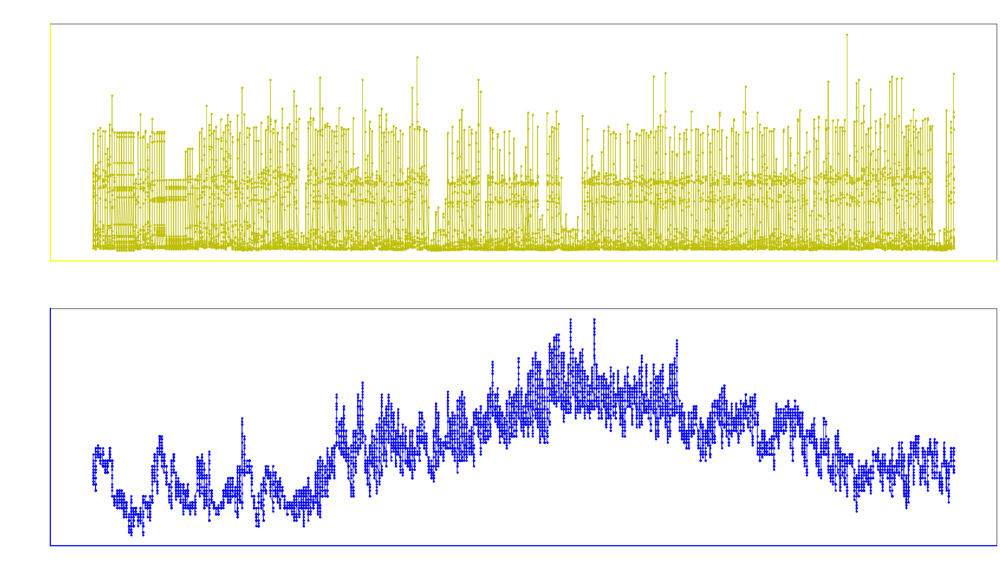

In [10]:
x = Data_2013['Graph_Date']
y1 = Data_2013['Watt']
y2 = Data_2013['Temp']

plt.figure(figsize=(30,17))

Graph("2013's Time-Watt Graph", "2013's Time-Temp Graph", 1)

#### 2014

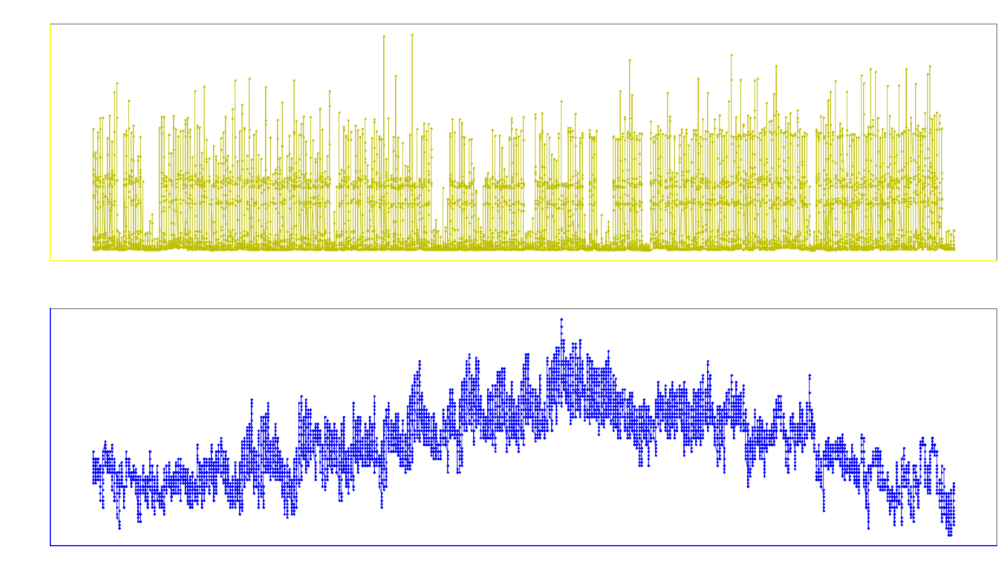

In [11]:
x = Data_2014['Graph_Date']
y1 = Data_2014['Watt']
y2 = Data_2014['Temp']

plt.figure(figsize=(30,17))

Graph("2014's Time-Watt Graph", "2014's Time-Temp Graph", 1)

#### 2015

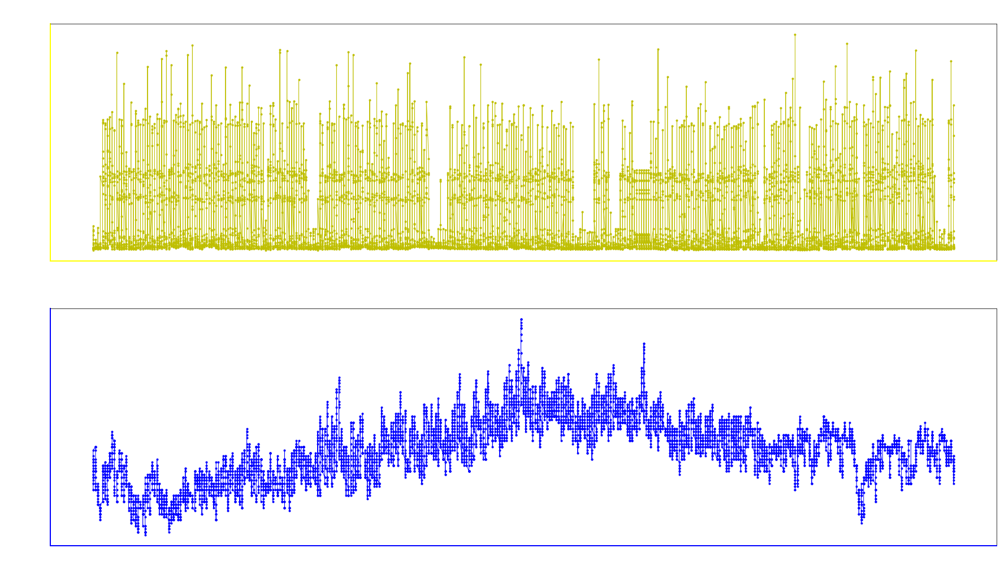

In [12]:
x = Data_2015['Graph_Date']
y1 = Data_2015['Watt']
y2 = Data_2015['Temp']

plt.figure(figsize=(30,17))

Graph("2015's Time-Watt Graph", "2015's Time-Temp Graph", 1)

#### 3년치 데이터 그래프 확인

#### 2013-2015

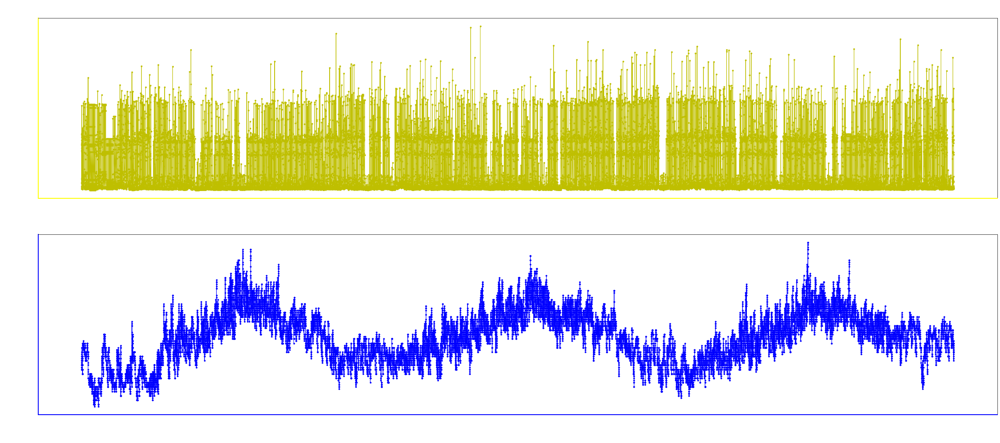

In [13]:
x = Data_3Y['Graph_Date']
y1 = Data_3Y['Watt']
y2 = Data_3Y['Temp']

plt.figure(figsize=(40,17))

Graph("13-15's Time-Watt Graph","13-15's Time-Temp Graph", 3)

### 데이터 정규화

#### Total Data Set 4년치 정규화

#### Min-Max Scaling

In [14]:
from sklearn.preprocessing import MinMaxScaler

# 정규화 과정을 거쳐 데이터 범위를 원하는 범위로 제한. 그래프는 동일하나 손실 정도를 확인하기에 더 좋음.
#배치 정규화는 기울기 소멸 문제를 해결하기는 좋으나, RNN의 경우 계층별로 미니 정규화 적용이 필요해 모델이 복잡해지고 효율이 저하됨.
Data_4Y.sort_index(ascending=False).reset_index(drop=True)

scaler = MinMaxScaler()
scale_cols = ['Holiday', 'Watt', 'Temp']
Data_4Y_scaled = scaler.fit_transform(Data_4Y[scale_cols])
Data_4Y_scaled = pd.DataFrame(Data_4Y_scaled)
Data_4Y_scaled.columns = scale_cols

Data_4Y_scaled.insert(0, 'DateTime', Data_4Y['DateTime'])
Data_4Y_scaled.insert(1, 'Graph_Date', Data_4Y['Graph_Date'])
Data_4Y_scaled

,DateTime,Graph_Date,Holiday,Watt,Temp
0,20130101,2013-01-01,1.0,0.270038,0.360000
1,20130101,2013-01-01,1.0,0.268530,0.333333
2,20130101,2013-01-01,1.0,0.263775,0.320000
3,20130101,2013-01-01,1.0,0.011368,0.306667
4,20130101,2013-01-01,1.0,0.010788,0.306667
...,...,...,...,...,...
35035,20161231,2016-12-31,1.0,0.024707,0.333333
35036,20161231,2016-12-31,1.0,0.182809,0.333333
35037,20161231,2016-12-31,1.0,0.089781,0.306667
35038,20161231,2016-12-31,1.0,0.049878,0.306667


### 데이터셋 편집

In [97]:
TEST_SIZE = 366 # 1년치를 테스트셋으로 사용
WINDOW_SIZE = 1 # 얼마 동안의 과거 기반의 데이터에 기반하여 다음날의 값을 예측할 것인지 설정. 여기서는 일주일 기준. 이 이후로 3개 더 있음.

train = Data_4Y_scaled[:-TEST_SIZE]
test= Data_4Y_scaled[-TEST_SIZE:]

In [98]:
def make_dataset(data, label, window_size=1):
    feature_list = []
    label_list = []
    for i in range(len(data) - window_size):
        feature_list.append(np.array(data.iloc[i:i+window_size]))
        label_list.append(np.array(label.iloc[i+window_size]))
    return np.array(feature_list), np.array(label_list)

In [99]:
from sklearn.model_selection import train_test_split

feature_cols = ['Holiday', 'Watt', 'Temp']
label_cols = ['Watt']

train_feature = train[feature_cols]
train_label = train[label_cols]

train_feature, train_label = make_dataset(train_feature, train_label, 1)# 여기서도 일자 설정

x_train, x_valid, y_train, y_valid = train_test_split(train_feature, train_label, test_size=0.365)

In [100]:
print(' x_train >> {0}\n x_valid >> {1}\n y_train >> {2}\n y_valid >> {3}'.format(x_train.shape, x_valid.shape, y_train.shape, y_valid.shape))

 x_train >> (22017, 1, 3)
 x_valid >> (12656, 1, 3)
 y_train >> (22017, 1)
 y_valid >> (12656, 1)


In [101]:
x_test = test[feature_cols]
y_test = test[label_cols]

In [102]:
x_test, y_test = make_dataset(x_test, y_test, 1)
x_test.shape, y_test.shape

((365, 1, 3), (365, 1))

### 딥러닝 모델

In [103]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Bidirectional

tf.debugging.set_log_device_placement(True)

with tf.device('/GPU:0'):
    model = Sequential()
    model.add(LSTM(512, activation='ReLU', input_shape=(train_feature.shape[1], train_feature.shape[2]), return_sequences=True))
    model.add(Bidirectional(LSTM(256, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(LSTM(256, activation='ReLU', return_sequences = True))
    model.add(Bidirectional(LSTM(128, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(LSTM(128, activation='ReLU', return_sequences = True))
    model.add(Bidirectional(LSTM(64, activation='ReLU', return_sequences=True), merge_mode='concat'))
    model.add(LSTM(64, activation='ReLU', return_sequences = True))
    model.add(Bidirectional(LSTM(32, return_sequences=True), merge_mode='concat'))
    model.add(LSTM(32, activation='ReLU', return_sequences = False))
    model.add(Dense(1))
    model.summary()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/repli

Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Qr in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DiagPart in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sign in device /job:localhost/replica:0/task:0/device:GPU:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Qr in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DiagPart in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sign in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Transpose in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Reshape in device /job:localhost/replica:0/task:0/device

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Reshape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ConcatV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/devi

In [104]:
# 시간 표시, 측정용
now = datetime.datetime.now() # 현재 시각
TimeNow = now.strftime('%Y-%m-%d  %H:%M:%S') # 시작 시각 표시용.

In [105]:
import os

with tf.device('/GPU:0'):
    print('Start Time >>', TimeNow, '\n')
    now = datetime.datetime.now()
    start = now

    model.compile(loss='mean_squared_error', optimizer='Nadam', metrics=['acc'])
    early_stop = EarlyStopping(monitor='val_loss', patience=7)

    model_path = 'model'
    filename = os.path.join(model_path, 'tmp_checkpoint.h5')
    checkpoint = ModelCheckpoint(filename, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
    history = model.fit(x_train, y_train, epochs=25, batch_size=32,validation_data=(x_valid, y_valid), callbacks=[early_stop, checkpoint])

    now = datetime.datetime.now()
    end = now
    elapsed_time = end-start
    elapsed_time = str(elapsed_time).split(".")
    elapsed_time = elapsed_time[0]
    print('소요시간 >> ', elapsed_time)

Start Time >> 2022-02-14  11:47:52 

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhos

Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhos

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/689 [..............................] - ETA: 1:06 - loss: 0.6014 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 21/689 [..............................] - ETA: 1:06 - loss: 0.6010 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/689 [..............................] - ETA: 1:06 - loss: 0.6090 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/689 [>.............................] - ETA: 1:00 - loss: 0.5852 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 45/689 [>.............................] - ETA: 1:00 - loss: 0.5809 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 46/689 [=>............................] - ETA: 1:00 - loss: 0.5785 - acc: 0.0000e+00Executing op ReadVariableOp in device /job

 67/689 [=>............................] - ETA: 57s - loss: 0.5311 - acc: 0.0014Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/689 [=>............................] - ETA: 57s - loss: 0.5320 - acc: 0.0014Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/689 [==>...........................] - ETA: 57s - loss: 0.5368 - acc: 0.0014Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 91/689 [==>...........................] - ETA: 54s - loss: 0.5029 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 92/689 [===>..........................] - ETA: 54s - loss: 0.5013 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/689 [===>..........................] - ETA: 54s - loss: 0.4989 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

115/689 [====>.........................] - ETA: 52s - loss: 0.4706 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
116/689 [====>.........................] - ETA: 52s - loss: 0.4721 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
117/689 [====>.........................] - ETA: 52s - loss: 0.4712 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

139/689 [=====>........................] - ETA: 50s - loss: 0.4573 - acc: 8.9928e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
140/689 [=====>........................] - ETA: 49s - loss: 0.4556 - acc: 8.9286e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
141/689 [=====>........................] - ETA: 49s - loss: 0.4562 - acc: 8.8652e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

163/689 [======>.......................] - ETA: 47s - loss: 0.4523 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
164/689 [======>.......................] - ETA: 47s - loss: 0.4509 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
165/689 [======>.......................] - ETA: 47s - loss: 0.4511 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

187/689 [=======>......................] - ETA: 45s - loss: 0.4447 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
188/689 [=======>......................] - ETA: 45s - loss: 0.4455 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
189/689 [=======>......................] - ETA: 45s - loss: 0.4456 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

211/689 [========>.....................] - ETA: 43s - loss: 0.4398 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
212/689 [========>.....................] - ETA: 43s - loss: 0.4393 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
213/689 [========>.....................] - ETA: 43s - loss: 0.4385 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

235/689 [=========>....................] - ETA: 41s - loss: 0.4321 - acc: 9.3085e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
236/689 [=========>....................] - ETA: 40s - loss: 0.4325 - acc: 9.2691e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
237/689 [=========>....................] - ETA: 40s - loss: 0.4337 - acc: 9.2300e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
259/689 [==========>...................] - ETA: 38s - loss: 0.4262 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
260/689 [==========>...................] - ETA: 38s - loss: 0.4263 - acc: 8.4135e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
261/689 [==========>...................] - ETA: 38s - loss: 0.4256 - acc: 8.3812e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
283/689 [===========>..................] - ETA: 36s - loss: 0.4236 - acc: 7.7297e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
284/689 [===========>..................] - ETA: 36s - loss: 0.4234 - acc: 7.7025e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
285/689 [===========>..................] - ETA: 36s - loss: 0.4228 - acc: 7.6754e-04Executing op ReadVariableOp in device /job:lo

306/689 [============>.................] - ETA: 34s - loss: 0.4226 - acc: 7.1487e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
307/689 [============>.................] - ETA: 34s - loss: 0.4226 - acc: 7.1254e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
308/689 [============>.................] - ETA: 34s - loss: 0.4227 - acc: 7.1023e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
330/689 [=============>................] - ETA: 32s - loss: 0.4178 - acc: 7.5758e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
331/689 [=============>................] - ETA: 32s - loss: 0.4179 - acc: 7.5529e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
332/689 [=============>................] - ETA: 32s - loss: 0.4175 - acc: 7.5301e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
354/689 [==============>...............] - ETA: 30s - loss: 0.4124 - acc: 7.0621e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
355/689 [==============>...............] - ETA: 30s - loss: 0.4136 - acc: 7.0423e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
356/689 [==============>...............] - ETA: 29s - loss: 0.4133 - acc: 7.0225e-04Executing op ReadVariableOp in device /job:lo

377/689 [===============>..............] - ETA: 28s - loss: 0.4113 - acc: 6.6313e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
378/689 [===============>..............] - ETA: 27s - loss: 0.4108 - acc: 6.6138e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
379/689 [===============>..............] - ETA: 27s - loss: 0.4103 - acc: 6.5963e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
401/689 [================>.............] - ETA: 25s - loss: 0.4077 - acc: 6.2344e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
402/689 [================>.............] - ETA: 25s - loss: 0.4075 - acc: 6.2189e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
403/689 [================>.............] - ETA: 25s - loss: 0.4081 - acc: 6.2035e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
425/689 [=================>............] - ETA: 23s - loss: 0.4063 - acc: 5.8824e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
426/689 [=================>............] - ETA: 23s - loss: 0.4061 - acc: 5.8685e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
427/689 [=================>............] - ETA: 23s - loss: 0.4064 - acc: 5.8548e-04Executing op ReadVariableOp in device /job:lo

448/689 [==================>...........] - ETA: 21s - loss: 0.4065 - acc: 6.2779e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
449/689 [==================>...........] - ETA: 21s - loss: 0.4067 - acc: 6.2639e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
450/689 [==================>...........] - ETA: 21s - loss: 0.4067 - acc: 6.2500e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
472/689 [===================>..........] - ETA: 19s - loss: 0.4065 - acc: 5.9587e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
473/689 [===================>..........] - ETA: 19s - loss: 0.4072 - acc: 5.9461e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
474/689 [===================>..........] - ETA: 19s - loss: 0.4072 - acc: 5.9335e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
496/689 [====================>.........] - ETA: 17s - loss: 0.4048 - acc: 5.6704e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
497/689 [====================>.........] - ETA: 17s - loss: 0.4047 - acc: 5.6590e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
498/689 [====================>.........] - ETA: 17s - loss: 0.4048 - acc: 5.6476e-04Executing op ReadVariableOp in device /job:lo

519/689 [=====================>........] - ETA: 15s - loss: 0.4020 - acc: 6.0212e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
520/689 [=====================>........] - ETA: 15s - loss: 0.4018 - acc: 6.0096e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
521/689 [=====================>........] - ETA: 15s - loss: 0.4015 - acc: 5.9981e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
543/689 [======================>.......] - ETA: 13s - loss: 0.3995 - acc: 6.3306e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
544/689 [======================>.......] - ETA: 13s - loss: 0.3995 - acc: 6.3189e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
545/689 [======================>.......] - ETA: 12s - loss: 0.3995 - acc: 6.3073e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
567/689 [=======================>......] - ETA: 10s - loss: 0.3980 - acc: 6.0626e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
568/689 [=======================>......] - ETA: 10s - loss: 0.3977 - acc: 6.0519e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
569/689 [=======================>......] - ETA: 10s - loss: 0.3977 - acc: 6.0413e-04Executing op ReadVariableOp in device /job:lo

590/689 [========================>.....] - ETA: 8s - loss: 0.3976 - acc: 5.8263e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
591/689 [========================>.....] - ETA: 8s - loss: 0.3974 - acc: 5.8164e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
592/689 [========================>.....] - ETA: 8s - loss: 0.3973 - acc: 5.8066e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

614/689 [=========================>....] - ETA: 6s - loss: 0.3980 - acc: 5.5985e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
615/689 [=========================>....] - ETA: 6s - loss: 0.3983 - acc: 5.5894e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
616/689 [=========================>....] - ETA: 6s - loss: 0.3982 - acc: 5.5804e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

638/689 [==========================>...] - ETA: 4s - loss: 0.3978 - acc: 5.8777e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
639/689 [==========================>...] - ETA: 4s - loss: 0.3976 - acc: 5.8685e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
640/689 [==========================>...] - ETA: 4s - loss: 0.3975 - acc: 5.8594e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

662/689 [===========================>..] - ETA: 2s - loss: 0.3958 - acc: 5.6647e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
663/689 [===========================>..] - ETA: 2s - loss: 0.3956 - acc: 6.1275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
664/689 [===========================>..] - ETA: 2s - loss: 0.3958 - acc: 6.1182e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

686/689 [============================>.] - ETA: 0s - loss: 0.3930 - acc: 6.3776e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
687/689 [============================>.] - ETA: 0s - loss: 0.3927 - acc: 6.3683e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
688/689 [============================>.] - ETA: 0s - loss: 0.3925 - acc: 6.3590e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/689 [..............................] - ETA: 1:05 - loss: 0.3758 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/689 [..............................] - ETA: 1:05 - loss: 0.4015 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 13/689 [..............................] - ETA: 1:05 - loss: 0.3896 - acc: 0.0000e+00Executing op ReadVariableOp in device /job

 34/689 [>.............................] - ETA: 1:00 - loss: 0.3768 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/689 [>.............................] - ETA: 1:00 - loss: 0.3736 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/689 [>.............................] - ETA: 1:00 - loss: 0.3715 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 58/689 [=>............................] - ETA: 58s - loss: 0.3914 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 59/689 [=>............................] - ETA: 58s - loss: 0.3890 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 60/689 [=>............................] - ETA: 58s - loss: 0.3893 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/689 [==>...........................] - ETA: 56s - loss: 0.3935 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/689 [==>...........................] - ETA: 56s - loss: 0.3955 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 84/689 [==>...........................] - ETA: 55s - loss: 0.3948 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:lo

105/689 [===>..........................] - ETA: 54s - loss: 0.3945 - acc: 2.9762e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
106/689 [===>..........................] - ETA: 54s - loss: 0.3942 - acc: 2.9481e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
107/689 [===>..........................] - ETA: 54s - loss: 0.3938 - acc: 2.9206e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
129/689 [====>.........................] - ETA: 51s - loss: 0.3835 - acc: 4.8450e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
130/689 [====>.........................] - ETA: 51s - loss: 0.3825 - acc: 4.8077e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
131/689 [====>.........................] - ETA: 51s - loss: 0.3809 - acc: 4.7710e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
153/689 [=====>........................] - ETA: 49s - loss: 0.3779 - acc: 4.0850e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
154/689 [=====>........................] - ETA: 49s - loss: 0.3785 - acc: 4.0584e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
155/689 [=====>........................] - ETA: 49s - loss: 0.3796 - acc: 4.0323e-04Executing op ReadVariableOp in device /job:lo

176/689 [======>.......................] - ETA: 47s - loss: 0.3816 - acc: 3.5511e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
177/689 [======>.......................] - ETA: 47s - loss: 0.3805 - acc: 3.5311e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
178/689 [======>.......................] - ETA: 47s - loss: 0.3817 - acc: 3.5112e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
200/689 [=======>......................] - ETA: 45s - loss: 0.3828 - acc: 6.2500e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
201/689 [=======>......................] - ETA: 45s - loss: 0.3825 - acc: 6.2189e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
202/689 [=======>......................] - ETA: 45s - loss: 0.3822 - acc: 6.1881e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
224/689 [========>.....................] - ETA: 43s - loss: 0.3869 - acc: 5.5804e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
225/689 [========>.....................] - ETA: 42s - loss: 0.3870 - acc: 5.5556e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
226/689 [========>.....................] - ETA: 42s - loss: 0.3868 - acc: 5.5310e-04Executing op ReadVariableOp in device /job:lo

247/689 [=========>....................] - ETA: 40s - loss: 0.3836 - acc: 5.0607e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
248/689 [=========>....................] - ETA: 40s - loss: 0.3828 - acc: 5.0403e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
249/689 [=========>....................] - ETA: 40s - loss: 0.3829 - acc: 5.0201e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
271/689 [==========>...................] - ETA: 38s - loss: 0.3822 - acc: 5.7657e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
272/689 [==========>...................] - ETA: 38s - loss: 0.3823 - acc: 5.7445e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
273/689 [==========>...................] - ETA: 38s - loss: 0.3819 - acc: 5.7234e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
295/689 [===========>..................] - ETA: 36s - loss: 0.3811 - acc: 5.2966e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
296/689 [===========>..................] - ETA: 36s - loss: 0.3810 - acc: 5.2787e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
297/689 [===========>..................] - ETA: 36s - loss: 0.3811 - acc: 5.2609e-04Executing op ReadVariableOp in device /job:lo

318/689 [============>.................] - ETA: 34s - loss: 0.3844 - acc: 4.9135e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
319/689 [============>.................] - ETA: 34s - loss: 0.3838 - acc: 4.8981e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
320/689 [============>.................] - ETA: 34s - loss: 0.3843 - acc: 4.8828e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
342/689 [=============>................] - ETA: 32s - loss: 0.3839 - acc: 4.5687e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
343/689 [=============>................] - ETA: 31s - loss: 0.3835 - acc: 4.5554e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
344/689 [=============>................] - ETA: 31s - loss: 0.3833 - acc: 4.5422e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
366/689 [==============>...............] - ETA: 29s - loss: 0.3839 - acc: 4.2691e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
367/689 [==============>...............] - ETA: 29s - loss: 0.3842 - acc: 4.2575e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
368/689 [===============>..............] - ETA: 29s - loss: 0.3841 - acc: 4.2459e-04Executing op ReadVariableOp in device /job:lo

389/689 [===============>..............] - ETA: 27s - loss: 0.3852 - acc: 4.0167e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
390/689 [===============>..............] - ETA: 27s - loss: 0.3855 - acc: 4.0064e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
391/689 [================>.............] - ETA: 27s - loss: 0.3855 - acc: 3.9962e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
413/689 [================>.............] - ETA: 25s - loss: 0.3835 - acc: 4.5400e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
414/689 [=================>............] - ETA: 25s - loss: 0.3832 - acc: 4.5290e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
415/689 [=================>............] - ETA: 25s - loss: 0.3831 - acc: 4.5181e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
437/689 [==================>...........] - ETA: 23s - loss: 0.3820 - acc: 5.7208e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
438/689 [==================>...........] - ETA: 23s - loss: 0.3820 - acc: 5.7078e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
439/689 [==================>...........] - ETA: 22s - loss: 0.3828 - acc: 5.6948e-04Executing op ReadVariableOp in device /job:lo

460/689 [===================>..........] - ETA: 21s - loss: 0.3823 - acc: 5.4348e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
461/689 [===================>..........] - ETA: 20s - loss: 0.3825 - acc: 5.4230e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
462/689 [===================>..........] - ETA: 20s - loss: 0.3823 - acc: 6.0877e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
484/689 [====================>.........] - ETA: 18s - loss: 0.3815 - acc: 5.8110e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
485/689 [====================>.........] - ETA: 18s - loss: 0.3815 - acc: 5.7990e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
486/689 [====================>.........] - ETA: 18s - loss: 0.3816 - acc: 5.7870e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
508/689 [=====================>........] - ETA: 16s - loss: 0.3808 - acc: 5.5364e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
509/689 [=====================>........] - ETA: 16s - loss: 0.3807 - acc: 5.5255e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
510/689 [=====================>........] - ETA: 16s - loss: 0.3807 - acc: 5.5147e-04Executing op ReadVariableOp in device /job:lo

531/689 [======================>.......] - ETA: 14s - loss: 0.3814 - acc: 5.2966e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
532/689 [======================>.......] - ETA: 14s - loss: 0.3813 - acc: 5.2867e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
533/689 [======================>.......] - ETA: 14s - loss: 0.3810 - acc: 5.2767e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
555/689 [=======================>......] - ETA: 12s - loss: 0.3796 - acc: 5.0676e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
556/689 [=======================>......] - ETA: 12s - loss: 0.3796 - acc: 5.0585e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
557/689 [=======================>......] - ETA: 12s - loss: 0.3799 - acc: 5.0494e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
579/689 [========================>.....] - ETA: 10s - loss: 0.3795 - acc: 5.3972e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
580/689 [========================>.....] - ETA: 9s - loss: 0.3794 - acc: 5.3879e-04 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
581/689 [========================>.....] - ETA: 9s - loss: 0.3792 - acc: 5.3787e-04Executing op ReadVariableOp in device /job:loc

602/689 [=========================>....] - ETA: 7s - loss: 0.3785 - acc: 6.7483e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
603/689 [=========================>....] - ETA: 7s - loss: 0.3786 - acc: 6.7371e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
604/689 [=========================>....] - ETA: 7s - loss: 0.3785 - acc: 7.2434e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

626/689 [==========================>...] - ETA: 5s - loss: 0.3771 - acc: 6.9888e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
627/689 [==========================>...] - ETA: 5s - loss: 0.3773 - acc: 6.9777e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
628/689 [==========================>...] - ETA: 5s - loss: 0.3772 - acc: 6.9666e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

650/689 [===========================>..] - ETA: 3s - loss: 0.3758 - acc: 6.7308e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
651/689 [===========================>..] - ETA: 3s - loss: 0.3754 - acc: 6.7204e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
652/689 [===========================>..] - ETA: 3s - loss: 0.3758 - acc: 6.7101e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

674/689 [============================>.] - ETA: 1s - loss: 0.3749 - acc: 6.9547e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
675/689 [============================>.] - ETA: 1s - loss: 0.3747 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
676/689 [============================>.] - ETA: 1s - loss: 0.3744 - acc: 6.9342e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/689 [..............................] - ETA: 1:03 - loss: 0.3297 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/689 [..............................] - ETA: 1:01 - loss: 0.4049 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  5/689 [..............................] - ETA: 1:01 - loss: 0.3806 - acc: 0.0000e+00Executing op ReadVariableOp in device /job

 26/689 [>.............................] - ETA: 1:00 - loss: 0.3493 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/689 [>.............................] - ETA: 1:00 - loss: 0.3499 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 28/689 [>.............................] - ETA: 1:00 - loss: 0.3489 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/689 [=>............................] - ETA: 57s - loss: 0.3560 - acc: 6.2500e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/689 [=>............................] - ETA: 57s - loss: 0.3583 - acc: 6.1275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 52/689 [=>............................] - ETA: 57s - loss: 0.3621 - acc: 6.0096e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/689 [==>...........................] - ETA: 55s - loss: 0.3643 - acc: 4.2230e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/689 [==>...........................] - ETA: 55s - loss: 0.3637 - acc: 4.1667e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 76/689 [==>...........................] - ETA: 55s - loss: 0.3644 - acc: 4.1118e-04Executing op ReadVariableOp in device /job:lo

 97/689 [===>..........................] - ETA: 53s - loss: 0.3721 - acc: 3.2216e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/689 [===>..........................] - ETA: 53s - loss: 0.3713 - acc: 3.1888e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 99/689 [===>..........................] - ETA: 53s - loss: 0.3707 - acc: 3.1566e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
121/689 [====>.........................] - ETA: 51s - loss: 0.3726 - acc: 5.1653e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
122/689 [====>.........................] - ETA: 51s - loss: 0.3721 - acc: 5.1230e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
123/689 [====>.........................] - ETA: 51s - loss: 0.3711 - acc: 5.0813e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
145/689 [=====>........................] - ETA: 49s - loss: 0.3652 - acc: 6.4655e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
146/689 [=====>........................] - ETA: 49s - loss: 0.3641 - acc: 6.4212e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
147/689 [=====>........................] - ETA: 48s - loss: 0.3642 - acc: 6.3776e-04Executing op ReadVariableOp in device /job:lo

168/689 [======>.......................] - ETA: 47s - loss: 0.3664 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
169/689 [======>.......................] - ETA: 47s - loss: 0.3664 - acc: 7.3964e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
170/689 [======>.......................] - ETA: 46s - loss: 0.3662 - acc: 7.3529e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
192/689 [=======>......................] - ETA: 44s - loss: 0.3640 - acc: 8.1380e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
193/689 [=======>......................] - ETA: 44s - loss: 0.3641 - acc: 8.0959e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
194/689 [=======>......................] - ETA: 44s - loss: 0.3644 - acc: 8.0541e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
216/689 [========>.....................] - ETA: 42s - loss: 0.3707 - acc: 7.2338e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
217/689 [========>.....................] - ETA: 42s - loss: 0.3705 - acc: 7.2005e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
218/689 [========>.....................] - ETA: 42s - loss: 0.3701 - acc: 7.1674e-04Executing op ReadVariableOp in device /job:lo

239/689 [=========>....................] - ETA: 40s - loss: 0.3655 - acc: 6.5377e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
240/689 [=========>....................] - ETA: 40s - loss: 0.3658 - acc: 6.5104e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
241/689 [=========>....................] - ETA: 40s - loss: 0.3662 - acc: 6.4834e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
263/689 [==========>...................] - ETA: 38s - loss: 0.3647 - acc: 7.1293e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
264/689 [==========>...................] - ETA: 38s - loss: 0.3643 - acc: 7.1023e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
265/689 [==========>...................] - ETA: 38s - loss: 0.3644 - acc: 7.0755e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
287/689 [===========>..................] - ETA: 36s - loss: 0.3627 - acc: 6.5331e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
288/689 [===========>..................] - ETA: 36s - loss: 0.3624 - acc: 6.5104e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
289/689 [===========>..................] - ETA: 36s - loss: 0.3627 - acc: 6.4879e-04Executing op ReadVariableOp in device /job:lo

310/689 [============>.................] - ETA: 34s - loss: 0.3625 - acc: 7.0565e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
311/689 [============>.................] - ETA: 34s - loss: 0.3620 - acc: 7.0338e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
312/689 [============>.................] - ETA: 34s - loss: 0.3618 - acc: 7.0112e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
334/689 [=============>................] - ETA: 32s - loss: 0.3651 - acc: 7.4850e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
335/689 [=============>................] - ETA: 32s - loss: 0.3657 - acc: 7.4627e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
336/689 [=============>................] - ETA: 31s - loss: 0.3658 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
358/689 [==============>...............] - ETA: 29s - loss: 0.3666 - acc: 6.9832e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
359/689 [==============>...............] - ETA: 29s - loss: 0.3671 - acc: 6.9638e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
360/689 [==============>...............] - ETA: 29s - loss: 0.3667 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:lo

381/689 [===============>..............] - ETA: 27s - loss: 0.3696 - acc: 6.5617e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
382/689 [===============>..............] - ETA: 27s - loss: 0.3696 - acc: 6.5445e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
383/689 [===============>..............] - ETA: 27s - loss: 0.3693 - acc: 6.5274e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
405/689 [================>.............] - ETA: 25s - loss: 0.3691 - acc: 6.1728e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
406/689 [================>.............] - ETA: 25s - loss: 0.3690 - acc: 6.1576e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
407/689 [================>.............] - ETA: 25s - loss: 0.3690 - acc: 6.1425e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
429/689 [=================>............] - ETA: 23s - loss: 0.3695 - acc: 6.5559e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
430/689 [=================>............] - ETA: 23s - loss: 0.3693 - acc: 6.5407e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
431/689 [=================>............] - ETA: 23s - loss: 0.3694 - acc: 6.5255e-04Executing op ReadVariableOp in device /job:lo

452/689 [==================>...........] - ETA: 21s - loss: 0.3688 - acc: 6.9137e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
453/689 [==================>...........] - ETA: 21s - loss: 0.3693 - acc: 6.8985e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
454/689 [==================>...........] - ETA: 21s - loss: 0.3696 - acc: 6.8833e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
476/689 [===================>..........] - ETA: 19s - loss: 0.3698 - acc: 6.5651e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
477/689 [===================>..........] - ETA: 19s - loss: 0.3697 - acc: 6.5514e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
478/689 [===================>..........] - ETA: 19s - loss: 0.3700 - acc: 7.1914e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
500/689 [====================>.........] - ETA: 17s - loss: 0.3706 - acc: 6.8750e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
501/689 [====================>.........] - ETA: 17s - loss: 0.3706 - acc: 6.8613e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
502/689 [====================>.........] - ETA: 16s - loss: 0.3705 - acc: 6.8476e-04Executing op ReadVariableOp in device /job:lo

523/689 [=====================>........] - ETA: 15s - loss: 0.3719 - acc: 6.5727e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
524/689 [=====================>........] - ETA: 14s - loss: 0.3720 - acc: 6.5601e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
525/689 [=====================>........] - ETA: 14s - loss: 0.3722 - acc: 6.5476e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
547/689 [======================>.......] - ETA: 12s - loss: 0.3713 - acc: 7.4269e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
548/689 [======================>.......] - ETA: 12s - loss: 0.3714 - acc: 7.4133e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
549/689 [======================>.......] - ETA: 12s - loss: 0.3715 - acc: 7.3998e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
571/689 [=======================>......] - ETA: 10s - loss: 0.3712 - acc: 7.1147e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
572/689 [=======================>......] - ETA: 10s - loss: 0.3711 - acc: 7.1023e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
573/689 [=======================>......] - ETA: 10s - loss: 0.3710 - acc: 7.0899e-04Executing op ReadVariableOp in device /job:lo

594/689 [========================>.....] - ETA: 8s - loss: 0.3720 - acc: 6.8392e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
595/689 [========================>.....] - ETA: 8s - loss: 0.3719 - acc: 6.8277e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
596/689 [========================>.....] - ETA: 8s - loss: 0.3717 - acc: 6.8163e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

618/689 [=========================>....] - ETA: 6s - loss: 0.3722 - acc: 6.5736e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
619/689 [=========================>....] - ETA: 6s - loss: 0.3722 - acc: 6.5630e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
620/689 [=========================>....] - ETA: 6s - loss: 0.3724 - acc: 6.5524e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

642/689 [==========================>...] - ETA: 4s - loss: 0.3741 - acc: 6.3279e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
643/689 [==========================>...] - ETA: 4s - loss: 0.3742 - acc: 6.3180e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
644/689 [===========================>..] - ETA: 4s - loss: 0.3742 - acc: 6.7935e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

666/689 [===========================>..] - ETA: 2s - loss: 0.3731 - acc: 7.0383e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
667/689 [============================>.] - ETA: 2s - loss: 0.3732 - acc: 7.0277e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
668/689 [============================>.] - ETA: 1s - loss: 0.3732 - acc: 7.0172e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing o

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

  6/689 [..............................] - ETA: 1:04 - loss: 0.3639 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/689 [..............................] - ETA: 1:03 - loss: 0.3516 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/689 [..............................] - ETA: 1:03 - loss: 0.3613 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 30/689 [>.............................] - ETA: 1:00 - loss: 0.3452 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 31/689 [>.............................] - ETA: 1:00 - loss: 0.3417 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 32/689 [>.............................] - ETA: 59s - loss: 0.3427 - acc: 0.0000e+00 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 54/689 [=>............................] - ETA: 58s - loss: 0.3624 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/689 [=>............................] - ETA: 58s - loss: 0.3667 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 56/689 [=>............................] - ETA: 58s - loss: 0.3686 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:lo

 77/689 [==>...........................] - ETA: 56s - loss: 0.3753 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/689 [==>...........................] - ETA: 56s - loss: 0.3758 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/689 [==>...........................] - ETA: 56s - loss: 0.3741 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
101/689 [===>..........................] - ETA: 54s - loss: 0.3813 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
102/689 [===>..........................] - ETA: 54s - loss: 0.3800 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
103/689 [===>..........................] - ETA: 54s - loss: 0.3794 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
125/689 [====>.........................] - ETA: 52s - loss: 0.3777 - acc: 2.5000e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
126/689 [====>.........................] - ETA: 52s - loss: 0.3777 - acc: 2.4802e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
127/689 [====>.........................] - ETA: 51s - loss: 0.3763 - acc: 2.4606e-04Executing op ReadVariableOp in device /job:lo

148/689 [=====>........................] - ETA: 50s - loss: 0.3833 - acc: 6.3345e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
149/689 [=====>........................] - ETA: 50s - loss: 0.3832 - acc: 8.3893e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
150/689 [=====>........................] - ETA: 50s - loss: 0.3826 - acc: 8.3333e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
172/689 [======>.......................] - ETA: 47s - loss: 0.3777 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
173/689 [======>.......................] - ETA: 47s - loss: 0.3777 - acc: 7.2254e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
174/689 [======>.......................] - ETA: 47s - loss: 0.3771 - acc: 7.1839e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
196/689 [=======>......................] - ETA: 45s - loss: 0.3730 - acc: 6.3776e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
197/689 [=======>......................] - ETA: 45s - loss: 0.3738 - acc: 6.3452e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
198/689 [=======>......................] - ETA: 45s - loss: 0.3735 - acc: 7.8914e-04Executing op ReadVariableOp in device /job:lo

219/689 [========>.....................] - ETA: 43s - loss: 0.3668 - acc: 8.5616e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
220/689 [========>.....................] - ETA: 43s - loss: 0.3675 - acc: 8.5227e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
221/689 [========>.....................] - ETA: 43s - loss: 0.3673 - acc: 8.4842e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
243/689 [=========>....................] - ETA: 41s - loss: 0.3684 - acc: 7.7160e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
244/689 [=========>....................] - ETA: 41s - loss: 0.3708 - acc: 7.6844e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
245/689 [=========>....................] - ETA: 41s - loss: 0.3707 - acc: 7.6531e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
267/689 [==========>...................] - ETA: 39s - loss: 0.3687 - acc: 8.1929e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
268/689 [==========>...................] - ETA: 39s - loss: 0.3686 - acc: 8.1623e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
269/689 [==========>...................] - ETA: 39s - loss: 0.3688 - acc: 8.1320e-04Executing op ReadVariableOp in device /job:lo

290/689 [===========>..................] - ETA: 37s - loss: 0.3661 - acc: 7.5431e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
291/689 [===========>..................] - ETA: 37s - loss: 0.3669 - acc: 7.5172e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
292/689 [===========>..................] - ETA: 37s - loss: 0.3671 - acc: 7.4914e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
314/689 [============>.................] - ETA: 34s - loss: 0.3661 - acc: 6.9666e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
315/689 [============>.................] - ETA: 34s - loss: 0.3659 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
316/689 [============>.................] - ETA: 34s - loss: 0.3659 - acc: 6.9225e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
338/689 [=============>................] - ETA: 32s - loss: 0.3630 - acc: 6.4719e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
339/689 [=============>................] - ETA: 32s - loss: 0.3628 - acc: 6.4528e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
340/689 [=============>................] - ETA: 32s - loss: 0.3637 - acc: 6.4338e-04Executing op ReadVariableOp in device /job:lo

361/689 [==============>...............] - ETA: 30s - loss: 0.3637 - acc: 6.0596e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
362/689 [==============>...............] - ETA: 30s - loss: 0.3635 - acc: 6.0428e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
363/689 [==============>...............] - ETA: 30s - loss: 0.3631 - acc: 6.0262e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
385/689 [===============>..............] - ETA: 28s - loss: 0.3662 - acc: 5.6818e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
386/689 [===============>..............] - ETA: 28s - loss: 0.3666 - acc: 5.6671e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
387/689 [===============>..............] - ETA: 28s - loss: 0.3666 - acc: 5.6525e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
409/689 [================>.............] - ETA: 26s - loss: 0.3697 - acc: 5.3484e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
410/689 [================>.............] - ETA: 26s - loss: 0.3696 - acc: 5.3354e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
411/689 [================>.............] - ETA: 25s - loss: 0.3693 - acc: 5.3224e-04Executing op ReadVariableOp in device /job:lo

432/689 [=================>............] - ETA: 23s - loss: 0.3705 - acc: 5.0637e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
433/689 [=================>............] - ETA: 23s - loss: 0.3708 - acc: 5.0520e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
434/689 [=================>............] - ETA: 23s - loss: 0.3705 - acc: 5.0403e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
456/689 [==================>...........] - ETA: 21s - loss: 0.3709 - acc: 4.7971e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
457/689 [==================>...........] - ETA: 21s - loss: 0.3709 - acc: 4.7867e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
458/689 [==================>...........] - ETA: 21s - loss: 0.3708 - acc: 4.7762e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
480/689 [===================>..........] - ETA: 19s - loss: 0.3737 - acc: 4.5573e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
481/689 [===================>..........] - ETA: 19s - loss: 0.3739 - acc: 4.5478e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
482/689 [===================>..........] - ETA: 19s - loss: 0.3736 - acc: 4.5384e-04Executing op ReadVariableOp in device /job:lo

503/689 [====================>.........] - ETA: 17s - loss: 0.3763 - acc: 4.3489e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
504/689 [====================>.........] - ETA: 17s - loss: 0.3763 - acc: 4.3403e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
505/689 [====================>.........] - ETA: 17s - loss: 0.3764 - acc: 4.3317e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
527/689 [=====================>........] - ETA: 15s - loss: 0.3769 - acc: 5.3368e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
528/689 [=====================>........] - ETA: 14s - loss: 0.3764 - acc: 5.3267e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
529/689 [======================>.......] - ETA: 14s - loss: 0.3766 - acc: 5.3166e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
551/689 [======================>.......] - ETA: 12s - loss: 0.3760 - acc: 5.6715e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
552/689 [=======================>......] - ETA: 12s - loss: 0.3757 - acc: 5.6612e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
553/689 [=======================>......] - ETA: 12s - loss: 0.3755 - acc: 5.6510e-04Executing op ReadVariableOp in device /job:lo

574/689 [=======================>......] - ETA: 10s - loss: 0.3750 - acc: 5.9887e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
575/689 [========================>.....] - ETA: 10s - loss: 0.3748 - acc: 5.9783e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
576/689 [========================>.....] - ETA: 10s - loss: 0.3745 - acc: 5.9679e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

598/689 [=========================>....] - ETA: 8s - loss: 0.3746 - acc: 6.2709e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
599/689 [=========================>....] - ETA: 8s - loss: 0.3747 - acc: 6.2604e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
600/689 [=========================>....] - ETA: 8s - loss: 0.3747 - acc: 6.2500e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

622/689 [==========================>...] - ETA: 6s - loss: 0.3752 - acc: 6.5314e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
623/689 [==========================>...] - ETA: 6s - loss: 0.3752 - acc: 6.5209e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
624/689 [==========================>...] - ETA: 6s - loss: 0.3749 - acc: 6.5104e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

646/689 [===========================>..] - ETA: 3s - loss: 0.3744 - acc: 6.7724e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
647/689 [===========================>..] - ETA: 3s - loss: 0.3744 - acc: 6.7620e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
648/689 [===========================>..] - ETA: 3s - loss: 0.3741 - acc: 6.7515e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

670/689 [============================>.] - ETA: 1s - loss: 0.3727 - acc: 6.9963e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
671/689 [============================>.] - ETA: 1s - loss: 0.3727 - acc: 6.9858e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
672/689 [============================>.] - ETA: 1s - loss: 0.3724 - acc: 6.9754e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 5/25
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/689 [..............................] - ETA: 1:10 - loss: 0.2952 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0

 22/689 [..............................] - ETA: 1:00 - loss: 0.3567 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/689 [>.............................] - ETA: 1:00 - loss: 0.3596 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/689 [>.............................] - ETA: 1:00 - loss: 0.3607 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 46/689 [=>............................] - ETA: 57s - loss: 0.3805 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 47/689 [=>............................] - ETA: 57s - loss: 0.3809 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/689 [=>............................] - ETA: 57s - loss: 0.3920 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/689 [==>...........................] - ETA: 55s - loss: 0.3894 - acc: 8.9286e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/689 [==>...........................] - ETA: 55s - loss: 0.3918 - acc: 8.8028e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/689 [==>...........................] - ETA: 55s - loss: 0.3907 - acc: 8.6806e-04Executing op ReadVariableOp in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/689 [===>..........................] - ETA: 53s - loss: 0.3886 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/689 [===>..........................] - ETA: 53s - loss: 0.3871 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/689 [===>..........................] - ETA: 53s - loss: 0.3857 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
118/689 [====>.........................] - ETA: 51s - loss: 0.3824 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
119/689 [====>.........................] - ETA: 51s - loss: 0.3811 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
120/689 [====>.........................] - ETA: 50s - loss: 0.3812 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
142/689 [=====>........................] - ETA: 49s - loss: 0.3859 - acc: 0.0011    Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
143/689 [=====>........................] - ETA: 48s - loss: 0.3855 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
144/689 [=====>........................] - ETA: 48s - loss: 0.3846 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
166/689 [======>.......................] - ETA: 46s - loss: 0.3856 - acc: 9.4127e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
167/689 [======>.......................] - ETA: 46s - loss: 0.3848 - acc: 9.3563e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
168/689 [======>.......................] - ETA: 46s - loss: 0.3846 - acc: 9.3006e-04Executing op ReadVariableOp in device /job:lo

189/689 [=======>......................] - ETA: 44s - loss: 0.3802 - acc: 8.2672e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
190/689 [=======>......................] - ETA: 44s - loss: 0.3801 - acc: 8.2237e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
191/689 [=======>......................] - ETA: 44s - loss: 0.3790 - acc: 8.1806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
213/689 [========>.....................] - ETA: 42s - loss: 0.3805 - acc: 7.3357e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
214/689 [========>.....................] - ETA: 42s - loss: 0.3807 - acc: 7.3014e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
215/689 [========>.....................] - ETA: 42s - loss: 0.3803 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
237/689 [=========>....................] - ETA: 40s - loss: 0.3764 - acc: 7.9114e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
238/689 [=========>....................] - ETA: 40s - loss: 0.3764 - acc: 7.8782e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
239/689 [=========>....................] - ETA: 40s - loss: 0.3761 - acc: 7.8452e-04Executing op ReadVariableOp in device /job:lo

260/689 [==========>...................] - ETA: 38s - loss: 0.3715 - acc: 9.6154e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
261/689 [==========>...................] - ETA: 38s - loss: 0.3725 - acc: 9.5785e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
262/689 [==========>...................] - ETA: 38s - loss: 0.3721 - acc: 9.5420e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

284/689 [===========>..................] - ETA: 36s - loss: 0.3751 - acc: 9.9032e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
285/689 [===========>..................] - ETA: 36s - loss: 0.3750 - acc: 9.8684e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
286/689 [===========>..................] - ETA: 36s - loss: 0.3748 - acc: 9.8339e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
308/689 [============>.................] - ETA: 33s - loss: 0.3787 - acc: 9.1315e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
309/689 [============>.................] - ETA: 33s - loss: 0.3783 - acc: 9.1019e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
310/689 [============>.................] - ETA: 33s - loss: 0.3779 - acc: 9.0726e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
332/689 [=============>................] - ETA: 31s - loss: 0.3744 - acc: 8.4714e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
333/689 [=============>................] - ETA: 31s - loss: 0.3747 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
334/689 [=============>................] - ETA: 31s - loss: 0.3745 - acc: 8.4207e-04Executing op ReadVariableOp in device /job:lo

355/689 [==============>...............] - ETA: 29s - loss: 0.3736 - acc: 7.9225e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
356/689 [==============>...............] - ETA: 29s - loss: 0.3739 - acc: 7.9003e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
357/689 [==============>...............] - ETA: 29s - loss: 0.3740 - acc: 7.8782e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
379/689 [===============>..............] - ETA: 27s - loss: 0.3721 - acc: 7.4208e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
380/689 [===============>..............] - ETA: 27s - loss: 0.3727 - acc: 7.4013e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
381/689 [===============>..............] - ETA: 27s - loss: 0.3730 - acc: 7.3819e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
403/689 [================>.............] - ETA: 25s - loss: 0.3734 - acc: 6.9789e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
404/689 [================>.............] - ETA: 25s - loss: 0.3737 - acc: 6.9616e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
405/689 [================>.............] - ETA: 25s - loss: 0.3736 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:lo

426/689 [=================>............] - ETA: 23s - loss: 0.3741 - acc: 7.3357e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
427/689 [=================>............] - ETA: 23s - loss: 0.3738 - acc: 7.3185e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
428/689 [=================>............] - ETA: 23s - loss: 0.3735 - acc: 7.3014e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
450/689 [==================>...........] - ETA: 21s - loss: 0.3719 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
451/689 [==================>...........] - ETA: 21s - loss: 0.3719 - acc: 6.9290e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
452/689 [==================>...........] - ETA: 20s - loss: 0.3716 - acc: 6.9137e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
474/689 [===================>..........] - ETA: 19s - loss: 0.3706 - acc: 6.5928e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
475/689 [===================>..........] - ETA: 18s - loss: 0.3709 - acc: 6.5789e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
476/689 [===================>..........] - ETA: 18s - loss: 0.3711 - acc: 6.5651e-04Executing op ReadVariableOp in device /job:lo

497/689 [====================>.........] - ETA: 16s - loss: 0.3706 - acc: 6.9165e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
498/689 [====================>.........] - ETA: 16s - loss: 0.3702 - acc: 6.9026e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
499/689 [====================>.........] - ETA: 16s - loss: 0.3699 - acc: 6.8888e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
521/689 [=====================>........] - ETA: 14s - loss: 0.3702 - acc: 7.7975e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
522/689 [=====================>........] - ETA: 14s - loss: 0.3702 - acc: 7.7826e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
523/689 [=====================>........] - ETA: 14s - loss: 0.3700 - acc: 7.7677e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
545/689 [======================>.......] - ETA: 12s - loss: 0.3701 - acc: 7.4541e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
546/689 [======================>.......] - ETA: 12s - loss: 0.3701 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
547/689 [======================>.......] - ETA: 12s - loss: 0.3700 - acc: 7.4269e-04Executing op ReadVariableOp in device /job:lo

568/689 [=======================>......] - ETA: 10s - loss: 0.3685 - acc: 8.2526e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
569/689 [=======================>......] - ETA: 10s - loss: 0.3684 - acc: 8.2381e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
570/689 [=======================>......] - ETA: 10s - loss: 0.3683 - acc: 8.2237e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

592/689 [========================>.....] - ETA: 8s - loss: 0.3684 - acc: 7.9181e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
593/689 [========================>.....] - ETA: 8s - loss: 0.3684 - acc: 7.9047e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
594/689 [========================>.....] - ETA: 8s - loss: 0.3684 - acc: 7.8914e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

616/689 [=========================>....] - ETA: 6s - loss: 0.3703 - acc: 8.1169e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
617/689 [=========================>....] - ETA: 6s - loss: 0.3702 - acc: 8.1037e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
618/689 [=========================>....] - ETA: 6s - loss: 0.3703 - acc: 8.0906e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

640/689 [==========================>...] - ETA: 4s - loss: 0.3713 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
641/689 [==========================>...] - ETA: 4s - loss: 0.3713 - acc: 7.8003e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
642/689 [==========================>...] - ETA: 4s - loss: 0.3712 - acc: 7.7882e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

664/689 [===========================>..] - ETA: 2s - loss: 0.3717 - acc: 7.5301e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
665/689 [===========================>..] - ETA: 2s - loss: 0.3717 - acc: 7.5188e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
666/689 [===========================>..] - ETA: 2s - loss: 0.3715 - acc: 7.5075e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

688/689 [============================>.] - ETA: 0s - loss: 0.3715 - acc: 7.7217e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
689/689 [==============================] - ETA: 0s - loss: 0.3715 - acc: 7.7213e-04Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 17/689 [..............................] - ETA: 59s - loss: 0.3699 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 18/689 [..............................] - ETA: 59s - loss: 0.3746 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 19/689 [..............................] - ETA: 59s - loss: 0.3813 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:lo

 40/689 [>.............................] - ETA: 57s - loss: 0.3625 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/689 [>.............................] - ETA: 57s - loss: 0.3647 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/689 [>.............................] - ETA: 57s - loss: 0.3636 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 64/689 [=>............................] - ETA: 54s - loss: 0.3615 - acc: 4.8828e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/689 [=>............................] - ETA: 54s - loss: 0.3624 - acc: 4.8077e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/689 [=>............................] - ETA: 54s - loss: 0.3605 - acc: 4.7348e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 88/689 [==>...........................] - ETA: 52s - loss: 0.3563 - acc: 3.5511e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 89/689 [==>...........................] - ETA: 52s - loss: 0.3576 - acc: 7.0225e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 90/689 [==>...........................] - ETA: 52s - loss: 0.3596 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:lo

111/689 [===>..........................] - ETA: 50s - loss: 0.3703 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
112/689 [===>..........................] - ETA: 50s - loss: 0.3694 - acc: 8.3705e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
113/689 [===>..........................] - ETA: 50s - loss: 0.3692 - acc: 8.2965e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
135/689 [====>.........................] - ETA: 48s - loss: 0.3679 - acc: 9.2593e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
136/689 [====>.........................] - ETA: 48s - loss: 0.3671 - acc: 9.1912e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
137/689 [====>.........................] - ETA: 48s - loss: 0.3668 - acc: 9.1241e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
159/689 [=====>........................] - ETA: 46s - loss: 0.3676 - acc: 7.8616e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
160/689 [=====>........................] - ETA: 46s - loss: 0.3660 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
161/689 [======>.......................] - ETA: 46s - loss: 0.3658 - acc: 7.7640e-04Executing op ReadVariableOp in device /job:lo

182/689 [======>.......................] - ETA: 44s - loss: 0.3712 - acc: 6.8681e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
183/689 [======>.......................] - ETA: 44s - loss: 0.3718 - acc: 6.8306e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
184/689 [=======>......................] - ETA: 44s - loss: 0.3718 - acc: 6.7935e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
206/689 [=======>......................] - ETA: 42s - loss: 0.3703 - acc: 9.1019e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
207/689 [========>.....................] - ETA: 42s - loss: 0.3699 - acc: 9.0580e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
208/689 [========>.....................] - ETA: 42s - loss: 0.3700 - acc: 9.0144e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
230/689 [=========>....................] - ETA: 40s - loss: 0.3753 - acc: 8.1522e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
231/689 [=========>....................] - ETA: 40s - loss: 0.3758 - acc: 8.1169e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
232/689 [=========>....................] - ETA: 40s - loss: 0.3762 - acc: 8.0819e-04Executing op ReadVariableOp in device /job:lo

253/689 [==========>...................] - ETA: 38s - loss: 0.3758 - acc: 7.4111e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
254/689 [==========>...................] - ETA: 38s - loss: 0.3760 - acc: 7.3819e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
255/689 [==========>...................] - ETA: 38s - loss: 0.3762 - acc: 7.3529e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
277/689 [===========>..................] - ETA: 36s - loss: 0.3769 - acc: 6.7690e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
278/689 [===========>..................] - ETA: 36s - loss: 0.3770 - acc: 6.7446e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
279/689 [===========>..................] - ETA: 36s - loss: 0.3777 - acc: 6.7204e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
301/689 [============>.................] - ETA: 34s - loss: 0.3790 - acc: 8.3056e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
302/689 [============>.................] - ETA: 34s - loss: 0.3788 - acc: 8.2781e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
303/689 [============>.................] - ETA: 34s - loss: 0.3786 - acc: 8.2508e-04Executing op ReadVariableOp in device /job:lo

324/689 [=============>................] - ETA: 32s - loss: 0.3779 - acc: 0.0011    Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
325/689 [=============>................] - ETA: 32s - loss: 0.3783 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
326/689 [=============>................] - ETA: 32s - loss: 0.3780 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/

348/689 [==============>...............] - ETA: 30s - loss: 0.3744 - acc: 9.8779e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
349/689 [==============>...............] - ETA: 30s - loss: 0.3744 - acc: 9.8496e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
350/689 [==============>...............] - ETA: 30s - loss: 0.3746 - acc: 9.8214e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
372/689 [===============>..............] - ETA: 28s - loss: 0.3730 - acc: 9.2406e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
373/689 [===============>..............] - ETA: 28s - loss: 0.3730 - acc: 9.2158e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
374/689 [===============>..............] - ETA: 27s - loss: 0.3732 - acc: 9.1912e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
396/689 [================>.............] - ETA: 25s - loss: 0.3718 - acc: 8.6806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
397/689 [================>.............] - ETA: 25s - loss: 0.3718 - acc: 8.6587e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
398/689 [================>.............] - ETA: 25s - loss: 0.3717 - acc: 8.6369e-04Executing op ReadVariableOp in device /job:lo

419/689 [=================>............] - ETA: 23s - loss: 0.3747 - acc: 8.9499e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
420/689 [=================>............] - ETA: 23s - loss: 0.3746 - acc: 8.9286e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
421/689 [=================>............] - ETA: 23s - loss: 0.3747 - acc: 8.9074e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
443/689 [==================>...........] - ETA: 21s - loss: 0.3757 - acc: 8.4650e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
444/689 [==================>...........] - ETA: 21s - loss: 0.3759 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
445/689 [==================>...........] - ETA: 21s - loss: 0.3759 - acc: 8.4270e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
467/689 [===================>..........] - ETA: 19s - loss: 0.3749 - acc: 8.0300e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
468/689 [===================>..........] - ETA: 19s - loss: 0.3748 - acc: 8.0128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
469/689 [===================>..........] - ETA: 19s - loss: 0.3754 - acc: 7.9957e-04Executing op ReadVariableOp in device /job:lo

490/689 [====================>.........] - ETA: 17s - loss: 0.3742 - acc: 7.6531e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
491/689 [====================>.........] - ETA: 17s - loss: 0.3742 - acc: 7.6375e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
492/689 [====================>.........] - ETA: 17s - loss: 0.3742 - acc: 7.6220e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
514/689 [=====================>........] - ETA: 15s - loss: 0.3732 - acc: 7.9037e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
515/689 [=====================>........] - ETA: 15s - loss: 0.3730 - acc: 7.8883e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
516/689 [=====================>........] - ETA: 15s - loss: 0.3733 - acc: 7.8731e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
538/689 [======================>.......] - ETA: 13s - loss: 0.3744 - acc: 7.5511e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
539/689 [======================>.......] - ETA: 13s - loss: 0.3744 - acc: 7.5371e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
540/689 [======================>.......] - ETA: 13s - loss: 0.3741 - acc: 7.5231e-04Executing op ReadVariableOp in device /job:lo

561/689 [=======================>......] - ETA: 11s - loss: 0.3735 - acc: 7.7986e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
562/689 [=======================>......] - ETA: 11s - loss: 0.3737 - acc: 7.7847e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
563/689 [=======================>......] - ETA: 11s - loss: 0.3738 - acc: 7.7709e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
585/689 [========================>.....] - ETA: 9s - loss: 0.3726 - acc: 8.5470e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
586/689 [========================>.....] - ETA: 9s - loss: 0.3729 - acc: 9.0657e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
587/689 [========================>.....] - ETA: 9s - loss: 0.3725 - acc: 9.0503e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
609/689 [=========================>....] - ETA: 7s - loss: 0.3710 - acc: 8.7233e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
610/689 [=========================>....] - ETA: 7s - loss: 0.3711 - acc: 8.7090e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
611/689 [=========================>....] - ETA: 6s - loss: 0.3711 - acc: 8.6948e-04Executing op ReadVariableOp in device /job:local

632/689 [==========================>...] - ETA: 5s - loss: 0.3704 - acc: 8.4059e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
633/689 [==========================>...] - ETA: 4s - loss: 0.3706 - acc: 8.3926e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
634/689 [==========================>...] - ETA: 4s - loss: 0.3707 - acc: 8.3793e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

656/689 [===========================>..] - ETA: 2s - loss: 0.3712 - acc: 8.5747e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
657/689 [===========================>..] - ETA: 2s - loss: 0.3712 - acc: 8.5616e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
658/689 [===========================>..] - ETA: 2s - loss: 0.3713 - acc: 8.5486e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

680/689 [============================>.] - ETA: 0s - loss: 0.3724 - acc: 8.2721e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
681/689 [============================>.] - ETA: 0s - loss: 0.3724 - acc: 8.2599e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
682/689 [============================>.] - ETA: 0s - loss: 0.3722 - acc: 8.2478e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0

Epoch 00006: val_loss did not improve from 0.37096
689/689 [==============================] - 66s 95ms/step - loss: 0.3717 - acc: 8.1755e-04 - val_loss: 0.3733 - val_acc: 0.0013
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

 20/689 [..............................] - ETA: 1:01 - loss: 0.4262 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 21/689 [..............................] - ETA: 1:01 - loss: 0.4224 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/689 [..............................] - ETA: 1:01 - loss: 0.4162 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/689 [>.............................] - ETA: 58s - loss: 0.3815 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 45/689 [>.............................] - ETA: 58s - loss: 0.3836 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 46/689 [=>............................] - ETA: 58s - loss: 0.3838 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/689 [=>............................] - ETA: 57s - loss: 0.3811 - acc: 4.5956e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/689 [==>...........................] - ETA: 57s - loss: 0.3777 - acc: 4.5290e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/689 [==>...........................] - ETA: 57s - loss: 0.3746 - acc: 4.4643e-04Executing op ReadVariableOp in device /job:lo

 91/689 [==>...........................] - ETA: 55s - loss: 0.3683 - acc: 3.4341e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 92/689 [===>..........................] - ETA: 55s - loss: 0.3681 - acc: 3.3967e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/689 [===>..........................] - ETA: 55s - loss: 0.3680 - acc: 3.3602e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
115/689 [====>.........................] - ETA: 52s - loss: 0.3619 - acc: 2.7174e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
116/689 [====>.........................] - ETA: 52s - loss: 0.3610 - acc: 2.6940e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
117/689 [====>.........................] - ETA: 52s - loss: 0.3593 - acc: 2.6709e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
139/689 [=====>........................] - ETA: 50s - loss: 0.3621 - acc: 2.2482e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
140/689 [=====>........................] - ETA: 50s - loss: 0.3623 - acc: 2.2321e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
141/689 [=====>........................] - ETA: 50s - loss: 0.3613 - acc: 2.2163e-04Executing op ReadVariableOp in device /job:lo

162/689 [======>.......................] - ETA: 48s - loss: 0.3675 - acc: 1.9290e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
163/689 [======>.......................] - ETA: 48s - loss: 0.3675 - acc: 1.9172e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
164/689 [======>.......................] - ETA: 48s - loss: 0.3669 - acc: 1.9055e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
186/689 [=======>......................] - ETA: 46s - loss: 0.3642 - acc: 1.6801e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
187/689 [=======>......................] - ETA: 46s - loss: 0.3640 - acc: 1.6711e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
188/689 [=======>......................] - ETA: 46s - loss: 0.3634 - acc: 1.6622e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
210/689 [========>.....................] - ETA: 43s - loss: 0.3629 - acc: 4.4643e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
211/689 [========>.....................] - ETA: 43s - loss: 0.3623 - acc: 4.4431e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
212/689 [========>.....................] - ETA: 43s - loss: 0.3627 - acc: 4.4222e-04Executing op ReadVariableOp in device /job:lo

233/689 [=========>....................] - ETA: 41s - loss: 0.3663 - acc: 4.0236e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
234/689 [=========>....................] - ETA: 41s - loss: 0.3675 - acc: 4.0064e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
235/689 [=========>....................] - ETA: 41s - loss: 0.3677 - acc: 3.9894e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
257/689 [==========>...................] - ETA: 39s - loss: 0.3693 - acc: 4.8638e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
258/689 [==========>...................] - ETA: 39s - loss: 0.3687 - acc: 4.8450e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
259/689 [==========>...................] - ETA: 38s - loss: 0.3686 - acc: 4.8263e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
281/689 [===========>..................] - ETA: 36s - loss: 0.3705 - acc: 4.4484e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
282/689 [===========>..................] - ETA: 36s - loss: 0.3709 - acc: 4.4326e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
283/689 [===========>..................] - ETA: 36s - loss: 0.3720 - acc: 4.4170e-04Executing op ReadVariableOp in device /job:lo

304/689 [============>.................] - ETA: 34s - loss: 0.3708 - acc: 5.1398e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
305/689 [============>.................] - ETA: 34s - loss: 0.3705 - acc: 5.1230e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
306/689 [============>.................] - ETA: 34s - loss: 0.3704 - acc: 5.1062e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
328/689 [=============>................] - ETA: 32s - loss: 0.3719 - acc: 4.7637e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
329/689 [=============>................] - ETA: 32s - loss: 0.3722 - acc: 4.7492e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
330/689 [=============>................] - ETA: 32s - loss: 0.3729 - acc: 4.7348e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
352/689 [==============>...............] - ETA: 30s - loss: 0.3713 - acc: 5.3267e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
353/689 [==============>...............] - ETA: 30s - loss: 0.3709 - acc: 5.3116e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
354/689 [==============>...............] - ETA: 30s - loss: 0.3712 - acc: 5.2966e-04Executing op ReadVariableOp in device /job:lo

375/689 [===============>..............] - ETA: 28s - loss: 0.3705 - acc: 5.0000e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
376/689 [===============>..............] - ETA: 28s - loss: 0.3701 - acc: 4.9867e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
377/689 [===============>..............] - ETA: 28s - loss: 0.3702 - acc: 4.9735e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
399/689 [================>.............] - ETA: 26s - loss: 0.3701 - acc: 4.6992e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
400/689 [================>.............] - ETA: 26s - loss: 0.3698 - acc: 4.6875e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
401/689 [================>.............] - ETA: 26s - loss: 0.3697 - acc: 4.6758e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
423/689 [=================>............] - ETA: 24s - loss: 0.3689 - acc: 5.1714e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
424/689 [=================>............] - ETA: 24s - loss: 0.3690 - acc: 5.1592e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
425/689 [=================>............] - ETA: 23s - loss: 0.3688 - acc: 5.1471e-04Executing op ReadVariableOp in device /job:lo

446/689 [==================>...........] - ETA: 22s - loss: 0.3678 - acc: 6.3061e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
447/689 [==================>...........] - ETA: 21s - loss: 0.3683 - acc: 6.2919e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
448/689 [==================>...........] - ETA: 21s - loss: 0.3689 - acc: 6.2779e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
470/689 [===================>..........] - ETA: 19s - loss: 0.3699 - acc: 6.6489e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
471/689 [===================>..........] - ETA: 19s - loss: 0.3699 - acc: 6.6348e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
472/689 [===================>..........] - ETA: 19s - loss: 0.3701 - acc: 6.6208e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
494/689 [====================>.........] - ETA: 17s - loss: 0.3720 - acc: 6.3259e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
495/689 [====================>.........] - ETA: 17s - loss: 0.3718 - acc: 6.3131e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
496/689 [====================>.........] - ETA: 17s - loss: 0.3715 - acc: 6.3004e-04Executing op ReadVariableOp in device /job:lo

517/689 [=====================>........] - ETA: 15s - loss: 0.3743 - acc: 6.0445e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
518/689 [=====================>........] - ETA: 15s - loss: 0.3742 - acc: 6.0328e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
519/689 [=====================>........] - ETA: 15s - loss: 0.3742 - acc: 6.0212e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
541/689 [======================>.......] - ETA: 13s - loss: 0.3736 - acc: 5.7763e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
542/689 [======================>.......] - ETA: 13s - loss: 0.3736 - acc: 5.7657e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
543/689 [======================>.......] - ETA: 13s - loss: 0.3735 - acc: 5.7551e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
565/689 [=======================>......] - ETA: 11s - loss: 0.3740 - acc: 6.0841e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
566/689 [=======================>......] - ETA: 11s - loss: 0.3738 - acc: 6.0733e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
567/689 [=======================>......] - ETA: 11s - loss: 0.3740 - acc: 6.0626e-04Executing op ReadVariableOp in device /job:lo

588/689 [========================>.....] - ETA: 9s - loss: 0.3738 - acc: 5.8461e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
589/689 [========================>.....] - ETA: 9s - loss: 0.3736 - acc: 5.8362e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
590/689 [========================>.....] - ETA: 8s - loss: 0.3735 - acc: 5.8263e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

612/689 [=========================>....] - ETA: 6s - loss: 0.3737 - acc: 6.6381e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
613/689 [=========================>....] - ETA: 6s - loss: 0.3742 - acc: 6.6272e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
614/689 [=========================>....] - ETA: 6s - loss: 0.3744 - acc: 6.6164e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

636/689 [==========================>...] - ETA: 4s - loss: 0.3736 - acc: 6.8789e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
637/689 [==========================>...] - ETA: 4s - loss: 0.3734 - acc: 7.3587e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
638/689 [==========================>...] - ETA: 4s - loss: 0.3733 - acc: 7.3472e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

660/689 [===========================>..] - ETA: 2s - loss: 0.3725 - acc: 8.0492e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
661/689 [===========================>..] - ETA: 2s - loss: 0.3725 - acc: 8.0371e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
662/689 [===========================>..] - ETA: 2s - loss: 0.3726 - acc: 8.0249e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

684/689 [============================>.] - ETA: 0s - loss: 0.3712 - acc: 7.7668e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
685/689 [============================>.] - ETA: 0s - loss: 0.3717 - acc: 7.7555e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
686/689 [============================>.] - ETA: 0s - loss: 0.3718 - acc: 7.7442e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/689 [..............................] - ETA: 58s - loss: 0.3559 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/689 [..............................] - ETA: 1:02 - loss: 0.4006 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/689 [..............................] - ETA: 59s - loss: 0.3491 - acc: 0.0000e+00 Executing op ReadVariableOp in device /job:

 24/689 [>.............................] - ETA: 1:02 - loss: 0.3691 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 25/689 [>.............................] - ETA: 1:01 - loss: 0.3715 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/689 [>.............................] - ETA: 1:01 - loss: 0.3822 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/r

 48/689 [=>............................] - ETA: 59s - loss: 0.4052 - acc: 6.5104e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 49/689 [=>............................] - ETA: 59s - loss: 0.4031 - acc: 6.3776e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/689 [=>............................] - ETA: 59s - loss: 0.4002 - acc: 6.2500e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/689 [==>...........................] - ETA: 57s - loss: 0.3820 - acc: 4.3403e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/689 [==>...........................] - ETA: 57s - loss: 0.3844 - acc: 4.2808e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/689 [==>...........................] - ETA: 57s - loss: 0.3821 - acc: 4.2230e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/689 [===>..........................] - ETA: 54s - loss: 0.3789 - acc: 6.5104e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/689 [===>..........................] - ETA: 54s - loss: 0.3806 - acc: 6.4433e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/689 [===>..........................] - ETA: 54s - loss: 0.3796 - acc: 6.3776e-04Executing op ReadVariableOp in device /job:lo

119/689 [====>.........................] - ETA: 52s - loss: 0.3746 - acc: 0.0011    Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
120/689 [====>.........................] - ETA: 52s - loss: 0.3740 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
121/689 [====>.........................] - ETA: 52s - loss: 0.3751 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/

143/689 [=====>........................] - ETA: 50s - loss: 0.3728 - acc: 8.7413e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
144/689 [=====>........................] - ETA: 50s - loss: 0.3725 - acc: 8.6806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
145/689 [=====>........................] - ETA: 50s - loss: 0.3733 - acc: 8.6207e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
167/689 [======>.......................] - ETA: 47s - loss: 0.3694 - acc: 7.4850e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
168/689 [======>.......................] - ETA: 47s - loss: 0.3703 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
169/689 [======>.......................] - ETA: 47s - loss: 0.3711 - acc: 7.3964e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
191/689 [=======>......................] - ETA: 45s - loss: 0.3675 - acc: 8.1806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
192/689 [=======>......................] - ETA: 45s - loss: 0.3667 - acc: 8.1380e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
193/689 [=======>......................] - ETA: 45s - loss: 0.3674 - acc: 8.0959e-04Executing op ReadVariableOp in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
215/689 [========>.....................] - ETA: 43s - loss: 0.3743 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
216/689 [========>.....................] - ETA: 43s - loss: 0.3754 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
217/689 [========>.....................] - ETA: 43s - loss: 0.3753 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/repl

238/689 [=========>....................] - ETA: 41s - loss: 0.3757 - acc: 9.1912e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
239/689 [=========>....................] - ETA: 40s - loss: 0.3755 - acc: 9.1527e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
240/689 [=========>....................] - ETA: 40s - loss: 0.3757 - acc: 9.1146e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
262/689 [==========>...................] - ETA: 38s - loss: 0.3750 - acc: 8.3492e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
263/689 [==========>...................] - ETA: 38s - loss: 0.3751 - acc: 8.3175e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
264/689 [==========>...................] - ETA: 38s - loss: 0.3754 - acc: 8.2860e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
286/689 [===========>..................] - ETA: 36s - loss: 0.3725 - acc: 9.8339e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
287/689 [===========>..................] - ETA: 36s - loss: 0.3725 - acc: 9.7997e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
288/689 [===========>..................] - ETA: 36s - loss: 0.3722 - acc: 9.7656e-04Executing op ReadVariableOp in device /job:lo

309/689 [============>.................] - ETA: 34s - loss: 0.3747 - acc: 9.1019e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
310/689 [============>.................] - ETA: 34s - loss: 0.3751 - acc: 9.0726e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
311/689 [============>.................] - ETA: 34s - loss: 0.3754 - acc: 9.0434e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
333/689 [=============>................] - ETA: 32s - loss: 0.3750 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
334/689 [=============>................] - ETA: 32s - loss: 0.3754 - acc: 8.4207e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
335/689 [=============>................] - ETA: 32s - loss: 0.3749 - acc: 8.3955e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
357/689 [==============>...............] - ETA: 30s - loss: 0.3758 - acc: 7.8782e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
358/689 [==============>...............] - ETA: 30s - loss: 0.3758 - acc: 7.8561e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
359/689 [==============>...............] - ETA: 30s - loss: 0.3752 - acc: 7.8343e-04Executing op ReadVariableOp in device /job:lo

380/689 [===============>..............] - ETA: 28s - loss: 0.3760 - acc: 7.4013e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
381/689 [===============>..............] - ETA: 28s - loss: 0.3762 - acc: 7.3819e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
382/689 [===============>..............] - ETA: 28s - loss: 0.3763 - acc: 7.3626e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
404/689 [================>.............] - ETA: 26s - loss: 0.3764 - acc: 7.7351e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
405/689 [================>.............] - ETA: 25s - loss: 0.3769 - acc: 7.7160e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
406/689 [================>.............] - ETA: 25s - loss: 0.3767 - acc: 7.6970e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
428/689 [=================>............] - ETA: 23s - loss: 0.3757 - acc: 8.0315e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
429/689 [=================>............] - ETA: 23s - loss: 0.3755 - acc: 8.0128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
430/689 [=================>............] - ETA: 23s - loss: 0.3765 - acc: 7.9942e-04Executing op ReadVariableOp in device /job:lo

451/689 [==================>...........] - ETA: 21s - loss: 0.3755 - acc: 8.3149e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
452/689 [==================>...........] - ETA: 21s - loss: 0.3756 - acc: 8.2965e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
453/689 [==================>...........] - ETA: 21s - loss: 0.3755 - acc: 8.2781e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
475/689 [===================>..........] - ETA: 19s - loss: 0.3738 - acc: 7.8947e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
476/689 [===================>..........] - ETA: 19s - loss: 0.3735 - acc: 7.8782e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
477/689 [===================>..........] - ETA: 19s - loss: 0.3735 - acc: 7.8616e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
499/689 [====================>.........] - ETA: 17s - loss: 0.3738 - acc: 7.5150e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
500/689 [====================>.........] - ETA: 17s - loss: 0.3736 - acc: 7.5000e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
501/689 [====================>.........] - ETA: 17s - loss: 0.3739 - acc: 7.4850e-04Executing op ReadVariableOp in device /job:lo

522/689 [=====================>........] - ETA: 15s - loss: 0.3745 - acc: 7.1839e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
523/689 [=====================>........] - ETA: 15s - loss: 0.3745 - acc: 7.1702e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
524/689 [=====================>........] - ETA: 14s - loss: 0.3745 - acc: 7.7529e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
546/689 [======================>.......] - ETA: 12s - loss: 0.3741 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
547/689 [======================>.......] - ETA: 12s - loss: 0.3740 - acc: 7.4269e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
548/689 [======================>.......] - ETA: 12s - loss: 0.3737 - acc: 7.4133e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
570/689 [=======================>......] - ETA: 10s - loss: 0.3732 - acc: 7.6754e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
571/689 [=======================>......] - ETA: 10s - loss: 0.3730 - acc: 7.6620e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
572/689 [=======================>......] - ETA: 10s - loss: 0.3730 - acc: 7.6486e-04Executing op ReadVariableOp in device /job:lo

593/689 [========================>.....] - ETA: 8s - loss: 0.3728 - acc: 7.3777e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
594/689 [========================>.....] - ETA: 8s - loss: 0.3726 - acc: 7.3653e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
595/689 [========================>.....] - ETA: 8s - loss: 0.3726 - acc: 7.3529e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

617/689 [=========================>....] - ETA: 6s - loss: 0.3718 - acc: 7.5972e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
618/689 [=========================>....] - ETA: 6s - loss: 0.3715 - acc: 7.5850e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
619/689 [=========================>....] - ETA: 6s - loss: 0.3715 - acc: 7.5727e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

641/689 [==========================>...] - ETA: 4s - loss: 0.3715 - acc: 7.3128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
642/689 [==========================>...] - ETA: 4s - loss: 0.3717 - acc: 7.3014e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
643/689 [==========================>...] - ETA: 4s - loss: 0.3719 - acc: 7.2900e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

665/689 [===========================>..] - ETA: 2s - loss: 0.3719 - acc: 7.5188e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
666/689 [===========================>..] - ETA: 2s - loss: 0.3716 - acc: 7.5075e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
667/689 [============================>.] - ETA: 1s - loss: 0.3719 - acc: 7.4963e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

689/689 [==============================] - ETA: 0s - loss: 0.3709 - acc: 7.7213e-04Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/689 [..............................] - ETA: 1:06 - loss: 0.2683 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/689 [..............................] - ETA: 1:05 - loss: 0.2842 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/689 [..............................] - ETA: 1:05 - loss: 0.2901 - acc: 0.0000e+00Executing op ReadVariableOp in device /job

 29/689 [>.............................] - ETA: 1:00 - loss: 0.3295 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 30/689 [>.............................] - ETA: 1:00 - loss: 0.3308 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 31/689 [>.............................] - ETA: 1:00 - loss: 0.3375 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 53/689 [=>............................] - ETA: 55s - loss: 0.3579 - acc: 5.8962e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 54/689 [=>............................] - ETA: 55s - loss: 0.3592 - acc: 5.7870e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/689 [=>............................] - ETA: 55s - loss: 0.3595 - acc: 5.6818e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 77/689 [==>...........................] - ETA: 53s - loss: 0.3592 - acc: 8.1169e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/689 [==>...........................] - ETA: 53s - loss: 0.3595 - acc: 8.0128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/689 [==>...........................] - ETA: 53s - loss: 0.3588 - acc: 7.9114e-04Executing op ReadVariableOp in device /job:lo

100/689 [===>..........................] - ETA: 52s - loss: 0.3561 - acc: 6.2500e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
101/689 [===>..........................] - ETA: 52s - loss: 0.3549 - acc: 6.1881e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
102/689 [===>..........................] - ETA: 52s - loss: 0.3556 - acc: 6.1275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
124/689 [====>.........................] - ETA: 49s - loss: 0.3529 - acc: 7.5605e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
125/689 [====>.........................] - ETA: 49s - loss: 0.3532 - acc: 7.5000e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
126/689 [====>.........................] - ETA: 49s - loss: 0.3514 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
148/689 [=====>........................] - ETA: 47s - loss: 0.3619 - acc: 6.3345e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
149/689 [=====>........................] - ETA: 47s - loss: 0.3618 - acc: 6.2919e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
150/689 [=====>........................] - ETA: 47s - loss: 0.3617 - acc: 6.2500e-04Executing op ReadVariableOp in device /job:lo

171/689 [======>.......................] - ETA: 45s - loss: 0.3608 - acc: 7.3099e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
172/689 [======>.......................] - ETA: 45s - loss: 0.3604 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
173/689 [======>.......................] - ETA: 45s - loss: 0.3600 - acc: 7.2254e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
195/689 [=======>......................] - ETA: 43s - loss: 0.3570 - acc: 6.4103e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
196/689 [=======>......................] - ETA: 43s - loss: 0.3561 - acc: 6.3776e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
197/689 [=======>......................] - ETA: 43s - loss: 0.3568 - acc: 6.3452e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
219/689 [========>.....................] - ETA: 41s - loss: 0.3591 - acc: 7.1347e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
220/689 [========>.....................] - ETA: 41s - loss: 0.3595 - acc: 7.1023e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
221/689 [========>.....................] - ETA: 41s - loss: 0.3601 - acc: 7.0701e-04Executing op ReadVariableOp in device /job:lo

242/689 [=========>....................] - ETA: 39s - loss: 0.3634 - acc: 6.4566e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
243/689 [=========>....................] - ETA: 39s - loss: 0.3632 - acc: 6.4300e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
244/689 [=========>....................] - ETA: 39s - loss: 0.3634 - acc: 6.4037e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
266/689 [==========>...................] - ETA: 37s - loss: 0.3631 - acc: 7.0489e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
267/689 [==========>...................] - ETA: 37s - loss: 0.3633 - acc: 7.0225e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
268/689 [==========>...................] - ETA: 37s - loss: 0.3633 - acc: 6.9963e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
290/689 [===========>..................] - ETA: 35s - loss: 0.3616 - acc: 6.4655e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
291/689 [===========>..................] - ETA: 35s - loss: 0.3621 - acc: 6.4433e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
292/689 [===========>..................] - ETA: 35s - loss: 0.3622 - acc: 6.4212e-04Executing op ReadVariableOp in device /job:lo

313/689 [============>.................] - ETA: 33s - loss: 0.3607 - acc: 6.9888e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
314/689 [============>.................] - ETA: 33s - loss: 0.3604 - acc: 6.9666e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
315/689 [============>.................] - ETA: 33s - loss: 0.3604 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
337/689 [=============>................] - ETA: 31s - loss: 0.3633 - acc: 7.4184e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
338/689 [=============>................] - ETA: 31s - loss: 0.3632 - acc: 7.3964e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
339/689 [=============>................] - ETA: 30s - loss: 0.3638 - acc: 7.3746e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
361/689 [==============>...............] - ETA: 28s - loss: 0.3672 - acc: 6.9252e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
362/689 [==============>...............] - ETA: 28s - loss: 0.3677 - acc: 6.9061e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
363/689 [==============>...............] - ETA: 28s - loss: 0.3679 - acc: 6.8871e-04Executing op ReadVariableOp in device /job:lo

384/689 [===============>..............] - ETA: 26s - loss: 0.3702 - acc: 6.5104e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
385/689 [===============>..............] - ETA: 26s - loss: 0.3707 - acc: 6.4935e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
386/689 [===============>..............] - ETA: 26s - loss: 0.3708 - acc: 6.4767e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
408/689 [================>.............] - ETA: 24s - loss: 0.3710 - acc: 6.8934e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
409/689 [================>.............] - ETA: 24s - loss: 0.3709 - acc: 6.8765e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
410/689 [================>.............] - ETA: 24s - loss: 0.3706 - acc: 6.8598e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
432/689 [=================>............] - ETA: 22s - loss: 0.3700 - acc: 7.2338e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
433/689 [=================>............] - ETA: 22s - loss: 0.3702 - acc: 7.2171e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
434/689 [=================>............] - ETA: 22s - loss: 0.3704 - acc: 7.2005e-04Executing op ReadVariableOp in device /job:lo

455/689 [==================>...........] - ETA: 20s - loss: 0.3697 - acc: 7.5549e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
456/689 [==================>...........] - ETA: 20s - loss: 0.3697 - acc: 7.5384e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
457/689 [==================>...........] - ETA: 20s - loss: 0.3695 - acc: 7.5219e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
479/689 [===================>..........] - ETA: 18s - loss: 0.3691 - acc: 8.4812e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
480/689 [===================>..........] - ETA: 18s - loss: 0.3692 - acc: 8.4635e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
481/689 [===================>..........] - ETA: 18s - loss: 0.3694 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
503/689 [====================>.........] - ETA: 16s - loss: 0.3684 - acc: 9.3191e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
504/689 [====================>.........] - ETA: 16s - loss: 0.3682 - acc: 9.3006e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
505/689 [====================>.........] - ETA: 16s - loss: 0.3684 - acc: 9.2822e-04Executing op ReadVariableOp in device /job:lo

526/689 [=====================>........] - ETA: 14s - loss: 0.3663 - acc: 8.9116e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
527/689 [=====================>........] - ETA: 14s - loss: 0.3664 - acc: 8.8947e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
528/689 [=====================>........] - ETA: 14s - loss: 0.3671 - acc: 8.8778e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
550/689 [======================>.......] - ETA: 12s - loss: 0.3683 - acc: 9.0909e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
551/689 [======================>.......] - ETA: 12s - loss: 0.3681 - acc: 9.0744e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
552/689 [=======================>......] - ETA: 12s - loss: 0.3680 - acc: 9.6241e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
574/689 [=======================>......] - ETA: 10s - loss: 0.3687 - acc: 9.2552e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
575/689 [========================>.....] - ETA: 10s - loss: 0.3692 - acc: 9.2391e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
576/689 [========================>.....] - ETA: 10s - loss: 0.3692 - acc: 9.2231e-04Executing op ReadVariableOp in device /job:lo

597/689 [========================>.....] - ETA: 8s - loss: 0.3688 - acc: 8.8987e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
598/689 [=========================>....] - ETA: 8s - loss: 0.3686 - acc: 8.8838e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
599/689 [=========================>....] - ETA: 8s - loss: 0.3685 - acc: 8.8689e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

621/689 [==========================>...] - ETA: 6s - loss: 0.3693 - acc: 8.5548e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
622/689 [==========================>...] - ETA: 5s - loss: 0.3695 - acc: 8.5410e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
623/689 [==========================>...] - ETA: 5s - loss: 0.3692 - acc: 8.5273e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

645/689 [===========================>..] - ETA: 3s - loss: 0.3709 - acc: 8.2364e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
646/689 [===========================>..] - ETA: 3s - loss: 0.3711 - acc: 8.2237e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
647/689 [===========================>..] - ETA: 3s - loss: 0.3712 - acc: 8.2110e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

669/689 [============================>.] - ETA: 1s - loss: 0.3715 - acc: 8.4081e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
670/689 [============================>.] - ETA: 1s - loss: 0.3716 - acc: 8.3955e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
671/689 [============================>.] - ETA: 1s - loss: 0.3714 - acc: 8.3830e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

  9/689 [..............................] - ETA: 48s - loss: 0.4638 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/689 [..............................] - ETA: 48s - loss: 0.4495 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/689 [..............................] - ETA: 48s - loss: 0.4456 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

 33/689 [>.............................] - ETA: 49s - loss: 0.3761 - acc: 9.4697e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/689 [>.............................] - ETA: 49s - loss: 0.3858 - acc: 9.1912e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/689 [>.............................] - ETA: 49s - loss: 0.3805 - acc: 8.9286e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 57/689 [=>............................] - ETA: 50s - loss: 0.3754 - acc: 5.4825e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 58/689 [=>............................] - ETA: 50s - loss: 0.3743 - acc: 5.3879e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 59/689 [=>............................] - ETA: 50s - loss: 0.3721 - acc: 5.2966e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/689 [==>...........................] - ETA: 49s - loss: 0.3801 - acc: 3.8580e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/689 [==>...........................] - ETA: 50s - loss: 0.3779 - acc: 3.8110e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/689 [==>...........................] - ETA: 49s - loss: 0.3770 - acc: 3.7651e-04Executing op ReadVariableOp in device /job:lo

104/689 [===>..........................] - ETA: 48s - loss: 0.3679 - acc: 6.0096e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
105/689 [===>..........................] - ETA: 48s - loss: 0.3668 - acc: 5.9524e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
106/689 [===>..........................] - ETA: 48s - loss: 0.3695 - acc: 5.8962e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
128/689 [====>.........................] - ETA: 47s - loss: 0.3727 - acc: 4.8828e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
129/689 [====>.........................] - ETA: 47s - loss: 0.3716 - acc: 4.8450e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
130/689 [====>.........................] - ETA: 47s - loss: 0.3717 - acc: 4.8077e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
152/689 [=====>........................] - ETA: 45s - loss: 0.3716 - acc: 4.1118e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
153/689 [=====>........................] - ETA: 45s - loss: 0.3704 - acc: 4.0850e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
154/689 [=====>........................] - ETA: 45s - loss: 0.3695 - acc: 4.0584e-04Executing op ReadVariableOp in device /job:lo

175/689 [======>.......................] - ETA: 43s - loss: 0.3717 - acc: 3.5714e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
176/689 [======>.......................] - ETA: 43s - loss: 0.3721 - acc: 3.5511e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
177/689 [======>.......................] - ETA: 43s - loss: 0.3720 - acc: 3.5311e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
199/689 [=======>......................] - ETA: 41s - loss: 0.3735 - acc: 3.1407e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
200/689 [=======>......................] - ETA: 41s - loss: 0.3731 - acc: 3.1250e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
201/689 [=======>......................] - ETA: 41s - loss: 0.3726 - acc: 3.1095e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
223/689 [========>.....................] - ETA: 40s - loss: 0.3734 - acc: 2.8027e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
224/689 [========>.....................] - ETA: 40s - loss: 0.3733 - acc: 2.7902e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
225/689 [========>.....................] - ETA: 39s - loss: 0.3727 - acc: 2.7778e-04Executing op ReadVariableOp in device /job:lo

246/689 [=========>....................] - ETA: 38s - loss: 0.3736 - acc: 5.0813e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
247/689 [=========>....................] - ETA: 38s - loss: 0.3731 - acc: 5.0607e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
248/689 [=========>....................] - ETA: 38s - loss: 0.3727 - acc: 5.0403e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
270/689 [==========>...................] - ETA: 36s - loss: 0.3710 - acc: 4.6296e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
271/689 [==========>...................] - ETA: 36s - loss: 0.3716 - acc: 4.6125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
272/689 [==========>...................] - ETA: 36s - loss: 0.3717 - acc: 4.5956e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
294/689 [===========>..................] - ETA: 34s - loss: 0.3763 - acc: 4.2517e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
295/689 [===========>..................] - ETA: 34s - loss: 0.3762 - acc: 4.2373e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
296/689 [===========>..................] - ETA: 33s - loss: 0.3760 - acc: 4.2230e-04Executing op ReadVariableOp in device /job:lo

317/689 [============>.................] - ETA: 32s - loss: 0.3756 - acc: 6.9006e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
318/689 [============>.................] - ETA: 32s - loss: 0.3754 - acc: 6.8789e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
319/689 [============>.................] - ETA: 32s - loss: 0.3751 - acc: 6.8574e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
341/689 [=============>................] - ETA: 30s - loss: 0.3757 - acc: 8.2478e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
342/689 [=============>................] - ETA: 30s - loss: 0.3752 - acc: 8.2237e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
343/689 [=============>................] - ETA: 30s - loss: 0.3750 - acc: 8.1997e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
365/689 [==============>...............] - ETA: 28s - loss: 0.3739 - acc: 8.5616e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
366/689 [==============>...............] - ETA: 28s - loss: 0.3744 - acc: 8.5383e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
367/689 [==============>...............] - ETA: 28s - loss: 0.3744 - acc: 8.5150e-04Executing op ReadVariableOp in device /job:lo

388/689 [===============>..............] - ETA: 26s - loss: 0.3725 - acc: 8.0541e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
389/689 [===============>..............] - ETA: 26s - loss: 0.3722 - acc: 8.0334e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
390/689 [===============>..............] - ETA: 26s - loss: 0.3719 - acc: 8.0128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
412/689 [================>.............] - ETA: 24s - loss: 0.3723 - acc: 7.5850e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
413/689 [================>.............] - ETA: 24s - loss: 0.3718 - acc: 7.5666e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
414/689 [=================>............] - ETA: 23s - loss: 0.3715 - acc: 7.5483e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
436/689 [=================>............] - ETA: 22s - loss: 0.3725 - acc: 7.1674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
437/689 [==================>...........] - ETA: 21s - loss: 0.3725 - acc: 7.1510e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
438/689 [==================>...........] - ETA: 21s - loss: 0.3730 - acc: 7.1347e-04Executing op ReadVariableOp in device /job:lo

459/689 [==================>...........] - ETA: 20s - loss: 0.3732 - acc: 7.4891e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
460/689 [===================>..........] - ETA: 20s - loss: 0.3729 - acc: 7.4728e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
461/689 [===================>..........] - ETA: 19s - loss: 0.3731 - acc: 7.4566e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
483/689 [====================>.........] - ETA: 18s - loss: 0.3759 - acc: 7.1170e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
484/689 [====================>.........] - ETA: 17s - loss: 0.3758 - acc: 7.1023e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
485/689 [====================>.........] - ETA: 17s - loss: 0.3758 - acc: 7.0876e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
507/689 [=====================>........] - ETA: 15s - loss: 0.3752 - acc: 6.7801e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
508/689 [=====================>........] - ETA: 15s - loss: 0.3750 - acc: 6.7667e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
509/689 [=====================>........] - ETA: 15s - loss: 0.3752 - acc: 6.7534e-04Executing op ReadVariableOp in device /job:lo

530/689 [======================>.......] - ETA: 13s - loss: 0.3752 - acc: 7.0755e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
531/689 [======================>.......] - ETA: 13s - loss: 0.3750 - acc: 7.0621e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
532/689 [======================>.......] - ETA: 13s - loss: 0.3755 - acc: 7.0489e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
554/689 [=======================>......] - ETA: 11s - loss: 0.3742 - acc: 7.3330e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
555/689 [=======================>......] - ETA: 11s - loss: 0.3743 - acc: 7.3198e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
556/689 [=======================>......] - ETA: 11s - loss: 0.3741 - acc: 7.3067e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
578/689 [========================>.....] - ETA: 9s - loss: 0.3743 - acc: 7.0285e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
579/689 [========================>.....] - ETA: 9s - loss: 0.3741 - acc: 7.0164e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
580/689 [========================>.....] - ETA: 9s - loss: 0.3741 - acc: 7.0043e-04Executing op ReadVariableOp in device /job:local

601/689 [=========================>....] - ETA: 7s - loss: 0.3742 - acc: 7.2795e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
602/689 [=========================>....] - ETA: 7s - loss: 0.3743 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
603/689 [=========================>....] - ETA: 7s - loss: 0.3741 - acc: 7.2554e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

625/689 [==========================>...] - ETA: 5s - loss: 0.3730 - acc: 7.0000e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
626/689 [==========================>...] - ETA: 5s - loss: 0.3729 - acc: 6.9888e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
627/689 [==========================>...] - ETA: 5s - loss: 0.3726 - acc: 7.4761e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

649/689 [===========================>..] - ETA: 3s - loss: 0.3724 - acc: 7.2227e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
650/689 [===========================>..] - ETA: 3s - loss: 0.3723 - acc: 7.2115e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
651/689 [===========================>..] - ETA: 3s - loss: 0.3721 - acc: 7.2005e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

673/689 [============================>.] - ETA: 1s - loss: 0.3708 - acc: 7.4294e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
674/689 [============================>.] - ETA: 1s - loss: 0.3708 - acc: 7.4184e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
675/689 [============================>.] - ETA: 1s - loss: 0.3708 - acc: 7.4074e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/689 [..............................] - ETA: 1:01 - loss: 0.3364 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/689 [..............................] - ETA: 1:03 - loss: 0.2656 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/689 [..............................] - ETA: 1:03 - loss: 0.2575 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/689 [>.............................] - ETA: 1:01 - loss: 0.3464 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/689 [>.............................] - ETA: 1:00 - loss: 0.3415 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 28/689 [>.............................] - ETA: 1:00 - loss: 0.3393 - acc: 0.0000e+00Executing op ReadVariableOp in device /job

 49/689 [=>............................] - ETA: 59s - loss: 0.3548 - acc: 6.3776e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/689 [=>............................] - ETA: 59s - loss: 0.3569 - acc: 6.2500e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/689 [=>............................] - ETA: 58s - loss: 0.3602 - acc: 6.1275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

 73/689 [==>...........................] - ETA: 56s - loss: 0.3519 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/689 [==>...........................] - ETA: 56s - loss: 0.3526 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/689 [==>...........................] - ETA: 56s - loss: 0.3514 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 97/689 [===>..........................] - ETA: 54s - loss: 0.3506 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/689 [===>..........................] - ETA: 54s - loss: 0.3507 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 99/689 [===>..........................] - ETA: 54s - loss: 0.3506 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

121/689 [====>.........................] - ETA: 52s - loss: 0.3642 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
122/689 [====>.........................] - ETA: 52s - loss: 0.3626 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
123/689 [====>.........................] - ETA: 52s - loss: 0.3630 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

145/689 [=====>........................] - ETA: 50s - loss: 0.3550 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
146/689 [=====>........................] - ETA: 50s - loss: 0.3543 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
147/689 [=====>........................] - ETA: 50s - loss: 0.3535 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

169/689 [======>.......................] - ETA: 47s - loss: 0.3573 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
170/689 [======>.......................] - ETA: 47s - loss: 0.3578 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
171/689 [======>.......................] - ETA: 47s - loss: 0.3581 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

193/689 [=======>......................] - ETA: 45s - loss: 0.3601 - acc: 9.7150e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
194/689 [=======>......................] - ETA: 45s - loss: 0.3604 - acc: 9.6649e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
195/689 [=======>......................] - ETA: 45s - loss: 0.3608 - acc: 9.6154e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
217/689 [========>.....................] - ETA: 43s - loss: 0.3686 - acc: 8.6406e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
218/689 [========>.....................] - ETA: 43s - loss: 0.3682 - acc: 8.6009e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
219/689 [========>.....................] - ETA: 43s - loss: 0.3683 - acc: 8.5616e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
241/689 [=========>....................] - ETA: 41s - loss: 0.3667 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
242/689 [=========>....................] - ETA: 41s - loss: 0.3668 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
243/689 [=========>....................] - ETA: 41s - loss: 0.3672 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
265/689 [==========>...................] - ETA: 39s - loss: 0.3710 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
266/689 [==========>...................] - ETA: 38s - loss: 0.3709 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
267/689 [==========>...................] - ETA: 38s - loss: 0.3713 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
289/689 [===========>..................] - ETA: 36s - loss: 0.3684 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
290/689 [===========>..................] - ETA: 36s - loss: 0.3688 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
291/689 [===========>..................] - ETA: 36s - loss: 0.3687 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
313/689 [============>.................] - ETA: 34s - loss: 0.3684 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
314/689 [============>.................] - ETA: 34s - loss: 0.3688 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
315/689 [============>.................] - ETA: 34s - loss: 0.3698 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
337/689 [=============>................] - ETA: 32s - loss: 0.3683 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
338/689 [=============>................] - ETA: 32s - loss: 0.3682 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
339/689 [=============>................] - ETA: 32s - loss: 0.3678 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
361/689 [==============>...............] - ETA: 30s - loss: 0.3683 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
362/689 [==============>...............] - ETA: 30s - loss: 0.3690 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
363/689 [==============>...............] - ETA: 30s - loss: 0.3690 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
385/689 [===============>..............] - ETA: 28s - loss: 0.3680 - acc: 9.7403e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
386/689 [===============>..............] - ETA: 27s - loss: 0.3686 - acc: 9.7150e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
387/689 [===============>..............] - ETA: 27s - loss: 0.3689 - acc: 9.6899e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
409/689 [================>.............] - ETA: 25s - loss: 0.3672 - acc: 9.1687e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
410/689 [================>.............] - ETA: 25s - loss: 0.3671 - acc: 9.1463e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
411/689 [================>.............] - ETA: 25s - loss: 0.3667 - acc: 9.1241e-04Executing op ReadVariableOp in device /job:lo

432/689 [=================>............] - ETA: 23s - loss: 0.3653 - acc: 9.4039e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
433/689 [=================>............] - ETA: 23s - loss: 0.3652 - acc: 9.3822e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
434/689 [=================>............] - ETA: 23s - loss: 0.3649 - acc: 9.3606e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
456/689 [==================>...........] - ETA: 21s - loss: 0.3647 - acc: 9.5943e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
457/689 [==================>...........] - ETA: 21s - loss: 0.3645 - acc: 9.5733e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
458/689 [==================>...........] - ETA: 21s - loss: 0.3643 - acc: 9.5524e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
480/689 [===================>..........] - ETA: 19s - loss: 0.3646 - acc: 9.1146e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
481/689 [===================>..........] - ETA: 19s - loss: 0.3647 - acc: 9.0956e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
482/689 [===================>..........] - ETA: 19s - loss: 0.3648 - acc: 9.0768e-04Executing op ReadVariableOp in device /job:lo

503/689 [====================>.........] - ETA: 17s - loss: 0.3649 - acc: 8.6978e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
504/689 [====================>.........] - ETA: 17s - loss: 0.3648 - acc: 8.6806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
505/689 [====================>.........] - ETA: 16s - loss: 0.3647 - acc: 8.6634e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
527/689 [=====================>........] - ETA: 14s - loss: 0.3653 - acc: 8.8947e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
528/689 [=====================>........] - ETA: 14s - loss: 0.3651 - acc: 8.8778e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
529/689 [======================>.......] - ETA: 14s - loss: 0.3653 - acc: 8.8611e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
551/689 [======================>.......] - ETA: 12s - loss: 0.3644 - acc: 8.5073e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
552/689 [=======================>......] - ETA: 12s - loss: 0.3650 - acc: 8.4918e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
553/689 [=======================>......] - ETA: 12s - loss: 0.3651 - acc: 8.4765e-04Executing op ReadVariableOp in device /job:lo

574/689 [=======================>......] - ETA: 10s - loss: 0.3654 - acc: 8.1664e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
575/689 [========================>.....] - ETA: 10s - loss: 0.3657 - acc: 8.1522e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
576/689 [========================>.....] - ETA: 10s - loss: 0.3658 - acc: 8.1380e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

598/689 [=========================>....] - ETA: 8s - loss: 0.3681 - acc: 7.8386e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
599/689 [=========================>....] - ETA: 8s - loss: 0.3679 - acc: 7.8255e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
600/689 [=========================>....] - ETA: 8s - loss: 0.3677 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

622/689 [==========================>...] - ETA: 6s - loss: 0.3685 - acc: 8.0386e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
623/689 [==========================>...] - ETA: 6s - loss: 0.3687 - acc: 8.0257e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
624/689 [==========================>...] - ETA: 5s - loss: 0.3685 - acc: 8.0128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

646/689 [===========================>..] - ETA: 3s - loss: 0.3681 - acc: 7.7399e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
647/689 [===========================>..] - ETA: 3s - loss: 0.3678 - acc: 7.7280e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
648/689 [===========================>..] - ETA: 3s - loss: 0.3678 - acc: 7.7160e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

670/689 [============================>.] - ETA: 1s - loss: 0.3699 - acc: 7.4627e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
671/689 [============================>.] - ETA: 1s - loss: 0.3703 - acc: 7.4516e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
672/689 [============================>.] - ETA: 1s - loss: 0.3704 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

 10/689 [..............................] - ETA: 1:03 - loss: 0.3567 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/689 [..............................] - ETA: 1:02 - loss: 0.3741 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/689 [..............................] - ETA: 1:02 - loss: 0.3608 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/689 [>.............................] - ETA: 59s - loss: 0.3592 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/689 [>.............................] - ETA: 59s - loss: 0.3610 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/689 [>.............................] - ETA: 59s - loss: 0.3671 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 58/689 [=>............................] - ETA: 56s - loss: 0.3572 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 59/689 [=>............................] - ETA: 56s - loss: 0.3553 - acc: 5.2966e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 60/689 [=>............................] - ETA: 56s - loss: 0.3530 - acc: 5.2083e-04Executing op ReadVariableOp in device /job:lo

 81/689 [==>...........................] - ETA: 53s - loss: 0.3602 - acc: 3.8580e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/689 [==>...........................] - ETA: 53s - loss: 0.3625 - acc: 3.8110e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/689 [==>...........................] - ETA: 53s - loss: 0.3613 - acc: 3.7651e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
105/689 [===>..........................] - ETA: 51s - loss: 0.3531 - acc: 2.9762e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
106/689 [===>..........................] - ETA: 51s - loss: 0.3533 - acc: 2.9481e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
107/689 [===>..........................] - ETA: 51s - loss: 0.3541 - acc: 2.9206e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
129/689 [====>.........................] - ETA: 49s - loss: 0.3586 - acc: 4.8450e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
130/689 [====>.........................] - ETA: 49s - loss: 0.3568 - acc: 4.8077e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
131/689 [====>.........................] - ETA: 49s - loss: 0.3564 - acc: 4.7710e-04Executing op ReadVariableOp in device /job:lo

152/689 [=====>........................] - ETA: 47s - loss: 0.3530 - acc: 4.1118e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
153/689 [=====>........................] - ETA: 47s - loss: 0.3539 - acc: 4.0850e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
154/689 [=====>........................] - ETA: 47s - loss: 0.3531 - acc: 4.0584e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
176/689 [======>.......................] - ETA: 45s - loss: 0.3585 - acc: 5.3267e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
177/689 [======>.......................] - ETA: 44s - loss: 0.3594 - acc: 5.2966e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
178/689 [======>.......................] - ETA: 44s - loss: 0.3589 - acc: 5.2669e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
200/689 [=======>......................] - ETA: 42s - loss: 0.3556 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
201/689 [=======>......................] - ETA: 41s - loss: 0.3565 - acc: 7.7736e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
202/689 [=======>......................] - ETA: 41s - loss: 0.3559 - acc: 7.7351e-04Executing op ReadVariableOp in device /job:lo

223/689 [========>.....................] - ETA: 39s - loss: 0.3560 - acc: 7.0067e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
224/689 [========>.....................] - ETA: 39s - loss: 0.3559 - acc: 6.9754e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
225/689 [========>.....................] - ETA: 39s - loss: 0.3581 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
247/689 [=========>....................] - ETA: 37s - loss: 0.3598 - acc: 7.5911e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
248/689 [=========>....................] - ETA: 37s - loss: 0.3605 - acc: 7.5605e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
249/689 [=========>....................] - ETA: 37s - loss: 0.3604 - acc: 7.5301e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
271/689 [==========>...................] - ETA: 35s - loss: 0.3606 - acc: 6.9188e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
272/689 [==========>...................] - ETA: 35s - loss: 0.3604 - acc: 6.8934e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
273/689 [==========>...................] - ETA: 35s - loss: 0.3611 - acc: 6.8681e-04Executing op ReadVariableOp in device /job:lo

294/689 [===========>..................] - ETA: 33s - loss: 0.3639 - acc: 6.3776e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
295/689 [===========>..................] - ETA: 33s - loss: 0.3643 - acc: 6.3559e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
296/689 [===========>..................] - ETA: 33s - loss: 0.3653 - acc: 6.3345e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
318/689 [============>.................] - ETA: 31s - loss: 0.3661 - acc: 6.8789e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
319/689 [============>.................] - ETA: 31s - loss: 0.3661 - acc: 6.8574e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
320/689 [============>.................] - ETA: 31s - loss: 0.3661 - acc: 6.8359e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
342/689 [=============>................] - ETA: 30s - loss: 0.3661 - acc: 7.3099e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
343/689 [=============>................] - ETA: 30s - loss: 0.3664 - acc: 7.2886e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
344/689 [=============>................] - ETA: 29s - loss: 0.3671 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:lo

365/689 [==============>...............] - ETA: 28s - loss: 0.3679 - acc: 6.8493e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
366/689 [==============>...............] - ETA: 28s - loss: 0.3675 - acc: 6.8306e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
367/689 [==============>...............] - ETA: 28s - loss: 0.3673 - acc: 6.8120e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
389/689 [===============>..............] - ETA: 26s - loss: 0.3682 - acc: 7.2301e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
390/689 [===============>..............] - ETA: 26s - loss: 0.3680 - acc: 7.2115e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
391/689 [================>.............] - ETA: 26s - loss: 0.3680 - acc: 7.1931e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
413/689 [================>.............] - ETA: 24s - loss: 0.3695 - acc: 7.5666e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
414/689 [=================>............] - ETA: 24s - loss: 0.3702 - acc: 7.5483e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
415/689 [=================>............] - ETA: 24s - loss: 0.3701 - acc: 7.5301e-04Executing op ReadVariableOp in device /job:lo

436/689 [=================>............] - ETA: 22s - loss: 0.3709 - acc: 7.1674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
437/689 [==================>...........] - ETA: 22s - loss: 0.3705 - acc: 7.1510e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
438/689 [==================>...........] - ETA: 22s - loss: 0.3706 - acc: 7.1347e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
460/689 [===================>..........] - ETA: 20s - loss: 0.3697 - acc: 7.4728e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
461/689 [===================>..........] - ETA: 20s - loss: 0.3694 - acc: 7.4566e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
462/689 [===================>..........] - ETA: 20s - loss: 0.3693 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
484/689 [====================>.........] - ETA: 18s - loss: 0.3693 - acc: 7.1023e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
485/689 [====================>.........] - ETA: 18s - loss: 0.3697 - acc: 7.0876e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
486/689 [====================>.........] - ETA: 18s - loss: 0.3697 - acc: 7.0730e-04Executing op ReadVariableOp in device /job:lo

507/689 [=====================>........] - ETA: 16s - loss: 0.3709 - acc: 6.7801e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
508/689 [=====================>........] - ETA: 16s - loss: 0.3711 - acc: 6.7667e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
509/689 [=====================>........] - ETA: 16s - loss: 0.3714 - acc: 6.7534e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
531/689 [======================>.......] - ETA: 14s - loss: 0.3723 - acc: 7.0621e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
532/689 [======================>.......] - ETA: 14s - loss: 0.3723 - acc: 7.0489e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
533/689 [======================>.......] - ETA: 13s - loss: 0.3724 - acc: 7.0356e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
555/689 [=======================>......] - ETA: 11s - loss: 0.3738 - acc: 6.7568e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
556/689 [=======================>......] - ETA: 11s - loss: 0.3737 - acc: 6.7446e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
557/689 [=======================>......] - ETA: 11s - loss: 0.3739 - acc: 6.7325e-04Executing op ReadVariableOp in device /job:lo

578/689 [========================>.....] - ETA: 9s - loss: 0.3713 - acc: 7.0285e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
579/689 [========================>.....] - ETA: 9s - loss: 0.3711 - acc: 7.0164e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
580/689 [========================>.....] - ETA: 9s - loss: 0.3713 - acc: 7.0043e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

602/689 [=========================>....] - ETA: 7s - loss: 0.3732 - acc: 6.7483e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
603/689 [=========================>....] - ETA: 7s - loss: 0.3733 - acc: 6.7371e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
604/689 [=========================>....] - ETA: 7s - loss: 0.3737 - acc: 6.7260e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

626/689 [==========================>...] - ETA: 5s - loss: 0.3732 - acc: 6.9888e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
627/689 [==========================>...] - ETA: 5s - loss: 0.3730 - acc: 6.9777e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
628/689 [==========================>...] - ETA: 5s - loss: 0.3733 - acc: 6.9666e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

650/689 [===========================>..] - ETA: 3s - loss: 0.3715 - acc: 7.2115e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
651/689 [===========================>..] - ETA: 3s - loss: 0.3715 - acc: 7.2005e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
652/689 [===========================>..] - ETA: 3s - loss: 0.3715 - acc: 7.1894e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

674/689 [============================>.] - ETA: 1s - loss: 0.3710 - acc: 6.9547e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
675/689 [============================>.] - ETA: 1s - loss: 0.3708 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
676/689 [============================>.] - ETA: 1s - loss: 0.3708 - acc: 6.9342e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/689 [..............................] - ETA: 1:08 - loss: 0.3868 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/689 [..............................] - ETA: 1:07 - loss: 0.3745 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  5/689 [..............................] - ETA: 1:06 - loss: 0.3875 - acc: 0.0000e+00Executing op ReadVariableOp in device /job

 26/689 [>.............................] - ETA: 1:03 - loss: 0.3924 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/689 [>.............................] - ETA: 1:03 - loss: 0.3959 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 28/689 [>.............................] - ETA: 1:03 - loss: 0.3914 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/689 [=>............................] - ETA: 1:00 - loss: 0.3922 - acc: 6.2500e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/689 [=>............................] - ETA: 1:00 - loss: 0.3882 - acc: 6.1275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 52/689 [=>............................] - ETA: 1:00 - loss: 0.3880 - acc: 6.0096e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/689 [==>...........................] - ETA: 58s - loss: 0.3731 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/689 [==>...........................] - ETA: 58s - loss: 0.3739 - acc: 8.3333e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 76/689 [==>...........................] - ETA: 58s - loss: 0.3725 - acc: 8.2237e-04Executing op ReadVariableOp in device /job:lo

 97/689 [===>..........................] - ETA: 55s - loss: 0.3772 - acc: 6.4433e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/689 [===>..........................] - ETA: 55s - loss: 0.3767 - acc: 6.3776e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 99/689 [===>..........................] - ETA: 55s - loss: 0.3774 - acc: 6.3131e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
121/689 [====>.........................] - ETA: 52s - loss: 0.3775 - acc: 7.7479e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
122/689 [====>.........................] - ETA: 52s - loss: 0.3784 - acc: 7.6844e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
123/689 [====>.........................] - ETA: 51s - loss: 0.3794 - acc: 7.6220e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
145/689 [=====>........................] - ETA: 50s - loss: 0.3722 - acc: 6.4655e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
146/689 [=====>........................] - ETA: 50s - loss: 0.3724 - acc: 6.4212e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
147/689 [=====>........................] - ETA: 49s - loss: 0.3713 - acc: 6.3776e-04Executing op ReadVariableOp in device /job:lo

168/689 [======>.......................] - ETA: 47s - loss: 0.3720 - acc: 5.5804e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
169/689 [======>.......................] - ETA: 47s - loss: 0.3738 - acc: 5.5473e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
170/689 [======>.......................] - ETA: 47s - loss: 0.3740 - acc: 5.5147e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
192/689 [=======>......................] - ETA: 45s - loss: 0.3701 - acc: 4.8828e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
193/689 [=======>......................] - ETA: 45s - loss: 0.3690 - acc: 4.8575e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
194/689 [=======>......................] - ETA: 44s - loss: 0.3685 - acc: 4.8325e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
216/689 [========>.....................] - ETA: 42s - loss: 0.3717 - acc: 5.7870e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
217/689 [========>.....................] - ETA: 42s - loss: 0.3718 - acc: 5.7604e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
218/689 [========>.....................] - ETA: 42s - loss: 0.3727 - acc: 5.7339e-04Executing op ReadVariableOp in device /job:lo

239/689 [=========>....................] - ETA: 40s - loss: 0.3748 - acc: 6.5377e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
240/689 [=========>....................] - ETA: 40s - loss: 0.3750 - acc: 6.5104e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
241/689 [=========>....................] - ETA: 40s - loss: 0.3747 - acc: 6.4834e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
263/689 [==========>...................] - ETA: 38s - loss: 0.3731 - acc: 7.1293e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
264/689 [==========>...................] - ETA: 38s - loss: 0.3736 - acc: 7.1023e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
265/689 [==========>...................] - ETA: 38s - loss: 0.3735 - acc: 7.0755e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
287/689 [===========>..................] - ETA: 36s - loss: 0.3713 - acc: 7.6220e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
288/689 [===========>..................] - ETA: 36s - loss: 0.3713 - acc: 7.5955e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
289/689 [===========>..................] - ETA: 36s - loss: 0.3720 - acc: 7.5692e-04Executing op ReadVariableOp in device /job:lo

310/689 [============>.................] - ETA: 34s - loss: 0.3698 - acc: 7.0565e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
311/689 [============>.................] - ETA: 33s - loss: 0.3700 - acc: 7.0338e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
312/689 [============>.................] - ETA: 33s - loss: 0.3698 - acc: 7.0112e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
334/689 [=============>................] - ETA: 31s - loss: 0.3706 - acc: 8.4207e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
335/689 [=============>................] - ETA: 31s - loss: 0.3707 - acc: 8.3955e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
336/689 [=============>................] - ETA: 31s - loss: 0.3704 - acc: 8.3705e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
358/689 [==============>...............] - ETA: 29s - loss: 0.3692 - acc: 7.8561e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
359/689 [==============>...............] - ETA: 29s - loss: 0.3700 - acc: 7.8343e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
360/689 [==============>...............] - ETA: 29s - loss: 0.3696 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:lo

381/689 [===============>..............] - ETA: 27s - loss: 0.3719 - acc: 7.3819e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
382/689 [===============>..............] - ETA: 27s - loss: 0.3718 - acc: 7.3626e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
383/689 [===============>..............] - ETA: 27s - loss: 0.3719 - acc: 7.3433e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
405/689 [================>.............] - ETA: 25s - loss: 0.3745 - acc: 7.7160e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
406/689 [================>.............] - ETA: 25s - loss: 0.3745 - acc: 7.6970e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
407/689 [================>.............] - ETA: 25s - loss: 0.3745 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
429/689 [=================>............] - ETA: 23s - loss: 0.3733 - acc: 8.0128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
430/689 [=================>............] - ETA: 23s - loss: 0.3733 - acc: 7.9942e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
431/689 [=================>............] - ETA: 23s - loss: 0.3731 - acc: 7.9756e-04Executing op ReadVariableOp in device /job:lo

452/689 [==================>...........] - ETA: 21s - loss: 0.3738 - acc: 8.2965e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
453/689 [==================>...........] - ETA: 21s - loss: 0.3738 - acc: 8.2781e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
454/689 [==================>...........] - ETA: 21s - loss: 0.3739 - acc: 8.2599e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
476/689 [===================>..........] - ETA: 19s - loss: 0.3744 - acc: 7.8782e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
477/689 [===================>..........] - ETA: 19s - loss: 0.3745 - acc: 7.8616e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
478/689 [===================>..........] - ETA: 19s - loss: 0.3745 - acc: 7.8452e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
500/689 [====================>.........] - ETA: 16s - loss: 0.3741 - acc: 7.5000e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
501/689 [====================>.........] - ETA: 16s - loss: 0.3744 - acc: 7.4850e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
502/689 [====================>.........] - ETA: 16s - loss: 0.3745 - acc: 7.4701e-04Executing op ReadVariableOp in device /job:lo

523/689 [=====================>........] - ETA: 14s - loss: 0.3744 - acc: 7.1702e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
524/689 [=====================>........] - ETA: 14s - loss: 0.3743 - acc: 7.1565e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
525/689 [=====================>........] - ETA: 14s - loss: 0.3742 - acc: 7.1429e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
547/689 [======================>.......] - ETA: 12s - loss: 0.3726 - acc: 7.4269e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
548/689 [======================>.......] - ETA: 12s - loss: 0.3727 - acc: 7.4133e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
549/689 [======================>.......] - ETA: 12s - loss: 0.3726 - acc: 7.3998e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
571/689 [=======================>......] - ETA: 10s - loss: 0.3698 - acc: 7.6620e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
572/689 [=======================>......] - ETA: 10s - loss: 0.3697 - acc: 7.6486e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
573/689 [=======================>......] - ETA: 10s - loss: 0.3696 - acc: 7.6353e-04Executing op ReadVariableOp in device /job:lo

594/689 [========================>.....] - ETA: 8s - loss: 0.3701 - acc: 7.8914e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
595/689 [========================>.....] - ETA: 8s - loss: 0.3700 - acc: 7.8782e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
596/689 [========================>.....] - ETA: 8s - loss: 0.3700 - acc: 7.8649e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

618/689 [=========================>....] - ETA: 6s - loss: 0.3706 - acc: 8.0906e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
619/689 [=========================>....] - ETA: 6s - loss: 0.3704 - acc: 8.0775e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
620/689 [=========================>....] - ETA: 6s - loss: 0.3710 - acc: 8.0645e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

642/689 [==========================>...] - ETA: 4s - loss: 0.3696 - acc: 7.7882e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
643/689 [==========================>...] - ETA: 4s - loss: 0.3696 - acc: 7.7760e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
644/689 [===========================>..] - ETA: 4s - loss: 0.3695 - acc: 7.7640e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

666/689 [===========================>..] - ETA: 2s - loss: 0.3703 - acc: 7.5075e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
667/689 [============================>.] - ETA: 1s - loss: 0.3704 - acc: 7.4963e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
668/689 [============================>.] - ETA: 1s - loss: 0.3702 - acc: 7.4850e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing o

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

  6/689 [..............................] - ETA: 1:06 - loss: 0.4222 - acc: 0.0052    Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/689 [..............................] - ETA: 1:05 - loss: 0.4240 - acc: 0.0045Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/689 [..............................] - ETA: 1:06 - loss: 0.4127 - acc: 0.0039Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localho

 30/689 [>.............................] - ETA: 1:00 - loss: 0.4011 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 31/689 [>.............................] - ETA: 1:00 - loss: 0.4026 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 32/689 [>.............................] - ETA: 1:00 - loss: 0.4003 - acc: 9.7656e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localho

 54/689 [=>............................] - ETA: 55s - loss: 0.3832 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/689 [=>............................] - ETA: 55s - loss: 0.3802 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 56/689 [=>............................] - ETA: 55s - loss: 0.3781 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 78/689 [==>...........................] - ETA: 54s - loss: 0.3851 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/689 [==>...........................] - ETA: 54s - loss: 0.3879 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 80/689 [==>...........................] - ETA: 54s - loss: 0.3858 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

102/689 [===>..........................] - ETA: 52s - loss: 0.3766 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
103/689 [===>..........................] - ETA: 52s - loss: 0.3768 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
104/689 [===>..........................] - ETA: 52s - loss: 0.3756 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

126/689 [====>.........................] - ETA: 49s - loss: 0.3654 - acc: 9.9206e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
127/689 [====>.........................] - ETA: 49s - loss: 0.3650 - acc: 9.8425e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
128/689 [====>.........................] - ETA: 49s - loss: 0.3656 - acc: 9.7656e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
150/689 [=====>........................] - ETA: 48s - loss: 0.3612 - acc: 8.3333e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
151/689 [=====>........................] - ETA: 48s - loss: 0.3609 - acc: 8.2781e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
152/689 [=====>........................] - ETA: 47s - loss: 0.3593 - acc: 8.2237e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
174/689 [======>.......................] - ETA: 45s - loss: 0.3601 - acc: 8.9799e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
175/689 [======>.......................] - ETA: 45s - loss: 0.3601 - acc: 8.9286e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
176/689 [======>.......................] - ETA: 45s - loss: 0.3595 - acc: 8.8778e-04Executing op ReadVariableOp in device /job:lo

197/689 [=======>......................] - ETA: 43s - loss: 0.3577 - acc: 7.9315e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
198/689 [=======>......................] - ETA: 43s - loss: 0.3578 - acc: 9.4697e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
199/689 [=======>......................] - ETA: 43s - loss: 0.3580 - acc: 9.4221e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
221/689 [========>.....................] - ETA: 41s - loss: 0.3600 - acc: 9.8982e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
222/689 [========>.....................] - ETA: 41s - loss: 0.3595 - acc: 9.8536e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
223/689 [========>.....................] - ETA: 41s - loss: 0.3591 - acc: 9.8094e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
245/689 [=========>....................] - ETA: 39s - loss: 0.3632 - acc: 8.9286e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
246/689 [=========>....................] - ETA: 39s - loss: 0.3638 - acc: 8.8923e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
247/689 [=========>....................] - ETA: 39s - loss: 0.3636 - acc: 8.8563e-04Executing op ReadVariableOp in device /job:lo

268/689 [==========>...................] - ETA: 37s - loss: 0.3620 - acc: 8.1623e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
269/689 [==========>...................] - ETA: 37s - loss: 0.3616 - acc: 8.1320e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
270/689 [==========>...................] - ETA: 37s - loss: 0.3622 - acc: 8.1019e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
292/689 [===========>..................] - ETA: 35s - loss: 0.3637 - acc: 7.4914e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
293/689 [===========>..................] - ETA: 35s - loss: 0.3634 - acc: 7.4659e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
294/689 [===========>..................] - ETA: 35s - loss: 0.3636 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
316/689 [============>.................] - ETA: 33s - loss: 0.3632 - acc: 6.9225e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
317/689 [============>.................] - ETA: 33s - loss: 0.3636 - acc: 6.9006e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
318/689 [============>.................] - ETA: 33s - loss: 0.3633 - acc: 6.8789e-04Executing op ReadVariableOp in device /job:lo

339/689 [=============>................] - ETA: 31s - loss: 0.3632 - acc: 7.3746e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
340/689 [=============>................] - ETA: 31s - loss: 0.3632 - acc: 7.3529e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
341/689 [=============>................] - ETA: 30s - loss: 0.3636 - acc: 7.3314e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
363/689 [==============>...............] - ETA: 29s - loss: 0.3634 - acc: 7.7479e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
364/689 [==============>...............] - ETA: 28s - loss: 0.3639 - acc: 7.7266e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
365/689 [==============>...............] - ETA: 28s - loss: 0.3638 - acc: 7.7055e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
387/689 [===============>..............] - ETA: 26s - loss: 0.3643 - acc: 8.8824e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
388/689 [===============>..............] - ETA: 26s - loss: 0.3646 - acc: 8.8595e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
389/689 [===============>..............] - ETA: 26s - loss: 0.3642 - acc: 8.8368e-04Executing op ReadVariableOp in device /job:lo

410/689 [================>.............] - ETA: 24s - loss: 0.3627 - acc: 8.3841e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
411/689 [================>.............] - ETA: 24s - loss: 0.3628 - acc: 8.3637e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
412/689 [================>.............] - ETA: 24s - loss: 0.3627 - acc: 8.3434e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
434/689 [=================>............] - ETA: 22s - loss: 0.3624 - acc: 8.6406e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
435/689 [=================>............] - ETA: 22s - loss: 0.3627 - acc: 8.6207e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
436/689 [=================>............] - ETA: 22s - loss: 0.3625 - acc: 8.6009e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
458/689 [==================>...........] - ETA: 20s - loss: 0.3616 - acc: 8.1878e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
459/689 [==================>...........] - ETA: 20s - loss: 0.3621 - acc: 8.1699e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
460/689 [===================>..........] - ETA: 20s - loss: 0.3627 - acc: 8.1522e-04Executing op ReadVariableOp in device /job:lo

481/689 [===================>..........] - ETA: 18s - loss: 0.3634 - acc: 7.7963e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
482/689 [===================>..........] - ETA: 18s - loss: 0.3641 - acc: 8.4284e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
483/689 [====================>.........] - ETA: 18s - loss: 0.3641 - acc: 8.4110e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
505/689 [====================>.........] - ETA: 16s - loss: 0.3637 - acc: 8.0446e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
506/689 [=====================>........] - ETA: 16s - loss: 0.3637 - acc: 8.0287e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
507/689 [=====================>........] - ETA: 16s - loss: 0.3638 - acc: 8.0128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
529/689 [======================>.......] - ETA: 14s - loss: 0.3646 - acc: 7.6796e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
530/689 [======================>.......] - ETA: 14s - loss: 0.3649 - acc: 7.6651e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
531/689 [======================>.......] - ETA: 14s - loss: 0.3655 - acc: 7.6507e-04Executing op ReadVariableOp in device /job:lo

552/689 [=======================>......] - ETA: 12s - loss: 0.3664 - acc: 7.3596e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
553/689 [=======================>......] - ETA: 12s - loss: 0.3663 - acc: 7.3463e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
554/689 [=======================>......] - ETA: 12s - loss: 0.3667 - acc: 7.3330e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
576/689 [========================>.....] - ETA: 10s - loss: 0.3667 - acc: 7.0530e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
577/689 [========================>.....] - ETA: 9s - loss: 0.3665 - acc: 7.0407e-04 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
578/689 [========================>.....] - ETA: 9s - loss: 0.3663 - acc: 7.0285e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
600/689 [=========================>....] - ETA: 7s - loss: 0.3686 - acc: 7.2917e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
601/689 [=========================>....] - ETA: 7s - loss: 0.3686 - acc: 7.2795e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
602/689 [=========================>....] - ETA: 7s - loss: 0.3684 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:local

623/689 [==========================>...] - ETA: 5s - loss: 0.3689 - acc: 7.0225e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
624/689 [==========================>...] - ETA: 5s - loss: 0.3687 - acc: 7.0112e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
625/689 [==========================>...] - ETA: 5s - loss: 0.3687 - acc: 7.0000e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

647/689 [===========================>..] - ETA: 3s - loss: 0.3698 - acc: 7.2450e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
648/689 [===========================>..] - ETA: 3s - loss: 0.3698 - acc: 7.2338e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
649/689 [===========================>..] - ETA: 3s - loss: 0.3701 - acc: 7.2227e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

671/689 [============================>.] - ETA: 1s - loss: 0.3703 - acc: 7.9173e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
672/689 [============================>.] - ETA: 1s - loss: 0.3701 - acc: 7.9055e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
673/689 [============================>.] - ETA: 1s - loss: 0.3700 - acc: 7.8938e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

 11/689 [..............................] - ETA: 1:04 - loss: 0.3704 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/689 [..............................] - ETA: 1:05 - loss: 0.3684 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 13/689 [..............................] - ETA: 1:04 - loss: 0.3661 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

 35/689 [>.............................] - ETA: 53s - loss: 0.3652 - acc: 0.0018Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/689 [>.............................] - ETA: 52s - loss: 0.3684 - acc: 0.0017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 37/689 [>.............................] - ETA: 52s - loss: 0.3650 - acc: 0.0017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 59/689 [=>............................] - ETA: 48s - loss: 0.3622 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 60/689 [=>............................] - ETA: 48s - loss: 0.3595 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 61/689 [=>............................] - ETA: 47s - loss: 0.3581 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 83/689 [==>...........................] - ETA: 46s - loss: 0.3754 - acc: 7.5301e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 84/689 [==>...........................] - ETA: 46s - loss: 0.3734 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 85/689 [==>...........................] - ETA: 46s - loss: 0.3753 - acc: 7.3529e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
107/689 [===>..........................] - ETA: 46s - loss: 0.3746 - acc: 5.8411e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
108/689 [===>..........................] - ETA: 46s - loss: 0.3751 - acc: 5.7870e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
109/689 [===>..........................] - ETA: 46s - loss: 0.3760 - acc: 5.7339e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
131/689 [====>.........................] - ETA: 45s - loss: 0.3766 - acc: 7.1565e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
132/689 [====>.........................] - ETA: 45s - loss: 0.3771 - acc: 7.1023e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
133/689 [====>.........................] - ETA: 45s - loss: 0.3764 - acc: 7.0489e-04Executing op ReadVariableOp in device /job:lo

154/689 [=====>........................] - ETA: 44s - loss: 0.3835 - acc: 6.0877e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
155/689 [=====>........................] - ETA: 44s - loss: 0.3825 - acc: 6.0484e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
156/689 [=====>........................] - ETA: 44s - loss: 0.3827 - acc: 6.0096e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
178/689 [======>.......................] - ETA: 43s - loss: 0.3797 - acc: 5.2669e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
179/689 [======>.......................] - ETA: 43s - loss: 0.3793 - acc: 5.2374e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
180/689 [======>.......................] - ETA: 43s - loss: 0.3797 - acc: 5.2083e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
202/689 [=======>......................] - ETA: 41s - loss: 0.3806 - acc: 7.7351e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
203/689 [=======>......................] - ETA: 41s - loss: 0.3806 - acc: 7.6970e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
204/689 [=======>......................] - ETA: 40s - loss: 0.3808 - acc: 7.6593e-04Executing op ReadVariableOp in device /job:lo

225/689 [========>.....................] - ETA: 39s - loss: 0.3801 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
226/689 [========>.....................] - ETA: 39s - loss: 0.3789 - acc: 6.9137e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
227/689 [========>.....................] - ETA: 39s - loss: 0.3784 - acc: 6.8833e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
249/689 [=========>....................] - ETA: 37s - loss: 0.3732 - acc: 7.5301e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
250/689 [=========>....................] - ETA: 37s - loss: 0.3736 - acc: 7.5000e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
251/689 [=========>....................] - ETA: 37s - loss: 0.3735 - acc: 7.4701e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
273/689 [==========>...................] - ETA: 35s - loss: 0.3708 - acc: 8.0128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
274/689 [==========>...................] - ETA: 35s - loss: 0.3708 - acc: 7.9836e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
275/689 [==========>...................] - ETA: 35s - loss: 0.3705 - acc: 7.9545e-04Executing op ReadVariableOp in device /job:lo

296/689 [===========>..................] - ETA: 33s - loss: 0.3715 - acc: 7.3902e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
297/689 [===========>..................] - ETA: 33s - loss: 0.3713 - acc: 7.3653e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
298/689 [===========>..................] - ETA: 33s - loss: 0.3718 - acc: 8.3893e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
320/689 [============>.................] - ETA: 32s - loss: 0.3713 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
321/689 [============>.................] - ETA: 31s - loss: 0.3706 - acc: 7.7882e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
322/689 [=============>................] - ETA: 31s - loss: 0.3704 - acc: 7.7640e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
344/689 [=============>................] - ETA: 29s - loss: 0.3657 - acc: 9.0843e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
345/689 [==============>...............] - ETA: 29s - loss: 0.3665 - acc: 9.0580e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
346/689 [==============>...............] - ETA: 29s - loss: 0.3664 - acc: 9.0318e-04Executing op ReadVariableOp in device /job:lo

367/689 [==============>...............] - ETA: 28s - loss: 0.3640 - acc: 8.5150e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
368/689 [===============>..............] - ETA: 27s - loss: 0.3642 - acc: 8.4918e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
369/689 [===============>..............] - ETA: 27s - loss: 0.3646 - acc: 8.4688e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
391/689 [================>.............] - ETA: 25s - loss: 0.3658 - acc: 7.9923e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
392/689 [================>.............] - ETA: 25s - loss: 0.3654 - acc: 7.9719e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
393/689 [================>.............] - ETA: 25s - loss: 0.3663 - acc: 7.9517e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
415/689 [=================>............] - ETA: 23s - loss: 0.3700 - acc: 7.5301e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
416/689 [=================>............] - ETA: 23s - loss: 0.3698 - acc: 7.5120e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
417/689 [=================>............] - ETA: 23s - loss: 0.3700 - acc: 7.4940e-04Executing op ReadVariableOp in device /job:lo

438/689 [==================>...........] - ETA: 21s - loss: 0.3688 - acc: 7.8482e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
439/689 [==================>...........] - ETA: 21s - loss: 0.3685 - acc: 7.8303e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
440/689 [==================>...........] - ETA: 21s - loss: 0.3687 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
462/689 [===================>..........] - ETA: 19s - loss: 0.3695 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
463/689 [===================>..........] - ETA: 19s - loss: 0.3698 - acc: 7.4244e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
464/689 [===================>..........] - ETA: 19s - loss: 0.3696 - acc: 7.4084e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
486/689 [====================>.........] - ETA: 17s - loss: 0.3705 - acc: 7.7160e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
487/689 [====================>.........] - ETA: 17s - loss: 0.3706 - acc: 7.7002e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
488/689 [====================>.........] - ETA: 17s - loss: 0.3704 - acc: 7.6844e-04Executing op ReadVariableOp in device /job:lo

509/689 [=====================>........] - ETA: 15s - loss: 0.3713 - acc: 7.3674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
510/689 [=====================>........] - ETA: 15s - loss: 0.3710 - acc: 7.3529e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
511/689 [=====================>........] - ETA: 15s - loss: 0.3713 - acc: 7.3386e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
533/689 [======================>.......] - ETA: 13s - loss: 0.3722 - acc: 7.6220e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
534/689 [======================>.......] - ETA: 13s - loss: 0.3720 - acc: 7.6077e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
535/689 [======================>.......] - ETA: 13s - loss: 0.3719 - acc: 7.5935e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
557/689 [=======================>......] - ETA: 11s - loss: 0.3711 - acc: 7.2935e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
558/689 [=======================>......] - ETA: 11s - loss: 0.3709 - acc: 7.2805e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
559/689 [=======================>......] - ETA: 11s - loss: 0.3705 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:lo

580/689 [========================>.....] - ETA: 9s - loss: 0.3696 - acc: 7.5431e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
581/689 [========================>.....] - ETA: 9s - loss: 0.3696 - acc: 7.5301e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
582/689 [========================>.....] - ETA: 9s - loss: 0.3698 - acc: 8.0541e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

604/689 [=========================>....] - ETA: 7s - loss: 0.3690 - acc: 7.7608e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
605/689 [=========================>....] - ETA: 7s - loss: 0.3691 - acc: 7.7479e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
606/689 [=========================>....] - ETA: 7s - loss: 0.3692 - acc: 7.7351e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

628/689 [==========================>...] - ETA: 5s - loss: 0.3698 - acc: 7.4642e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
629/689 [==========================>...] - ETA: 5s - loss: 0.3699 - acc: 7.4523e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
630/689 [==========================>...] - ETA: 5s - loss: 0.3697 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

652/689 [===========================>..] - ETA: 3s - loss: 0.3696 - acc: 7.1894e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
653/689 [===========================>..] - ETA: 3s - loss: 0.3696 - acc: 7.1784e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
654/689 [===========================>..] - ETA: 3s - loss: 0.3694 - acc: 7.1674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

676/689 [============================>.] - ETA: 1s - loss: 0.3706 - acc: 7.3964e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
677/689 [============================>.] - ETA: 1s - loss: 0.3706 - acc: 7.3855e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
678/689 [============================>.] - ETA: 0s - loss: 0.3704 - acc: 7.3746e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

 16/689 [..............................] - ETA: 1:02 - loss: 0.3594 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 17/689 [..............................] - ETA: 1:00 - loss: 0.3526 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 18/689 [..............................] - ETA: 1:00 - loss: 0.3520 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

 40/689 [>.............................] - ETA: 52s - loss: 0.3637 - acc: 0.0016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/689 [>.............................] - ETA: 52s - loss: 0.3675 - acc: 0.0015Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/689 [>.............................] - ETA: 52s - loss: 0.3720 - acc: 0.0015Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 64/689 [=>............................] - ETA: 49s - loss: 0.3653 - acc: 9.7656e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/689 [=>............................] - ETA: 49s - loss: 0.3678 - acc: 9.6154e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/689 [=>............................] - ETA: 49s - loss: 0.3690 - acc: 9.4697e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 88/689 [==>...........................] - ETA: 49s - loss: 0.3706 - acc: 7.1023e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 89/689 [==>...........................] - ETA: 49s - loss: 0.3702 - acc: 7.0225e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 90/689 [==>...........................] - ETA: 49s - loss: 0.3690 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
112/689 [===>..........................] - ETA: 49s - loss: 0.3677 - acc: 5.5804e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
113/689 [===>..........................] - ETA: 49s - loss: 0.3687 - acc: 5.5310e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
114/689 [===>..........................] - ETA: 49s - loss: 0.3693 - acc: 8.2237e-04Executing op ReadVariableOp in device /job:lo

135/689 [====>.........................] - ETA: 46s - loss: 0.3676 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
136/689 [====>.........................] - ETA: 46s - loss: 0.3664 - acc: 6.8934e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
137/689 [====>.........................] - ETA: 46s - loss: 0.3680 - acc: 6.8431e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
159/689 [=====>........................] - ETA: 45s - loss: 0.3716 - acc: 5.8962e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
160/689 [=====>........................] - ETA: 45s - loss: 0.3706 - acc: 5.8594e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
161/689 [======>.......................] - ETA: 45s - loss: 0.3697 - acc: 5.8230e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
183/689 [======>.......................] - ETA: 43s - loss: 0.3674 - acc: 5.1230e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
184/689 [=======>......................] - ETA: 43s - loss: 0.3674 - acc: 5.0951e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
185/689 [=======>......................] - ETA: 43s - loss: 0.3675 - acc: 5.0676e-04Executing op ReadVariableOp in device /job:lo

206/689 [=======>......................] - ETA: 41s - loss: 0.3710 - acc: 6.0680e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
207/689 [========>.....................] - ETA: 41s - loss: 0.3709 - acc: 6.0386e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
208/689 [========>.....................] - ETA: 41s - loss: 0.3728 - acc: 6.0096e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
230/689 [=========>....................] - ETA: 40s - loss: 0.3736 - acc: 6.7935e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
231/689 [=========>....................] - ETA: 39s - loss: 0.3737 - acc: 6.7641e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
232/689 [=========>....................] - ETA: 39s - loss: 0.3728 - acc: 6.7349e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
254/689 [==========>...................] - ETA: 38s - loss: 0.3764 - acc: 6.1516e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
255/689 [==========>...................] - ETA: 37s - loss: 0.3765 - acc: 6.1275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
256/689 [==========>...................] - ETA: 37s - loss: 0.3769 - acc: 6.1035e-04Executing op ReadVariableOp in device /job:lo

277/689 [===========>..................] - ETA: 35s - loss: 0.3766 - acc: 6.7690e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
278/689 [===========>..................] - ETA: 35s - loss: 0.3765 - acc: 6.7446e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
279/689 [===========>..................] - ETA: 35s - loss: 0.3767 - acc: 6.7204e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
301/689 [============>.................] - ETA: 33s - loss: 0.3756 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
302/689 [============>.................] - ETA: 33s - loss: 0.3758 - acc: 7.2434e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
303/689 [============>.................] - ETA: 33s - loss: 0.3760 - acc: 7.2195e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
325/689 [=============>................] - ETA: 31s - loss: 0.3751 - acc: 6.7308e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
326/689 [=============>................] - ETA: 31s - loss: 0.3747 - acc: 6.7101e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
327/689 [=============>................] - ETA: 31s - loss: 0.3745 - acc: 6.6896e-04Executing op ReadVariableOp in device /job:lo

348/689 [==============>...............] - ETA: 29s - loss: 0.3722 - acc: 7.1839e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
349/689 [==============>...............] - ETA: 29s - loss: 0.3717 - acc: 7.1633e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
350/689 [==============>...............] - ETA: 29s - loss: 0.3713 - acc: 7.1429e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
372/689 [===============>..............] - ETA: 27s - loss: 0.3681 - acc: 7.5605e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
373/689 [===============>..............] - ETA: 27s - loss: 0.3680 - acc: 7.5402e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
374/689 [===============>..............] - ETA: 27s - loss: 0.3678 - acc: 7.5201e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
396/689 [================>.............] - ETA: 25s - loss: 0.3683 - acc: 7.8914e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
397/689 [================>.............] - ETA: 25s - loss: 0.3681 - acc: 7.8715e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
398/689 [================>.............] - ETA: 25s - loss: 0.3677 - acc: 7.8518e-04Executing op ReadVariableOp in device /job:lo

419/689 [=================>............] - ETA: 23s - loss: 0.3663 - acc: 8.2041e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
420/689 [=================>............] - ETA: 23s - loss: 0.3661 - acc: 8.1845e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
421/689 [=================>............] - ETA: 23s - loss: 0.3657 - acc: 8.1651e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
443/689 [==================>...........] - ETA: 21s - loss: 0.3670 - acc: 8.4650e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
444/689 [==================>...........] - ETA: 21s - loss: 0.3670 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
445/689 [==================>...........] - ETA: 21s - loss: 0.3668 - acc: 8.4270e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
467/689 [===================>..........] - ETA: 19s - loss: 0.3665 - acc: 0.0010    Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
468/689 [===================>..........] - ETA: 19s - loss: 0.3665 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
469/689 [===================>..........] - ETA: 19s - loss: 0.3666 - acc: 9.9947e-04Executing op ReadVariableOp in device /job:localh

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
491/689 [====================>.........] - ETA: 17s - loss: 0.3661 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
492/689 [====================>.........] - ETA: 17s - loss: 0.3665 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
493/689 [====================>.........] - ETA: 17s - loss: 0.3666 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
515/689 [=====================>........] - ETA: 15s - loss: 0.3668 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
516/689 [=====================>........] - ETA: 15s - loss: 0.3669 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
517/689 [=====================>........] - ETA: 14s - loss: 0.3668 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
539/689 [======================>.......] - ETA: 13s - loss: 0.3674 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
540/689 [======================>.......] - ETA: 12s - loss: 0.3673 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
541/689 [======================>.......] - ETA: 12s - loss: 0.3671 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
563/689 [=======================>......] - ETA: 11s - loss: 0.3682 - acc: 9.9911e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
564/689 [=======================>......] - ETA: 10s - loss: 0.3683 - acc: 9.9734e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
565/689 [=======================>......] - ETA: 10s - loss: 0.3681 - acc: 9.9558e-04Executing op ReadVariableOp in device /job:lo

586/689 [========================>.....] - ETA: 8s - loss: 0.3681 - acc: 9.5990e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
587/689 [========================>.....] - ETA: 8s - loss: 0.3682 - acc: 9.5826e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
588/689 [========================>.....] - ETA: 8s - loss: 0.3682 - acc: 9.5663e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

610/689 [=========================>....] - ETA: 6s - loss: 0.3688 - acc: 9.2213e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
611/689 [=========================>....] - ETA: 6s - loss: 0.3687 - acc: 9.2062e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
612/689 [=========================>....] - ETA: 6s - loss: 0.3686 - acc: 9.1912e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

634/689 [==========================>...] - ETA: 4s - loss: 0.3697 - acc: 8.8722e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
635/689 [==========================>...] - ETA: 4s - loss: 0.3700 - acc: 8.8583e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
636/689 [==========================>...] - ETA: 4s - loss: 0.3697 - acc: 8.8443e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

658/689 [===========================>..] - ETA: 2s - loss: 0.3688 - acc: 8.5486e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
659/689 [===========================>..] - ETA: 2s - loss: 0.3692 - acc: 8.5357e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
660/689 [===========================>..] - ETA: 2s - loss: 0.3692 - acc: 8.5227e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

682/689 [============================>.] - ETA: 0s - loss: 0.3690 - acc: 8.2478e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
683/689 [============================>.] - ETA: 0s - loss: 0.3692 - acc: 8.2357e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
684/689 [============================>.] - ETA: 0s - loss: 0.3692 - acc: 8.2237e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 17/25
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/689 [..............................] - ETA: 58s - loss: 0.5007

 22/689 [..............................] - ETA: 1:00 - loss: 0.3684 - acc: 0.0028Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/689 [>.............................] - ETA: 1:00 - loss: 0.3609 - acc: 0.0027Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/689 [>.............................] - ETA: 1:00 - loss: 0.3561 - acc: 0.0026Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/r

 46/689 [=>............................] - ETA: 58s - loss: 0.3768 - acc: 0.0014Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 47/689 [=>............................] - ETA: 58s - loss: 0.3793 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/689 [=>............................] - ETA: 58s - loss: 0.3789 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 70/689 [==>...........................] - ETA: 56s - loss: 0.3798 - acc: 8.9286e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/689 [==>...........................] - ETA: 56s - loss: 0.3793 - acc: 8.8028e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/689 [==>...........................] - ETA: 56s - loss: 0.3800 - acc: 8.6806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/689 [===>..........................] - ETA: 54s - loss: 0.3904 - acc: 9.9734e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/689 [===>..........................] - ETA: 54s - loss: 0.3907 - acc: 9.8684e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/689 [===>..........................] - ETA: 54s - loss: 0.3896 - acc: 9.7656e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
118/689 [====>.........................] - ETA: 52s - loss: 0.3808 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
119/689 [====>.........................] - ETA: 52s - loss: 0.3794 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
120/689 [====>.........................] - ETA: 52s - loss: 0.3796 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
142/689 [=====>........................] - ETA: 49s - loss: 0.3763 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
143/689 [=====>........................] - ETA: 49s - loss: 0.3758 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
144/689 [=====>........................] - ETA: 49s - loss: 0.3747 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
166/689 [======>.......................] - ETA: 47s - loss: 0.3814 - acc: 9.4127e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
167/689 [======>.......................] - ETA: 47s - loss: 0.3816 - acc: 9.3563e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
168/689 [======>.......................] - ETA: 47s - loss: 0.3808 - acc: 9.3006e-04Executing op ReadVariableOp in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
190/689 [=======>......................] - ETA: 45s - loss: 0.3745 - acc: 9.8684e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
191/689 [=======>......................] - ETA: 45s - loss: 0.3737 - acc: 9.8168e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
192/689 [=======>......................] - ETA: 45s - loss: 0.3729 - acc: 9.7656e-04Executing op ReadVariableOp in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
214/689 [========>.....................] - ETA: 43s - loss: 0.3744 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
215/689 [========>.....................] - ETA: 43s - loss: 0.3743 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
216/689 [========>.....................] - ETA: 42s - loss: 0.3748 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
238/689 [=========>....................] - ETA: 40s - loss: 0.3763 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
239/689 [=========>....................] - ETA: 40s - loss: 0.3760 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
240/689 [=========>....................] - ETA: 40s - loss: 0.3755 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
262/689 [==========>...................] - ETA: 38s - loss: 0.3752 - acc: 9.5420e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
263/689 [==========>...................] - ETA: 38s - loss: 0.3743 - acc: 9.5057e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
264/689 [==========>...................] - ETA: 38s - loss: 0.3741 - acc: 9.4697e-04Executing op ReadVariableOp in device /job:lo

285/689 [===========>..................] - ETA: 36s - loss: 0.3722 - acc: 8.7719e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
286/689 [===========>..................] - ETA: 36s - loss: 0.3720 - acc: 8.7413e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
287/689 [===========>..................] - ETA: 36s - loss: 0.3728 - acc: 8.7108e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
309/689 [============>.................] - ETA: 34s - loss: 0.3729 - acc: 9.1019e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
310/689 [============>.................] - ETA: 34s - loss: 0.3737 - acc: 9.0726e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
311/689 [============>.................] - ETA: 34s - loss: 0.3742 - acc: 9.0434e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
333/689 [=============>................] - ETA: 32s - loss: 0.3759 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
334/689 [=============>................] - ETA: 32s - loss: 0.3759 - acc: 8.4207e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
335/689 [=============>................] - ETA: 32s - loss: 0.3757 - acc: 8.3955e-04Executing op ReadVariableOp in device /job:lo

356/689 [==============>...............] - ETA: 30s - loss: 0.3736 - acc: 8.7781e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
357/689 [==============>...............] - ETA: 29s - loss: 0.3735 - acc: 8.7535e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
358/689 [==============>...............] - ETA: 29s - loss: 0.3737 - acc: 8.7291e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
380/689 [===============>..............] - ETA: 27s - loss: 0.3734 - acc: 9.0461e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
381/689 [===============>..............] - ETA: 27s - loss: 0.3730 - acc: 9.0223e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
382/689 [===============>..............] - ETA: 27s - loss: 0.3732 - acc: 8.9987e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
404/689 [================>.............] - ETA: 25s - loss: 0.3714 - acc: 8.5087e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
405/689 [================>.............] - ETA: 25s - loss: 0.3710 - acc: 8.4877e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
406/689 [================>.............] - ETA: 25s - loss: 0.3710 - acc: 8.4667e-04Executing op ReadVariableOp in device /job:lo

427/689 [=================>............] - ETA: 23s - loss: 0.3726 - acc: 8.0504e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
428/689 [=================>............] - ETA: 23s - loss: 0.3729 - acc: 8.0315e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
429/689 [=================>............] - ETA: 23s - loss: 0.3730 - acc: 8.0128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
451/689 [==================>...........] - ETA: 21s - loss: 0.3745 - acc: 8.3149e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
452/689 [==================>...........] - ETA: 21s - loss: 0.3744 - acc: 8.2965e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
453/689 [==================>...........] - ETA: 21s - loss: 0.3754 - acc: 8.2781e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
475/689 [===================>..........] - ETA: 19s - loss: 0.3758 - acc: 8.5526e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
476/689 [===================>..........] - ETA: 19s - loss: 0.3758 - acc: 8.5347e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
477/689 [===================>..........] - ETA: 19s - loss: 0.3756 - acc: 8.5168e-04Executing op ReadVariableOp in device /job:lo

498/689 [====================>.........] - ETA: 17s - loss: 0.3750 - acc: 8.7851e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
499/689 [====================>.........] - ETA: 17s - loss: 0.3750 - acc: 8.7675e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
500/689 [====================>.........] - ETA: 17s - loss: 0.3749 - acc: 8.7500e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
522/689 [=====================>........] - ETA: 15s - loss: 0.3740 - acc: 8.3812e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
523/689 [=====================>........] - ETA: 14s - loss: 0.3735 - acc: 8.3652e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
524/689 [=====================>........] - ETA: 14s - loss: 0.3731 - acc: 8.3492e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
546/689 [======================>.......] - ETA: 12s - loss: 0.3732 - acc: 9.1575e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
547/689 [======================>.......] - ETA: 12s - loss: 0.3733 - acc: 9.1408e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
548/689 [======================>.......] - ETA: 12s - loss: 0.3735 - acc: 9.1241e-04Executing op ReadVariableOp in device /job:lo

569/689 [=======================>......] - ETA: 10s - loss: 0.3725 - acc: 8.7873e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
570/689 [=======================>......] - ETA: 10s - loss: 0.3728 - acc: 8.7719e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
571/689 [=======================>......] - ETA: 10s - loss: 0.3731 - acc: 8.7566e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

593/689 [========================>.....] - ETA: 8s - loss: 0.3727 - acc: 8.4317e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
594/689 [========================>.....] - ETA: 8s - loss: 0.3725 - acc: 8.4175e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
595/689 [========================>.....] - ETA: 8s - loss: 0.3723 - acc: 8.4034e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

617/689 [=========================>....] - ETA: 6s - loss: 0.3728 - acc: 8.1037e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
618/689 [=========================>....] - ETA: 6s - loss: 0.3725 - acc: 8.0906e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
619/689 [=========================>....] - ETA: 6s - loss: 0.3724 - acc: 8.0775e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

641/689 [==========================>...] - ETA: 4s - loss: 0.3717 - acc: 7.8003e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
642/689 [==========================>...] - ETA: 4s - loss: 0.3717 - acc: 7.7882e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
643/689 [==========================>...] - ETA: 4s - loss: 0.3715 - acc: 7.7760e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

665/689 [===========================>..] - ETA: 2s - loss: 0.3708 - acc: 7.5188e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
666/689 [===========================>..] - ETA: 2s - loss: 0.3707 - acc: 7.5075e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
667/689 [============================>.] - ETA: 1s - loss: 0.3706 - acc: 7.4963e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

689/689 [==============================] - ETA: 0s - loss: 0.3697 - acc: 7.2671e-04Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/689 [..............................] - ETA: 1:09 - loss: 0.3790 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/689 [..............................] - ETA: 1:07 - loss: 0.3613 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/689 [..............................] - ETA: 1:06 - loss: 0.3668 - acc: 0.0000e+00Executing op ReadVariableOp in device /job

 29/689 [>.............................] - ETA: 1:01 - loss: 0.3264 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 30/689 [>.............................] - ETA: 1:01 - loss: 0.3225 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 31/689 [>.............................] - ETA: 1:01 - loss: 0.3227 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 53/689 [=>............................] - ETA: 55s - loss: 0.3479 - acc: 5.8962e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 54/689 [=>............................] - ETA: 55s - loss: 0.3483 - acc: 5.7870e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/689 [=>............................] - ETA: 55s - loss: 0.3498 - acc: 5.6818e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 77/689 [==>...........................] - ETA: 54s - loss: 0.3446 - acc: 4.0584e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/689 [==>...........................] - ETA: 54s - loss: 0.3423 - acc: 4.0064e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/689 [==>...........................] - ETA: 54s - loss: 0.3467 - acc: 3.9557e-04Executing op ReadVariableOp in device /job:lo

100/689 [===>..........................] - ETA: 51s - loss: 0.3384 - acc: 3.1250e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
101/689 [===>..........................] - ETA: 51s - loss: 0.3427 - acc: 3.0941e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
102/689 [===>..........................] - ETA: 51s - loss: 0.3423 - acc: 3.0637e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
124/689 [====>.........................] - ETA: 49s - loss: 0.3432 - acc: 2.5202e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
125/689 [====>.........................] - ETA: 49s - loss: 0.3442 - acc: 2.5000e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
126/689 [====>.........................] - ETA: 49s - loss: 0.3437 - acc: 2.4802e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
148/689 [=====>........................] - ETA: 47s - loss: 0.3468 - acc: 2.1115e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
149/689 [=====>........................] - ETA: 47s - loss: 0.3468 - acc: 2.0973e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
150/689 [=====>........................] - ETA: 47s - loss: 0.3463 - acc: 2.0833e-04Executing op ReadVariableOp in device /job:lo

171/689 [======>.......................] - ETA: 45s - loss: 0.3472 - acc: 1.8275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
172/689 [======>.......................] - ETA: 45s - loss: 0.3468 - acc: 1.8169e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
173/689 [======>.......................] - ETA: 45s - loss: 0.3456 - acc: 1.8064e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
195/689 [=======>......................] - ETA: 44s - loss: 0.3489 - acc: 1.6026e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
196/689 [=======>......................] - ETA: 44s - loss: 0.3485 - acc: 1.5944e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
197/689 [=======>......................] - ETA: 44s - loss: 0.3481 - acc: 1.5863e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
219/689 [========>.....................] - ETA: 42s - loss: 0.3525 - acc: 1.4269e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
220/689 [========>.....................] - ETA: 42s - loss: 0.3526 - acc: 1.4205e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
221/689 [========>.....................] - ETA: 42s - loss: 0.3524 - acc: 1.4140e-04Executing op ReadVariableOp in device /job:lo

242/689 [=========>....................] - ETA: 39s - loss: 0.3521 - acc: 1.2913e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
243/689 [=========>....................] - ETA: 39s - loss: 0.3528 - acc: 1.2860e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
244/689 [=========>....................] - ETA: 39s - loss: 0.3523 - acc: 1.2807e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
266/689 [==========>...................] - ETA: 37s - loss: 0.3548 - acc: 2.3496e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
267/689 [==========>...................] - ETA: 37s - loss: 0.3544 - acc: 3.5112e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
268/689 [==========>...................] - ETA: 37s - loss: 0.3554 - acc: 3.4981e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
290/689 [===========>..................] - ETA: 35s - loss: 0.3551 - acc: 5.3879e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
291/689 [===========>..................] - ETA: 35s - loss: 0.3554 - acc: 5.3694e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
292/689 [===========>..................] - ETA: 35s - loss: 0.3559 - acc: 5.3510e-04Executing op ReadVariableOp in device /job:lo

313/689 [============>.................] - ETA: 33s - loss: 0.3572 - acc: 5.9904e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
314/689 [============>.................] - ETA: 33s - loss: 0.3572 - acc: 5.9713e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
315/689 [============>.................] - ETA: 33s - loss: 0.3569 - acc: 5.9524e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
337/689 [=============>................] - ETA: 31s - loss: 0.3571 - acc: 5.5638e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
338/689 [=============>................] - ETA: 31s - loss: 0.3565 - acc: 5.5473e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
339/689 [=============>................] - ETA: 31s - loss: 0.3566 - acc: 5.5310e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
361/689 [==============>...............] - ETA: 29s - loss: 0.3571 - acc: 6.0596e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
362/689 [==============>...............] - ETA: 29s - loss: 0.3570 - acc: 6.0428e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
363/689 [==============>...............] - ETA: 28s - loss: 0.3574 - acc: 6.0262e-04Executing op ReadVariableOp in device /job:lo

384/689 [===============>..............] - ETA: 27s - loss: 0.3605 - acc: 5.6966e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
385/689 [===============>..............] - ETA: 26s - loss: 0.3608 - acc: 5.6818e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
386/689 [===============>..............] - ETA: 26s - loss: 0.3603 - acc: 5.6671e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
408/689 [================>.............] - ETA: 24s - loss: 0.3622 - acc: 5.3615e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
409/689 [================>.............] - ETA: 24s - loss: 0.3622 - acc: 5.3484e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
410/689 [================>.............] - ETA: 24s - loss: 0.3623 - acc: 5.3354e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
432/689 [=================>............] - ETA: 22s - loss: 0.3648 - acc: 5.0637e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
433/689 [=================>............] - ETA: 22s - loss: 0.3648 - acc: 5.0520e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
434/689 [=================>............] - ETA: 22s - loss: 0.3646 - acc: 5.0403e-04Executing op ReadVariableOp in device /job:lo

455/689 [==================>...........] - ETA: 20s - loss: 0.3638 - acc: 5.4945e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
456/689 [==================>...........] - ETA: 20s - loss: 0.3635 - acc: 5.4825e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
457/689 [==================>...........] - ETA: 20s - loss: 0.3638 - acc: 5.4705e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
479/689 [===================>..........] - ETA: 18s - loss: 0.3658 - acc: 5.2192e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
480/689 [===================>..........] - ETA: 18s - loss: 0.3659 - acc: 5.2083e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
481/689 [===================>..........] - ETA: 18s - loss: 0.3658 - acc: 5.1975e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
503/689 [====================>.........] - ETA: 16s - loss: 0.3670 - acc: 5.5915e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
504/689 [====================>.........] - ETA: 16s - loss: 0.3665 - acc: 6.2004e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
505/689 [====================>.........] - ETA: 16s - loss: 0.3668 - acc: 6.1881e-04Executing op ReadVariableOp in device /job:lo

526/689 [=====================>........] - ETA: 14s - loss: 0.3660 - acc: 6.5352e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
527/689 [=====================>........] - ETA: 14s - loss: 0.3663 - acc: 6.5228e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
528/689 [=====================>........] - ETA: 14s - loss: 0.3669 - acc: 6.5104e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
550/689 [======================>.......] - ETA: 12s - loss: 0.3676 - acc: 6.2500e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
551/689 [======================>.......] - ETA: 12s - loss: 0.3672 - acc: 6.2387e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
552/689 [=======================>......] - ETA: 12s - loss: 0.3672 - acc: 6.2274e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
574/689 [=======================>......] - ETA: 10s - loss: 0.3676 - acc: 5.9887e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
575/689 [========================>.....] - ETA: 10s - loss: 0.3676 - acc: 5.9783e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
576/689 [========================>.....] - ETA: 10s - loss: 0.3677 - acc: 5.9679e-04Executing op ReadVariableOp in device /job:lo

597/689 [========================>.....] - ETA: 8s - loss: 0.3692 - acc: 6.2814e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
598/689 [=========================>....] - ETA: 8s - loss: 0.3694 - acc: 6.2709e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
599/689 [=========================>....] - ETA: 8s - loss: 0.3693 - acc: 6.2604e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

621/689 [==========================>...] - ETA: 6s - loss: 0.3683 - acc: 6.0386e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
622/689 [==========================>...] - ETA: 5s - loss: 0.3684 - acc: 6.0289e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
623/689 [==========================>...] - ETA: 5s - loss: 0.3687 - acc: 6.0193e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

645/689 [===========================>..] - ETA: 3s - loss: 0.3691 - acc: 6.2984e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
646/689 [===========================>..] - ETA: 3s - loss: 0.3689 - acc: 6.7724e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
647/689 [===========================>..] - ETA: 3s - loss: 0.3687 - acc: 7.2450e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

669/689 [============================>.] - ETA: 1s - loss: 0.3705 - acc: 7.0067e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
670/689 [============================>.] - ETA: 1s - loss: 0.3703 - acc: 6.9963e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
671/689 [============================>.] - ETA: 1s - loss: 0.3704 - acc: 6.9858e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

  9/689 [..............................] - ETA: 1:01 - loss: 0.3495 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/689 [..............................] - ETA: 1:00 - loss: 0.3617 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/689 [..............................] - ETA: 1:01 - loss: 0.3712 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 33/689 [>.............................] - ETA: 1:01 - loss: 0.3574 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/689 [>.............................] - ETA: 1:01 - loss: 0.3617 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/689 [>.............................] - ETA: 1:01 - loss: 0.3555 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 57/689 [=>............................] - ETA: 58s - loss: 0.3738 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 58/689 [=>............................] - ETA: 58s - loss: 0.3711 - acc: 5.3879e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 59/689 [=>............................] - ETA: 58s - loss: 0.3685 - acc: 0.0011    Executing op ReadVariableOp in device /job:lo

 80/689 [==>...........................] - ETA: 56s - loss: 0.3704 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/689 [==>...........................] - ETA: 56s - loss: 0.3702 - acc: 7.7160e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/689 [==>...........................] - ETA: 56s - loss: 0.3724 - acc: 7.6220e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
104/689 [===>..........................] - ETA: 53s - loss: 0.3687 - acc: 6.0096e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
105/689 [===>..........................] - ETA: 53s - loss: 0.3689 - acc: 5.9524e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
106/689 [===>..........................] - ETA: 53s - loss: 0.3681 - acc: 5.8962e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
128/689 [====>.........................] - ETA: 50s - loss: 0.3715 - acc: 4.8828e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
129/689 [====>.........................] - ETA: 50s - loss: 0.3718 - acc: 4.8450e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
130/689 [====>.........................] - ETA: 50s - loss: 0.3717 - acc: 4.8077e-04Executing op ReadVariableOp in device /job:lo

151/689 [=====>........................] - ETA: 48s - loss: 0.3660 - acc: 6.2086e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
152/689 [=====>........................] - ETA: 48s - loss: 0.3657 - acc: 6.1678e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
153/689 [=====>........................] - ETA: 48s - loss: 0.3648 - acc: 6.1275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
175/689 [======>.......................] - ETA: 46s - loss: 0.3649 - acc: 5.3571e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
176/689 [======>.......................] - ETA: 46s - loss: 0.3644 - acc: 5.3267e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
177/689 [======>.......................] - ETA: 45s - loss: 0.3644 - acc: 5.2966e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
199/689 [=======>......................] - ETA: 44s - loss: 0.3683 - acc: 4.7111e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
200/689 [=======>......................] - ETA: 44s - loss: 0.3676 - acc: 4.6875e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
201/689 [=======>......................] - ETA: 44s - loss: 0.3678 - acc: 4.6642e-04Executing op ReadVariableOp in device /job:lo

222/689 [========>.....................] - ETA: 41s - loss: 0.3636 - acc: 4.2230e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
223/689 [========>.....................] - ETA: 41s - loss: 0.3630 - acc: 4.2040e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
224/689 [========>.....................] - ETA: 41s - loss: 0.3633 - acc: 4.1853e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
246/689 [=========>....................] - ETA: 39s - loss: 0.3665 - acc: 3.8110e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
247/689 [=========>....................] - ETA: 39s - loss: 0.3673 - acc: 3.7955e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
248/689 [=========>....................] - ETA: 39s - loss: 0.3670 - acc: 3.7802e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
270/689 [==========>...................] - ETA: 37s - loss: 0.3653 - acc: 4.6296e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
271/689 [==========>...................] - ETA: 37s - loss: 0.3655 - acc: 4.6125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
272/689 [==========>...................] - ETA: 37s - loss: 0.3661 - acc: 4.5956e-04Executing op ReadVariableOp in device /job:lo

293/689 [===========>..................] - ETA: 35s - loss: 0.3671 - acc: 4.2662e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
294/689 [===========>..................] - ETA: 35s - loss: 0.3684 - acc: 4.2517e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
295/689 [===========>..................] - ETA: 35s - loss: 0.3685 - acc: 4.2373e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
317/689 [============>.................] - ETA: 33s - loss: 0.3686 - acc: 3.9432e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
318/689 [============>.................] - ETA: 32s - loss: 0.3686 - acc: 3.9308e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
319/689 [============>.................] - ETA: 32s - loss: 0.3685 - acc: 3.9185e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
341/689 [=============>................] - ETA: 30s - loss: 0.3713 - acc: 4.5821e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
342/689 [=============>................] - ETA: 30s - loss: 0.3708 - acc: 4.5687e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
343/689 [=============>................] - ETA: 30s - loss: 0.3716 - acc: 4.5554e-04Executing op ReadVariableOp in device /job:lo

364/689 [==============>...............] - ETA: 28s - loss: 0.3698 - acc: 6.0096e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
365/689 [==============>...............] - ETA: 28s - loss: 0.3697 - acc: 5.9932e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
366/689 [==============>...............] - ETA: 28s - loss: 0.3701 - acc: 5.9768e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
388/689 [===============>..............] - ETA: 26s - loss: 0.3708 - acc: 5.6379e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
389/689 [===============>..............] - ETA: 26s - loss: 0.3708 - acc: 5.6234e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
390/689 [===============>..............] - ETA: 26s - loss: 0.3708 - acc: 5.6090e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
412/689 [================>.............] - ETA: 24s - loss: 0.3706 - acc: 6.0680e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
413/689 [================>.............] - ETA: 24s - loss: 0.3711 - acc: 6.0533e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
414/689 [=================>............] - ETA: 24s - loss: 0.3714 - acc: 6.0386e-04Executing op ReadVariableOp in device /job:lo

435/689 [=================>............] - ETA: 22s - loss: 0.3696 - acc: 6.4655e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
436/689 [=================>............] - ETA: 22s - loss: 0.3700 - acc: 6.4507e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
437/689 [==================>...........] - ETA: 22s - loss: 0.3699 - acc: 6.4359e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
459/689 [==================>...........] - ETA: 20s - loss: 0.3684 - acc: 6.1275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
460/689 [===================>..........] - ETA: 20s - loss: 0.3682 - acc: 6.1141e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
461/689 [===================>..........] - ETA: 20s - loss: 0.3680 - acc: 6.1009e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
483/689 [====================>.........] - ETA: 18s - loss: 0.3697 - acc: 5.8230e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
484/689 [====================>.........] - ETA: 18s - loss: 0.3697 - acc: 5.8110e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
485/689 [====================>.........] - ETA: 18s - loss: 0.3693 - acc: 5.7990e-04Executing op ReadVariableOp in device /job:lo

506/689 [=====================>........] - ETA: 16s - loss: 0.3689 - acc: 6.1759e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
507/689 [=====================>........] - ETA: 16s - loss: 0.3692 - acc: 6.1637e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
508/689 [=====================>........] - ETA: 16s - loss: 0.3693 - acc: 6.1516e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
530/689 [======================>.......] - ETA: 14s - loss: 0.3696 - acc: 6.4858e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
531/689 [======================>.......] - ETA: 14s - loss: 0.3701 - acc: 6.4736e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
532/689 [======================>.......] - ETA: 14s - loss: 0.3700 - acc: 6.4615e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
554/689 [=======================>......] - ETA: 12s - loss: 0.3715 - acc: 6.7690e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
555/689 [=======================>......] - ETA: 11s - loss: 0.3712 - acc: 6.7568e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
556/689 [=======================>......] - ETA: 11s - loss: 0.3712 - acc: 6.7446e-04Executing op ReadVariableOp in device /job:lo

577/689 [========================>.....] - ETA: 9s - loss: 0.3714 - acc: 6.4991e-04 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
578/689 [========================>.....] - ETA: 9s - loss: 0.3717 - acc: 6.4879e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
579/689 [========================>.....] - ETA: 9s - loss: 0.3717 - acc: 6.4767e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:loca

601/689 [=========================>....] - ETA: 7s - loss: 0.3714 - acc: 7.2795e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
602/689 [=========================>....] - ETA: 7s - loss: 0.3716 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
603/689 [=========================>....] - ETA: 7s - loss: 0.3714 - acc: 7.2554e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

625/689 [==========================>...] - ETA: 5s - loss: 0.3707 - acc: 7.0000e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
626/689 [==========================>...] - ETA: 5s - loss: 0.3709 - acc: 6.9888e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
627/689 [==========================>...] - ETA: 5s - loss: 0.3707 - acc: 6.9777e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

649/689 [===========================>..] - ETA: 3s - loss: 0.3719 - acc: 7.2227e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
650/689 [===========================>..] - ETA: 3s - loss: 0.3718 - acc: 7.2115e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
651/689 [===========================>..] - ETA: 3s - loss: 0.3719 - acc: 7.2005e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

673/689 [============================>.] - ETA: 1s - loss: 0.3706 - acc: 6.9651e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
674/689 [============================>.] - ETA: 1s - loss: 0.3706 - acc: 6.9547e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
675/689 [============================>.] - ETA: 1s - loss: 0.3704 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/689 [..............................] - ETA: 57s - loss: 0.3877 - acc: 0.0000e+00 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/689 [..............................] - ETA: 1:04 - loss: 0.3486 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/689 [..............................] - ETA: 1:01 - loss: 0.3749 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/689 [>.............................] - ETA: 59s - loss: 0.3583 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/689 [>.............................] - ETA: 59s - loss: 0.3586 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 28/689 [>.............................] - ETA: 59s - loss: 0.3637 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:lo

 49/689 [=>............................] - ETA: 57s - loss: 0.3811 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/689 [=>............................] - ETA: 57s - loss: 0.3797 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/689 [=>............................] - ETA: 57s - loss: 0.3762 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/689 [==>...........................] - ETA: 55s - loss: 0.3790 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/689 [==>...........................] - ETA: 55s - loss: 0.3814 - acc: 4.2230e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/689 [==>...........................] - ETA: 55s - loss: 0.3805 - acc: 4.1667e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/689 [===>..........................] - ETA: 53s - loss: 0.3816 - acc: 3.2216e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/689 [===>..........................] - ETA: 53s - loss: 0.3797 - acc: 3.1888e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 99/689 [===>..........................] - ETA: 53s - loss: 0.3784 - acc: 3.1566e-04Executing op ReadVariableOp in device /job:lo

120/689 [====>.........................] - ETA: 51s - loss: 0.3826 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
121/689 [====>.........................] - ETA: 51s - loss: 0.3821 - acc: 7.7479e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
122/689 [====>.........................] - ETA: 51s - loss: 0.3809 - acc: 7.6844e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
144/689 [=====>........................] - ETA: 49s - loss: 0.3787 - acc: 0.0011    Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
145/689 [=====>........................] - ETA: 49s - loss: 0.3774 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
146/689 [=====>........................] - ETA: 49s - loss: 0.3764 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
168/689 [======>.......................] - ETA: 47s - loss: 0.3729 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
169/689 [======>.......................] - ETA: 47s - loss: 0.3729 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
170/689 [======>.......................] - ETA: 47s - loss: 0.3725 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
192/689 [=======>......................] - ETA: 44s - loss: 0.3737 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
193/689 [=======>......................] - ETA: 44s - loss: 0.3729 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
194/689 [=======>......................] - ETA: 44s - loss: 0.3727 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
216/689 [========>.....................] - ETA: 42s - loss: 0.3791 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
217/689 [========>.....................] - ETA: 42s - loss: 0.3790 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
218/689 [========>.....................] - ETA: 42s - loss: 0.3784 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
240/689 [=========>....................] - ETA: 40s - loss: 0.3711 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
241/689 [=========>....................] - ETA: 40s - loss: 0.3710 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
242/689 [=========>....................] - ETA: 40s - loss: 0.3707 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
264/689 [==========>...................] - ETA: 38s - loss: 0.3725 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
265/689 [==========>...................] - ETA: 38s - loss: 0.3725 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
266/689 [==========>...................] - ETA: 38s - loss: 0.3723 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
288/689 [===========>..................] - ETA: 36s - loss: 0.3739 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
289/689 [===========>..................] - ETA: 35s - loss: 0.3738 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
290/689 [===========>..................] - ETA: 35s - loss: 0.3733 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
312/689 [============>.................] - ETA: 33s - loss: 0.3755 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
313/689 [============>.................] - ETA: 33s - loss: 0.3753 - acc: 9.9840e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
314/689 [============>.................] - ETA: 33s - loss: 0.3751 - acc: 9.9522e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localh

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
336/689 [=============>................] - ETA: 31s - loss: 0.3720 - acc: 9.3006e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
337/689 [=============>................] - ETA: 31s - loss: 0.3719 - acc: 9.2730e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
338/689 [=============>................] - ETA: 31s - loss: 0.3716 - acc: 9.2456e-04Executing op ReadVariableOp in device /job:lo

359/689 [==============>...............] - ETA: 29s - loss: 0.3713 - acc: 9.5752e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
360/689 [==============>...............] - ETA: 29s - loss: 0.3711 - acc: 9.5486e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
361/689 [==============>...............] - ETA: 29s - loss: 0.3712 - acc: 9.5222e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

383/689 [===============>..............] - ETA: 27s - loss: 0.3722 - acc: 9.7911e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
384/689 [===============>..............] - ETA: 27s - loss: 0.3718 - acc: 9.7656e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
385/689 [===============>..............] - ETA: 27s - loss: 0.3713 - acc: 9.7403e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
407/689 [================>.............] - ETA: 25s - loss: 0.3713 - acc: 9.2138e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
408/689 [================>.............] - ETA: 25s - loss: 0.3708 - acc: 9.1912e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
409/689 [================>.............] - ETA: 25s - loss: 0.3717 - acc: 9.1687e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
431/689 [=================>............] - ETA: 23s - loss: 0.3700 - acc: 9.4258e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
432/689 [=================>............] - ETA: 23s - loss: 0.3704 - acc: 9.4039e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
433/689 [=================>............] - ETA: 23s - loss: 0.3705 - acc: 9.3822e-04Executing op ReadVariableOp in device /job:lo

454/689 [==================>...........] - ETA: 21s - loss: 0.3719 - acc: 8.9482e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
455/689 [==================>...........] - ETA: 21s - loss: 0.3719 - acc: 8.9286e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
456/689 [==================>...........] - ETA: 21s - loss: 0.3719 - acc: 8.9090e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
478/689 [===================>..........] - ETA: 19s - loss: 0.3729 - acc: 9.1527e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
479/689 [===================>..........] - ETA: 19s - loss: 0.3727 - acc: 9.1336e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
480/689 [===================>..........] - ETA: 18s - loss: 0.3726 - acc: 9.1146e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
502/689 [====================>.........] - ETA: 16s - loss: 0.3719 - acc: 8.7151e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
503/689 [====================>.........] - ETA: 16s - loss: 0.3716 - acc: 8.6978e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
504/689 [====================>.........] - ETA: 16s - loss: 0.3714 - acc: 8.6806e-04Executing op ReadVariableOp in device /job:lo

525/689 [=====================>........] - ETA: 14s - loss: 0.3703 - acc: 8.3333e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
526/689 [=====================>........] - ETA: 14s - loss: 0.3704 - acc: 8.3175e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
527/689 [=====================>........] - ETA: 14s - loss: 0.3706 - acc: 8.3017e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
549/689 [======================>.......] - ETA: 12s - loss: 0.3708 - acc: 7.9690e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
550/689 [======================>.......] - ETA: 12s - loss: 0.3708 - acc: 7.9545e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
551/689 [======================>.......] - ETA: 12s - loss: 0.3704 - acc: 7.9401e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
573/689 [=======================>......] - ETA: 10s - loss: 0.3703 - acc: 8.1806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
574/689 [=======================>......] - ETA: 10s - loss: 0.3700 - acc: 8.1664e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
575/689 [========================>.....] - ETA: 10s - loss: 0.3704 - acc: 8.1522e-04Executing op ReadVariableOp in device /job:lo

596/689 [========================>.....] - ETA: 8s - loss: 0.3688 - acc: 7.8649e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
597/689 [========================>.....] - ETA: 8s - loss: 0.3687 - acc: 7.8518e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
598/689 [=========================>....] - ETA: 8s - loss: 0.3687 - acc: 7.8386e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

620/689 [=========================>....] - ETA: 6s - loss: 0.3677 - acc: 7.5605e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
621/689 [==========================>...] - ETA: 6s - loss: 0.3676 - acc: 7.5483e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
622/689 [==========================>...] - ETA: 6s - loss: 0.3678 - acc: 7.5362e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

644/689 [===========================>..] - ETA: 4s - loss: 0.3683 - acc: 7.7640e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
645/689 [===========================>..] - ETA: 3s - loss: 0.3682 - acc: 7.7519e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
646/689 [===========================>..] - ETA: 3s - loss: 0.3682 - acc: 7.7399e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

668/689 [============================>.] - ETA: 1s - loss: 0.3689 - acc: 7.4850e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
669/689 [============================>.] - ETA: 1s - loss: 0.3687 - acc: 7.4738e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
670/689 [============================>.] - ETA: 1s - loss: 0.3689 - acc: 7.4627e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/d

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
689/689 [==============================] - 66s 96ms/step - loss: 0.3696 - acc: 7.2671e-04 - val_loss: 0.3685 - val_acc: 9.4817e-04
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0

 20/689 [..............................] - ETA: 1:02 - loss: 0.3738 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 21/689 [..............................] - ETA: 1:02 - loss: 0.3750 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/689 [..............................] - ETA: 1:02 - loss: 0.3656 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/689 [>.............................] - ETA: 1:00 - loss: 0.3702 - acc: 7.1023e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 45/689 [>.............................] - ETA: 1:00 - loss: 0.3669 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 46/689 [=>............................] - ETA: 1:00 - loss: 0.3676 - acc: 6.7935e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/689 [=>............................] - ETA: 57s - loss: 0.3662 - acc: 4.5956e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/689 [==>...........................] - ETA: 56s - loss: 0.3654 - acc: 4.5290e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/689 [==>...........................] - ETA: 56s - loss: 0.3644 - acc: 4.4643e-04Executing op ReadVariableOp in device /job:lo

 91/689 [==>...........................] - ETA: 54s - loss: 0.3716 - acc: 3.4341e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 92/689 [===>..........................] - ETA: 54s - loss: 0.3692 - acc: 3.3967e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/689 [===>..........................] - ETA: 53s - loss: 0.3677 - acc: 3.3602e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
115/689 [====>.........................] - ETA: 52s - loss: 0.3713 - acc: 8.1522e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
116/689 [====>.........................] - ETA: 52s - loss: 0.3708 - acc: 8.0819e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
117/689 [====>.........................] - ETA: 52s - loss: 0.3715 - acc: 8.0128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
139/689 [=====>........................] - ETA: 48s - loss: 0.3677 - acc: 6.7446e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
140/689 [=====>........................] - ETA: 48s - loss: 0.3668 - acc: 6.6964e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
141/689 [=====>........................] - ETA: 48s - loss: 0.3680 - acc: 6.6489e-04Executing op ReadVariableOp in device /job:lo

162/689 [======>.......................] - ETA: 46s - loss: 0.3713 - acc: 7.7160e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
163/689 [======>.......................] - ETA: 46s - loss: 0.3703 - acc: 7.6687e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
164/689 [======>.......................] - ETA: 46s - loss: 0.3694 - acc: 7.6220e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
186/689 [=======>......................] - ETA: 45s - loss: 0.3732 - acc: 6.7204e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
187/689 [=======>......................] - ETA: 44s - loss: 0.3748 - acc: 6.6845e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
188/689 [=======>......................] - ETA: 44s - loss: 0.3743 - acc: 6.6489e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
210/689 [========>.....................] - ETA: 42s - loss: 0.3747 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
211/689 [========>.....................] - ETA: 42s - loss: 0.3739 - acc: 7.4052e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
212/689 [========>.....................] - ETA: 42s - loss: 0.3730 - acc: 7.3703e-04Executing op ReadVariableOp in device /job:lo

233/689 [=========>....................] - ETA: 40s - loss: 0.3713 - acc: 6.7060e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
234/689 [=========>....................] - ETA: 40s - loss: 0.3716 - acc: 6.6774e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
235/689 [=========>....................] - ETA: 40s - loss: 0.3714 - acc: 6.6489e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
257/689 [==========>...................] - ETA: 38s - loss: 0.3740 - acc: 6.0798e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
258/689 [==========>...................] - ETA: 38s - loss: 0.3736 - acc: 6.0562e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
259/689 [==========>...................] - ETA: 38s - loss: 0.3734 - acc: 6.0328e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
281/689 [===========>..................] - ETA: 36s - loss: 0.3748 - acc: 6.6726e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
282/689 [===========>..................] - ETA: 36s - loss: 0.3750 - acc: 6.6489e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
283/689 [===========>..................] - ETA: 36s - loss: 0.3747 - acc: 6.6254e-04Executing op ReadVariableOp in device /job:lo

304/689 [============>.................] - ETA: 34s - loss: 0.3728 - acc: 6.1678e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
305/689 [============>.................] - ETA: 34s - loss: 0.3729 - acc: 6.1475e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
306/689 [============>.................] - ETA: 34s - loss: 0.3737 - acc: 6.1275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
328/689 [=============>................] - ETA: 32s - loss: 0.3744 - acc: 7.6220e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
329/689 [=============>................] - ETA: 32s - loss: 0.3744 - acc: 7.5988e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
330/689 [=============>................] - ETA: 31s - loss: 0.3742 - acc: 7.5758e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
352/689 [==============>...............] - ETA: 29s - loss: 0.3711 - acc: 7.9901e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
353/689 [==============>...............] - ETA: 29s - loss: 0.3715 - acc: 7.9674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
354/689 [==============>...............] - ETA: 29s - loss: 0.3716 - acc: 7.9449e-04Executing op ReadVariableOp in device /job:lo

375/689 [===============>..............] - ETA: 27s - loss: 0.3741 - acc: 7.5000e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
376/689 [===============>..............] - ETA: 27s - loss: 0.3739 - acc: 7.4801e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
377/689 [===============>..............] - ETA: 27s - loss: 0.3739 - acc: 7.4602e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
399/689 [================>.............] - ETA: 25s - loss: 0.3713 - acc: 7.0489e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
400/689 [================>.............] - ETA: 25s - loss: 0.3711 - acc: 7.0313e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
401/689 [================>.............] - ETA: 25s - loss: 0.3711 - acc: 7.0137e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
423/689 [=================>............] - ETA: 23s - loss: 0.3729 - acc: 6.6489e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
424/689 [=================>............] - ETA: 23s - loss: 0.3730 - acc: 6.6333e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
425/689 [=================>............] - ETA: 23s - loss: 0.3735 - acc: 6.6176e-04Executing op ReadVariableOp in device /job:lo

446/689 [==================>...........] - ETA: 21s - loss: 0.3759 - acc: 7.0067e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
447/689 [==================>...........] - ETA: 21s - loss: 0.3758 - acc: 6.9911e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
448/689 [==================>...........] - ETA: 21s - loss: 0.3762 - acc: 6.9754e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
470/689 [===================>..........] - ETA: 19s - loss: 0.3741 - acc: 7.3138e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
471/689 [===================>..........] - ETA: 19s - loss: 0.3738 - acc: 7.9618e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
472/689 [===================>..........] - ETA: 19s - loss: 0.3736 - acc: 7.9449e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
494/689 [====================>.........] - ETA: 17s - loss: 0.3720 - acc: 7.5911e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
495/689 [====================>.........] - ETA: 17s - loss: 0.3719 - acc: 7.5758e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
496/689 [====================>.........] - ETA: 17s - loss: 0.3715 - acc: 7.5605e-04Executing op ReadVariableOp in device /job:lo

517/689 [=====================>........] - ETA: 15s - loss: 0.3710 - acc: 7.2534e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
518/689 [=====================>........] - ETA: 15s - loss: 0.3710 - acc: 7.2394e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
519/689 [=====================>........] - ETA: 15s - loss: 0.3710 - acc: 7.2254e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
541/689 [======================>.......] - ETA: 13s - loss: 0.3710 - acc: 6.9316e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
542/689 [======================>.......] - ETA: 13s - loss: 0.3709 - acc: 6.9188e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
543/689 [======================>.......] - ETA: 12s - loss: 0.3706 - acc: 6.9061e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
565/689 [=======================>......] - ETA: 11s - loss: 0.3704 - acc: 7.1903e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
566/689 [=======================>......] - ETA: 10s - loss: 0.3705 - acc: 7.1776e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
567/689 [=======================>......] - ETA: 10s - loss: 0.3702 - acc: 7.1649e-04Executing op ReadVariableOp in device /job:lo

588/689 [========================>.....] - ETA: 8s - loss: 0.3697 - acc: 6.9090e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
589/689 [========================>.....] - ETA: 8s - loss: 0.3696 - acc: 6.8973e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
590/689 [========================>.....] - ETA: 8s - loss: 0.3695 - acc: 6.8856e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

612/689 [=========================>....] - ETA: 6s - loss: 0.3699 - acc: 6.6381e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
613/689 [=========================>....] - ETA: 6s - loss: 0.3698 - acc: 6.6272e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
614/689 [=========================>....] - ETA: 6s - loss: 0.3698 - acc: 6.6164e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

636/689 [==========================>...] - ETA: 4s - loss: 0.3699 - acc: 6.3876e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
637/689 [==========================>...] - ETA: 4s - loss: 0.3701 - acc: 6.8681e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
638/689 [==========================>...] - ETA: 4s - loss: 0.3702 - acc: 6.8574e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

660/689 [===========================>..] - ETA: 2s - loss: 0.3706 - acc: 7.5758e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
661/689 [===========================>..] - ETA: 2s - loss: 0.3704 - acc: 7.5643e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
662/689 [===========================>..] - ETA: 2s - loss: 0.3703 - acc: 7.5529e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

684/689 [============================>.] - ETA: 0s - loss: 0.3697 - acc: 7.3099e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
685/689 [============================>.] - ETA: 0s - loss: 0.3695 - acc: 7.2993e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
686/689 [============================>.] - ETA: 0s - loss: 0.3693 - acc: 7.2886e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/689 [..............................] - ETA: 1:01 - loss: 0.5508 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/689 [..............................] - ETA: 1:14 - loss: 0.4533 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/689 [..............................] - ETA: 1:10 - loss: 0.3619 - acc: 0.0000e+00Executing op ReadVariableOp in device /job

 24/689 [>.............................] - ETA: 1:01 - loss: 0.3642 - acc: 0.0026Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 25/689 [>.............................] - ETA: 1:02 - loss: 0.3595 - acc: 0.0025Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/689 [>.............................] - ETA: 1:02 - loss: 0.3595 - acc: 0.0024Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/r

 48/689 [=>............................] - ETA: 59s - loss: 0.3764 - acc: 0.0020Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 49/689 [=>............................] - ETA: 59s - loss: 0.3742 - acc: 0.0019Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/689 [=>............................] - ETA: 59s - loss: 0.3730 - acc: 0.0025Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 72/689 [==>...........................] - ETA: 56s - loss: 0.3861 - acc: 0.0017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/689 [==>...........................] - ETA: 56s - loss: 0.3851 - acc: 0.0017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/689 [==>...........................] - ETA: 56s - loss: 0.3832 - acc: 0.0017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 96/689 [===>..........................] - ETA: 54s - loss: 0.3793 - acc: 0.0016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/689 [===>..........................] - ETA: 54s - loss: 0.3793 - acc: 0.0016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/689 [===>..........................] - ETA: 54s - loss: 0.3793 - acc: 0.0016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

120/689 [====>.........................] - ETA: 52s - loss: 0.3816 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
121/689 [====>.........................] - ETA: 52s - loss: 0.3812 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
122/689 [====>.........................] - ETA: 51s - loss: 0.3818 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

144/689 [=====>........................] - ETA: 48s - loss: 0.3778 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
145/689 [=====>........................] - ETA: 48s - loss: 0.3776 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
146/689 [=====>........................] - ETA: 47s - loss: 0.3784 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

168/689 [======>.......................] - ETA: 44s - loss: 0.3743 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
169/689 [======>.......................] - ETA: 44s - loss: 0.3745 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
170/689 [======>.......................] - ETA: 44s - loss: 0.3733 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

192/689 [=======>......................] - ETA: 43s - loss: 0.3753 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
193/689 [=======>......................] - ETA: 43s - loss: 0.3771 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
194/689 [=======>......................] - ETA: 43s - loss: 0.3769 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

216/689 [========>.....................] - ETA: 40s - loss: 0.3808 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
217/689 [========>.....................] - ETA: 40s - loss: 0.3802 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
218/689 [========>.....................] - ETA: 40s - loss: 0.3803 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

240/689 [=========>....................] - ETA: 38s - loss: 0.3781 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
241/689 [=========>....................] - ETA: 38s - loss: 0.3785 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
242/689 [=========>....................] - ETA: 38s - loss: 0.3788 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

264/689 [==========>...................] - ETA: 37s - loss: 0.3796 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
265/689 [==========>...................] - ETA: 36s - loss: 0.3792 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
266/689 [==========>...................] - ETA: 36s - loss: 0.3794 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

288/689 [===========>..................] - ETA: 34s - loss: 0.3784 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
289/689 [===========>..................] - ETA: 34s - loss: 0.3783 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
290/689 [===========>..................] - ETA: 34s - loss: 0.3780 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

312/689 [============>.................] - ETA: 32s - loss: 0.3745 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
313/689 [============>.................] - ETA: 32s - loss: 0.3748 - acc: 9.9840e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
314/689 [============>.................] - ETA: 32s - loss: 0.3743 - acc: 9.9522e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localh

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
336/689 [=============>................] - ETA: 30s - loss: 0.3728 - acc: 9.3006e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
337/689 [=============>................] - ETA: 30s - loss: 0.3734 - acc: 9.2730e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
338/689 [=============>................] - ETA: 30s - loss: 0.3734 - acc: 9.2456e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
360/689 [==============>...............] - ETA: 28s - loss: 0.3725 - acc: 8.6806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
361/689 [==============>...............] - ETA: 28s - loss: 0.3724 - acc: 8.6565e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
362/689 [==============>...............] - ETA: 28s - loss: 0.3735 - acc: 8.6326e-04Executing op ReadVariableOp in device /job:lo

383/689 [===============>..............] - ETA: 26s - loss: 0.3735 - acc: 8.1593e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
384/689 [===============>..............] - ETA: 26s - loss: 0.3734 - acc: 8.1380e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
385/689 [===============>..............] - ETA: 26s - loss: 0.3734 - acc: 8.1169e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
407/689 [================>.............] - ETA: 24s - loss: 0.3740 - acc: 7.6781e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
408/689 [================>.............] - ETA: 24s - loss: 0.3738 - acc: 7.6593e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
409/689 [================>.............] - ETA: 24s - loss: 0.3736 - acc: 7.6406e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
431/689 [=================>............] - ETA: 22s - loss: 0.3736 - acc: 7.9756e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
432/689 [=================>............] - ETA: 22s - loss: 0.3736 - acc: 8.6806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
433/689 [=================>............] - ETA: 22s - loss: 0.3733 - acc: 8.6605e-04Executing op ReadVariableOp in device /job:lo

454/689 [==================>...........] - ETA: 20s - loss: 0.3741 - acc: 8.2599e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
455/689 [==================>...........] - ETA: 20s - loss: 0.3739 - acc: 8.2418e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
456/689 [==================>...........] - ETA: 20s - loss: 0.3738 - acc: 8.2237e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
478/689 [===================>..........] - ETA: 18s - loss: 0.3724 - acc: 7.8452e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
479/689 [===================>..........] - ETA: 18s - loss: 0.3722 - acc: 7.8288e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
480/689 [===================>..........] - ETA: 17s - loss: 0.3724 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
502/689 [====================>.........] - ETA: 16s - loss: 0.3729 - acc: 7.4701e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
503/689 [====================>.........] - ETA: 16s - loss: 0.3729 - acc: 7.4553e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
504/689 [====================>.........] - ETA: 15s - loss: 0.3726 - acc: 7.4405e-04Executing op ReadVariableOp in device /job:lo

525/689 [=====================>........] - ETA: 14s - loss: 0.3732 - acc: 7.1429e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
526/689 [=====================>........] - ETA: 14s - loss: 0.3731 - acc: 7.1293e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
527/689 [=====================>........] - ETA: 14s - loss: 0.3729 - acc: 7.1157e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
549/689 [======================>.......] - ETA: 12s - loss: 0.3727 - acc: 6.8306e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
550/689 [======================>.......] - ETA: 12s - loss: 0.3729 - acc: 6.8182e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
551/689 [======================>.......] - ETA: 11s - loss: 0.3733 - acc: 6.8058e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
573/689 [=======================>......] - ETA: 10s - loss: 0.3726 - acc: 6.5445e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
574/689 [=======================>......] - ETA: 10s - loss: 0.3725 - acc: 6.5331e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
575/689 [========================>.....] - ETA: 9s - loss: 0.3721 - acc: 6.5217e-04 Executing op ReadVariableOp in device /job:lo

596/689 [========================>.....] - ETA: 8s - loss: 0.3716 - acc: 6.8163e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
597/689 [========================>.....] - ETA: 8s - loss: 0.3713 - acc: 6.8049e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
598/689 [=========================>....] - ETA: 7s - loss: 0.3717 - acc: 6.7935e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

620/689 [=========================>....] - ETA: 6s - loss: 0.3705 - acc: 7.5605e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
621/689 [==========================>...] - ETA: 5s - loss: 0.3705 - acc: 7.5483e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
622/689 [==========================>...] - ETA: 5s - loss: 0.3707 - acc: 7.5362e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

644/689 [===========================>..] - ETA: 3s - loss: 0.3704 - acc: 7.2787e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
645/689 [===========================>..] - ETA: 3s - loss: 0.3702 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
646/689 [===========================>..] - ETA: 3s - loss: 0.3699 - acc: 7.2562e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

668/689 [============================>.] - ETA: 1s - loss: 0.3704 - acc: 7.9528e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
669/689 [============================>.] - ETA: 1s - loss: 0.3707 - acc: 7.9410e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
670/689 [============================>.] - ETA: 1s - loss: 0.3705 - acc: 7.9291e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/d

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

  8/689 [..............................] - ETA: 1:06 - loss: 0.3652 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  9/689 [..............................] - ETA: 1:05 - loss: 0.3474 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/689 [..............................] - ETA: 1:05 - loss: 0.3627 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

 32/689 [>.............................] - ETA: 1:01 - loss: 0.3672 - acc: 9.7656e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 33/689 [>.............................] - ETA: 1:01 - loss: 0.3654 - acc: 9.4697e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/689 [>.............................] - ETA: 1:01 - loss: 0.3667 - acc: 9.1912e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 56/689 [=>............................] - ETA: 57s - loss: 0.3491 - acc: 5.5804e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 57/689 [=>............................] - ETA: 57s - loss: 0.3521 - acc: 5.4825e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 58/689 [=>............................] - ETA: 56s - loss: 0.3535 - acc: 5.3879e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 80/689 [==>...........................] - ETA: 54s - loss: 0.3482 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/689 [==>...........................] - ETA: 54s - loss: 0.3511 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/689 [==>...........................] - ETA: 54s - loss: 0.3494 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
104/689 [===>..........................] - ETA: 53s - loss: 0.3495 - acc: 9.0144e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
105/689 [===>..........................] - ETA: 53s - loss: 0.3513 - acc: 8.9286e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
106/689 [===>..........................] - ETA: 52s - loss: 0.3513 - acc: 0.0012    Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
128/689 [====>.........................] - ETA: 50s - loss: 0.3567 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
129/689 [====>.........................] - ETA: 50s - loss: 0.3560 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
130/689 [====>.........................] - ETA: 50s - loss: 0.3557 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
152/689 [=====>........................] - ETA: 48s - loss: 0.3562 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
153/689 [=====>........................] - ETA: 48s - loss: 0.3594 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
154/689 [=====>........................] - ETA: 48s - loss: 0.3584 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
176/689 [======>.......................] - ETA: 46s - loss: 0.3590 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
177/689 [======>.......................] - ETA: 46s - loss: 0.3594 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
178/689 [======>.......................] - ETA: 46s - loss: 0.3587 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
200/689 [=======>......................] - ETA: 43s - loss: 0.3638 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
201/689 [=======>......................] - ETA: 43s - loss: 0.3638 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
202/689 [=======>......................] - ETA: 43s - loss: 0.3627 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
224/689 [========>.....................] - ETA: 41s - loss: 0.3603 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
225/689 [========>.....................] - ETA: 41s - loss: 0.3603 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
226/689 [========>.....................] - ETA: 41s - loss: 0.3611 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
248/689 [=========>....................] - ETA: 39s - loss: 0.3617 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
249/689 [=========>....................] - ETA: 39s - loss: 0.3610 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
250/689 [=========>....................] - ETA: 39s - loss: 0.3613 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
272/689 [==========>...................] - ETA: 37s - loss: 0.3612 - acc: 9.1912e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
273/689 [==========>...................] - ETA: 37s - loss: 0.3617 - acc: 9.1575e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
274/689 [==========>...................] - ETA: 37s - loss: 0.3621 - acc: 9.1241e-04Executing op ReadVariableOp in device /job:lo

295/689 [===========>..................] - ETA: 35s - loss: 0.3629 - acc: 8.4746e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
296/689 [===========>..................] - ETA: 35s - loss: 0.3627 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
297/689 [===========>..................] - ETA: 35s - loss: 0.3626 - acc: 8.4175e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
319/689 [============>.................] - ETA: 33s - loss: 0.3632 - acc: 7.8370e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
320/689 [============>.................] - ETA: 33s - loss: 0.3634 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
321/689 [============>.................] - ETA: 33s - loss: 0.3638 - acc: 7.7882e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
343/689 [=============>................] - ETA: 31s - loss: 0.3633 - acc: 7.2886e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
344/689 [=============>................] - ETA: 31s - loss: 0.3636 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
345/689 [==============>...............] - ETA: 31s - loss: 0.3643 - acc: 7.2464e-04Executing op ReadVariableOp in device /job:lo

366/689 [==============>...............] - ETA: 28s - loss: 0.3622 - acc: 6.8306e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
367/689 [==============>...............] - ETA: 28s - loss: 0.3619 - acc: 6.8120e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
368/689 [===============>..............] - ETA: 28s - loss: 0.3626 - acc: 6.7935e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
390/689 [===============>..............] - ETA: 26s - loss: 0.3640 - acc: 7.2115e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
391/689 [================>.............] - ETA: 26s - loss: 0.3638 - acc: 7.1931e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
392/689 [================>.............] - ETA: 26s - loss: 0.3637 - acc: 7.1747e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
414/689 [=================>............] - ETA: 24s - loss: 0.3625 - acc: 7.5483e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
415/689 [=================>............] - ETA: 24s - loss: 0.3624 - acc: 7.5301e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
416/689 [=================>............] - ETA: 24s - loss: 0.3625 - acc: 7.5120e-04Executing op ReadVariableOp in device /job:lo

437/689 [==================>...........] - ETA: 22s - loss: 0.3635 - acc: 7.1510e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
438/689 [==================>...........] - ETA: 22s - loss: 0.3637 - acc: 7.1347e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
439/689 [==================>...........] - ETA: 22s - loss: 0.3639 - acc: 7.1185e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
461/689 [===================>..........] - ETA: 20s - loss: 0.3672 - acc: 6.7787e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
462/689 [===================>..........] - ETA: 20s - loss: 0.3672 - acc: 6.7641e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
463/689 [===================>..........] - ETA: 20s - loss: 0.3670 - acc: 6.7495e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
485/689 [====================>.........] - ETA: 18s - loss: 0.3663 - acc: 7.0876e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
486/689 [====================>.........] - ETA: 18s - loss: 0.3660 - acc: 7.0730e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
487/689 [====================>.........] - ETA: 18s - loss: 0.3665 - acc: 7.0585e-04Executing op ReadVariableOp in device /job:lo

508/689 [=====================>........] - ETA: 16s - loss: 0.3684 - acc: 6.7667e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
509/689 [=====================>........] - ETA: 16s - loss: 0.3684 - acc: 6.7534e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
510/689 [=====================>........] - ETA: 16s - loss: 0.3684 - acc: 6.7402e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
532/689 [======================>.......] - ETA: 14s - loss: 0.3678 - acc: 7.0489e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
533/689 [======================>.......] - ETA: 14s - loss: 0.3677 - acc: 7.0356e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
534/689 [======================>.......] - ETA: 13s - loss: 0.3682 - acc: 7.0225e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
556/689 [=======================>......] - ETA: 11s - loss: 0.3705 - acc: 6.7446e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
557/689 [=======================>......] - ETA: 11s - loss: 0.3705 - acc: 6.7325e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
558/689 [=======================>......] - ETA: 11s - loss: 0.3706 - acc: 6.7204e-04Executing op ReadVariableOp in device /job:lo

579/689 [========================>.....] - ETA: 9s - loss: 0.3704 - acc: 6.4767e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
580/689 [========================>.....] - ETA: 9s - loss: 0.3701 - acc: 6.4655e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
581/689 [========================>.....] - ETA: 9s - loss: 0.3706 - acc: 6.4544e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

603/689 [=========================>....] - ETA: 7s - loss: 0.3697 - acc: 6.2189e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
604/689 [=========================>....] - ETA: 7s - loss: 0.3697 - acc: 6.2086e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
605/689 [=========================>....] - ETA: 7s - loss: 0.3695 - acc: 6.1983e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

627/689 [==========================>...] - ETA: 5s - loss: 0.3698 - acc: 6.4793e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
628/689 [==========================>...] - ETA: 5s - loss: 0.3696 - acc: 6.4689e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
629/689 [==========================>...] - ETA: 5s - loss: 0.3696 - acc: 6.9555e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

651/689 [===========================>..] - ETA: 3s - loss: 0.3692 - acc: 7.6805e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
652/689 [===========================>..] - ETA: 3s - loss: 0.3696 - acc: 7.6687e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
653/689 [===========================>..] - ETA: 3s - loss: 0.3696 - acc: 7.6570e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

675/689 [============================>.] - ETA: 1s - loss: 0.3692 - acc: 7.4074e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
676/689 [============================>.] - ETA: 1s - loss: 0.3691 - acc: 7.3964e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
677/689 [============================>.] - ETA: 1s - loss: 0.3691 - acc: 7.3855e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

 15/689 [..............................] - ETA: 56s - loss: 0.3175 - acc: 0.0021Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 16/689 [..............................] - ETA: 56s - loss: 0.3188 - acc: 0.0020Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 17/689 [..............................] - ETA: 56s - loss: 0.3106 - acc: 0.0037Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 39/689 [>.............................] - ETA: 56s - loss: 0.3598 - acc: 0.0016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/689 [>.............................] - ETA: 56s - loss: 0.3613 - acc: 0.0016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 41/689 [>.............................] - ETA: 56s - loss: 0.3606 - acc: 0.0015Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 63/689 [=>............................] - ETA: 56s - loss: 0.3720 - acc: 0.0015Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 64/689 [=>............................] - ETA: 56s - loss: 0.3682 - acc: 0.0015Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/689 [=>............................] - ETA: 56s - loss: 0.3681 - acc: 0.0019Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

 87/689 [==>...........................] - ETA: 53s - loss: 0.3610 - acc: 0.0018Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 88/689 [==>...........................] - ETA: 52s - loss: 0.3615 - acc: 0.0018Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 89/689 [==>...........................] - ETA: 52s - loss: 0.3597 - acc: 0.0018Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

111/689 [===>..........................] - ETA: 51s - loss: 0.3672 - acc: 0.0017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
112/689 [===>..........................] - ETA: 51s - loss: 0.3687 - acc: 0.0017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
113/689 [===>..........................] - ETA: 51s - loss: 0.3683 - acc: 0.0017Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

135/689 [====>.........................] - ETA: 49s - loss: 0.3655 - acc: 0.0019Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
136/689 [====>.........................] - ETA: 49s - loss: 0.3643 - acc: 0.0018Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
137/689 [====>.........................] - ETA: 49s - loss: 0.3634 - acc: 0.0018Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

159/689 [=====>........................] - ETA: 46s - loss: 0.3634 - acc: 0.0016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
160/689 [=====>........................] - ETA: 46s - loss: 0.3623 - acc: 0.0016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
161/689 [======>.......................] - ETA: 46s - loss: 0.3617 - acc: 0.0016Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

183/689 [======>.......................] - ETA: 45s - loss: 0.3659 - acc: 0.0014Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
184/689 [=======>......................] - ETA: 44s - loss: 0.3658 - acc: 0.0014Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
185/689 [=======>......................] - ETA: 44s - loss: 0.3659 - acc: 0.0014Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

207/689 [========>.....................] - ETA: 43s - loss: 0.3660 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
208/689 [========>.....................] - ETA: 43s - loss: 0.3661 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
209/689 [========>.....................] - ETA: 43s - loss: 0.3654 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

231/689 [=========>....................] - ETA: 40s - loss: 0.3678 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
232/689 [=========>....................] - ETA: 40s - loss: 0.3672 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
233/689 [=========>....................] - ETA: 40s - loss: 0.3664 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

255/689 [==========>...................] - ETA: 38s - loss: 0.3685 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
256/689 [==========>...................] - ETA: 38s - loss: 0.3679 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
257/689 [==========>...................] - ETA: 38s - loss: 0.3680 - acc: 0.0011Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

279/689 [===========>..................] - ETA: 36s - loss: 0.3684 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
280/689 [===========>..................] - ETA: 36s - loss: 0.3681 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
281/689 [===========>..................] - ETA: 36s - loss: 0.3680 - acc: 0.0010Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/repl

303/689 [============>.................] - ETA: 34s - loss: 0.3727 - acc: 9.2822e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
304/689 [============>.................] - ETA: 34s - loss: 0.3723 - acc: 9.2516e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
305/689 [============>.................] - ETA: 34s - loss: 0.3721 - acc: 9.2213e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
327/689 [=============>................] - ETA: 32s - loss: 0.3717 - acc: 8.6009e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
328/689 [=============>................] - ETA: 32s - loss: 0.3716 - acc: 8.5747e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
329/689 [=============>................] - ETA: 32s - loss: 0.3720 - acc: 8.5486e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
351/689 [==============>...............] - ETA: 30s - loss: 0.3677 - acc: 8.9031e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
352/689 [==============>...............] - ETA: 30s - loss: 0.3675 - acc: 8.8778e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
353/689 [==============>...............] - ETA: 30s - loss: 0.3672 - acc: 8.8527e-04Executing op ReadVariableOp in device /job:lo

374/689 [===============>..............] - ETA: 28s - loss: 0.3667 - acc: 8.3556e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
375/689 [===============>..............] - ETA: 28s - loss: 0.3663 - acc: 8.3333e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
376/689 [===============>..............] - ETA: 28s - loss: 0.3662 - acc: 8.3112e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
398/689 [================>.............] - ETA: 26s - loss: 0.3643 - acc: 7.8518e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
399/689 [================>.............] - ETA: 26s - loss: 0.3643 - acc: 7.8321e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
400/689 [================>.............] - ETA: 25s - loss: 0.3639 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
422/689 [=================>............] - ETA: 23s - loss: 0.3644 - acc: 7.4052e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
423/689 [=================>............] - ETA: 23s - loss: 0.3644 - acc: 7.3877e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
424/689 [=================>............] - ETA: 23s - loss: 0.3644 - acc: 7.3703e-04Executing op ReadVariableOp in device /job:lo

445/689 [==================>...........] - ETA: 22s - loss: 0.3648 - acc: 7.7247e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
446/689 [==================>...........] - ETA: 21s - loss: 0.3650 - acc: 7.7074e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
447/689 [==================>...........] - ETA: 21s - loss: 0.3651 - acc: 7.6902e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
469/689 [===================>..........] - ETA: 19s - loss: 0.3678 - acc: 7.3294e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
470/689 [===================>..........] - ETA: 19s - loss: 0.3674 - acc: 7.3138e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
471/689 [===================>..........] - ETA: 19s - loss: 0.3673 - acc: 7.2983e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
493/689 [====================>.........] - ETA: 17s - loss: 0.3695 - acc: 7.6065e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
494/689 [====================>.........] - ETA: 17s - loss: 0.3692 - acc: 8.2237e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
495/689 [====================>.........] - ETA: 17s - loss: 0.3689 - acc: 8.2071e-04Executing op ReadVariableOp in device /job:lo

516/689 [=====================>........] - ETA: 15s - loss: 0.3679 - acc: 7.8731e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
517/689 [=====================>........] - ETA: 15s - loss: 0.3681 - acc: 7.8578e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
518/689 [=====================>........] - ETA: 15s - loss: 0.3691 - acc: 7.8427e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
540/689 [======================>.......] - ETA: 13s - loss: 0.3701 - acc: 7.5231e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
541/689 [======================>.......] - ETA: 13s - loss: 0.3701 - acc: 7.5092e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
542/689 [======================>.......] - ETA: 13s - loss: 0.3701 - acc: 7.4954e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
564/689 [=======================>......] - ETA: 11s - loss: 0.3695 - acc: 7.7571e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
565/689 [=======================>......] - ETA: 11s - loss: 0.3696 - acc: 7.7434e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
566/689 [=======================>......] - ETA: 11s - loss: 0.3699 - acc: 8.2818e-04Executing op ReadVariableOp in device /job:lo

587/689 [========================>.....] - ETA: 9s - loss: 0.3698 - acc: 7.9855e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
588/689 [========================>.....] - ETA: 9s - loss: 0.3698 - acc: 7.9719e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
589/689 [========================>.....] - ETA: 9s - loss: 0.3696 - acc: 7.9584e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

611/689 [=========================>....] - ETA: 7s - loss: 0.3702 - acc: 8.1833e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
612/689 [=========================>....] - ETA: 7s - loss: 0.3708 - acc: 8.1699e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
613/689 [=========================>....] - ETA: 6s - loss: 0.3709 - acc: 8.1566e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

635/689 [==========================>...] - ETA: 4s - loss: 0.3710 - acc: 7.8740e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
636/689 [==========================>...] - ETA: 4s - loss: 0.3710 - acc: 7.8616e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
637/689 [==========================>...] - ETA: 4s - loss: 0.3710 - acc: 7.8493e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

659/689 [===========================>..] - ETA: 2s - loss: 0.3702 - acc: 7.5873e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
660/689 [===========================>..] - ETA: 2s - loss: 0.3701 - acc: 7.5758e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
661/689 [===========================>..] - ETA: 2s - loss: 0.3702 - acc: 7.5643e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

683/689 [============================>.] - ETA: 0s - loss: 0.3689 - acc: 7.3206e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
684/689 [============================>.] - ETA: 0s - loss: 0.3689 - acc: 7.3099e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
685/689 [============================>.] - ETA: 0s - loss: 0.3689 - acc: 7.2993e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 25/25
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/689 [..............................] - ETA: 1:07 - loss: 0.3041 - acc: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/689 [..............................] - ETA: 1:10 - loss: 0.3049 - acc: 0.0156    Executing op ReadVariableOp in device /job:l

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/689 [>.............................] - ETA: 1:02 - loss: 0.3625 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 25/689 [>.............................] - ETA: 1:02 - loss: 0.3588 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/689 [>.............................] - ETA: 1:02 - loss: 0.3561 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/r

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/689 [=>............................] - ETA: 59s - loss: 0.3696 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 49/689 [=>............................] - ETA: 58s - loss: 0.3697 - acc: 0.0013Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/689 [=>............................] - ETA: 58s - loss: 0.3718 - acc: 0.0012Executing op ReadVariableOp in device /job:localhost/repl

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/689 [==>...........................] - ETA: 55s - loss: 0.3535 - acc: 8.6806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/689 [==>...........................] - ETA: 55s - loss: 0.3545 - acc: 8.5616e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/689 [==>...........................] - ETA: 55s - loss: 0.3531 - acc: 8.4459e-04Executing op ReadVariableOp in device /job:lo

 95/689 [===>..........................] - ETA: 54s - loss: 0.3565 - acc: 6.5789e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/689 [===>..........................] - ETA: 54s - loss: 0.3557 - acc: 6.5104e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/689 [===>..........................] - ETA: 54s - loss: 0.3579 - acc: 6.4433e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
119/689 [====>.........................] - ETA: 52s - loss: 0.3604 - acc: 7.8782e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
120/689 [====>.........................] - ETA: 52s - loss: 0.3609 - acc: 7.8125e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
121/689 [====>.........................] - ETA: 51s - loss: 0.3600 - acc: 7.7479e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
143/689 [=====>........................] - ETA: 48s - loss: 0.3631 - acc: 8.7413e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
144/689 [=====>........................] - ETA: 48s - loss: 0.3645 - acc: 8.6806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
145/689 [=====>........................] - ETA: 48s - loss: 0.3640 - acc: 8.6207e-04Executing op ReadVariableOp in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
167/689 [======>.......................] - ETA: 47s - loss: 0.3665 - acc: 9.3563e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
168/689 [======>.......................] - ETA: 46s - loss: 0.3658 - acc: 9.3006e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
169/689 [======>.......................] - ETA: 46s - loss: 0.3663 - acc: 9.2456e-04Executing op ReadVariableOp in device /job:lo

190/689 [=======>......................] - ETA: 44s - loss: 0.3697 - acc: 8.2237e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
191/689 [=======>......................] - ETA: 44s - loss: 0.3691 - acc: 8.1806e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
192/689 [=======>......................] - ETA: 44s - loss: 0.3693 - acc: 8.1380e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
214/689 [========>.....................] - ETA: 42s - loss: 0.3692 - acc: 7.3014e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
215/689 [========>.....................] - ETA: 42s - loss: 0.3695 - acc: 7.2674e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
216/689 [========>.....................] - ETA: 42s - loss: 0.3692 - acc: 7.2338e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
238/689 [=========>....................] - ETA: 40s - loss: 0.3696 - acc: 6.5651e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
239/689 [=========>....................] - ETA: 40s - loss: 0.3705 - acc: 6.5377e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
240/689 [=========>....................] - ETA: 40s - loss: 0.3704 - acc: 6.5104e-04Executing op ReadVariableOp in device /job:lo

261/689 [==========>...................] - ETA: 38s - loss: 0.3698 - acc: 5.9866e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
262/689 [==========>...................] - ETA: 38s - loss: 0.3696 - acc: 5.9637e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
263/689 [==========>...................] - ETA: 38s - loss: 0.3693 - acc: 5.9411e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
285/689 [===========>..................] - ETA: 36s - loss: 0.3692 - acc: 6.5789e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
286/689 [===========>..................] - ETA: 36s - loss: 0.3696 - acc: 6.5559e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
287/689 [===========>..................] - ETA: 36s - loss: 0.3696 - acc: 6.5331e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
309/689 [============>.................] - ETA: 34s - loss: 0.3698 - acc: 7.0793e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
310/689 [============>.................] - ETA: 34s - loss: 0.3700 - acc: 7.0565e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
311/689 [============>.................] - ETA: 33s - loss: 0.3708 - acc: 7.0338e-04Executing op ReadVariableOp in device /job:lo

332/689 [=============>................] - ETA: 32s - loss: 0.3717 - acc: 6.5889e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
333/689 [=============>................] - ETA: 31s - loss: 0.3723 - acc: 6.5691e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
334/689 [=============>................] - ETA: 31s - loss: 0.3722 - acc: 6.5494e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
356/689 [==============>...............] - ETA: 29s - loss: 0.3736 - acc: 6.1447e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
357/689 [==============>...............] - ETA: 29s - loss: 0.3737 - acc: 6.1275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
358/689 [==============>...............] - ETA: 29s - loss: 0.3731 - acc: 6.1103e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
380/689 [===============>..............] - ETA: 27s - loss: 0.3699 - acc: 5.7566e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
381/689 [===============>..............] - ETA: 27s - loss: 0.3703 - acc: 5.7415e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
382/689 [===============>..............] - ETA: 27s - loss: 0.3703 - acc: 5.7264e-04Executing op ReadVariableOp in device /job:lo

403/689 [================>.............] - ETA: 25s - loss: 0.3711 - acc: 6.2035e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
404/689 [================>.............] - ETA: 25s - loss: 0.3713 - acc: 6.1881e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
405/689 [================>.............] - ETA: 25s - loss: 0.3707 - acc: 6.9444e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
427/689 [=================>............] - ETA: 23s - loss: 0.3673 - acc: 6.5867e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
428/689 [=================>............] - ETA: 23s - loss: 0.3667 - acc: 6.5713e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
429/689 [=================>............] - ETA: 23s - loss: 0.3666 - acc: 6.5559e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
451/689 [==================>...........] - ETA: 21s - loss: 0.3664 - acc: 6.9290e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
452/689 [==================>...........] - ETA: 21s - loss: 0.3662 - acc: 6.9137e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
453/689 [==================>...........] - ETA: 21s - loss: 0.3666 - acc: 6.8985e-04Executing op ReadVariableOp in device /job:lo

474/689 [===================>..........] - ETA: 19s - loss: 0.3681 - acc: 6.5928e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
475/689 [===================>..........] - ETA: 19s - loss: 0.3682 - acc: 6.5789e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
476/689 [===================>..........] - ETA: 19s - loss: 0.3681 - acc: 7.2216e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
498/689 [====================>.........] - ETA: 17s - loss: 0.3673 - acc: 6.9026e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
499/689 [====================>.........] - ETA: 17s - loss: 0.3674 - acc: 6.8888e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
500/689 [====================>.........] - ETA: 17s - loss: 0.3675 - acc: 6.8750e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
522/689 [=====================>........] - ETA: 15s - loss: 0.3676 - acc: 7.7826e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
523/689 [=====================>........] - ETA: 15s - loss: 0.3677 - acc: 7.7677e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
524/689 [=====================>........] - ETA: 14s - loss: 0.3675 - acc: 7.7529e-04Executing op ReadVariableOp in device /job:lo

545/689 [======================>.......] - ETA: 13s - loss: 0.3663 - acc: 8.0275e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
546/689 [======================>.......] - ETA: 12s - loss: 0.3669 - acc: 8.0128e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
547/689 [======================>.......] - ETA: 12s - loss: 0.3674 - acc: 7.9982e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:lo

Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
569/689 [=======================>......] - ETA: 10s - loss: 0.3690 - acc: 8.7873e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
570/689 [=======================>......] - ETA: 10s - loss: 0.3688 - acc: 8.7719e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
571/689 [=======================>......] - ETA: 10s - loss: 0.3686 - acc: 8.7566e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:lo

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
593/689 [========================>.....] - ETA: 8s - loss: 0.3672 - acc: 8.4317e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
594/689 [========================>.....] - ETA: 8s - loss: 0.3671 - acc: 8.9436e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
595/689 [========================>.....] - ETA: 8s - loss: 0.3672 - acc: 8.9286e-04Executing op ReadVariableOp in device /job:local

616/689 [=========================>....] - ETA: 6s - loss: 0.3668 - acc: 8.6242e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
617/689 [=========================>....] - ETA: 6s - loss: 0.3673 - acc: 8.6102e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
618/689 [=========================>....] - ETA: 6s - loss: 0.3671 - acc: 8.5963e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

640/689 [==========================>...] - ETA: 4s - loss: 0.3672 - acc: 8.3008e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
641/689 [==========================>...] - ETA: 4s - loss: 0.3671 - acc: 8.2878e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
642/689 [==========================>...] - ETA: 4s - loss: 0.3669 - acc: 8.2749e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

664/689 [===========================>..] - ETA: 2s - loss: 0.3684 - acc: 8.0008e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
665/689 [===========================>..] - ETA: 2s - loss: 0.3683 - acc: 7.9887e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
666/689 [===========================>..] - ETA: 2s - loss: 0.3686 - acc: 7.9767e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:local

688/689 [============================>.] - ETA: 0s - loss: 0.3690 - acc: 7.7217e-04Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_473325 in device /job:localhost/replica:0/task:0/device:GPU:0
689/689 [==============================] - ETA: 0s - loss: 0.3690 - acc: 7.7213e-04Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /

Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_478730 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

In [107]:
model.load_weights(filename)
pred = model.predict(x_test)

pred.shape

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_589506 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_589506 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/tas

(365, 1)

### 결과 표시

In [108]:
try:
    os.mkdir('./Graph')
    print('폴더 생성 완료.')
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.')

해당 폴더가 이미 존재합니다.


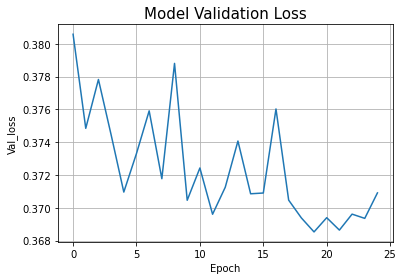

In [109]:
plt.title('Model Validation Loss', size='15')
plt.xlabel('Epoch')
plt.ylabel('Val_loss')
plt.grid(True)
plt.plot(history.history['val_loss'])

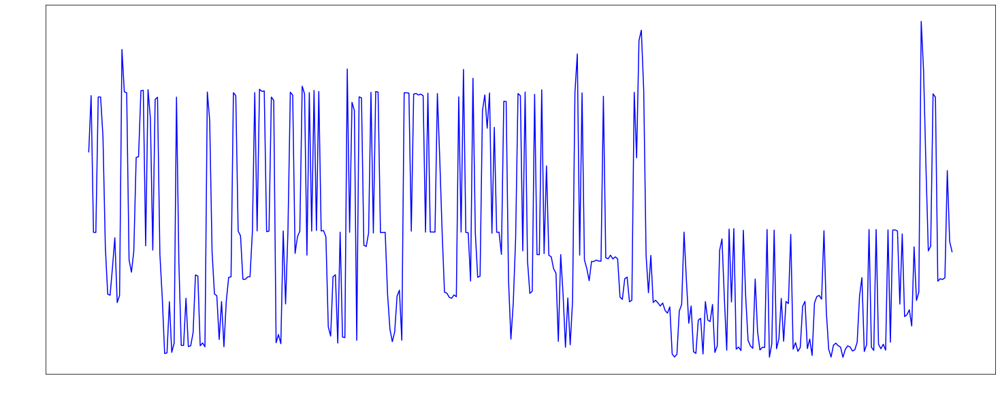

In [110]:
plt.figure(figsize=(25, 10))

plt.tick_params(axis='x', colors='white', size=10)
plt.tick_params(axis='x', colors='white', labelsize=12)
plt.tick_params(axis='y', colors='white', size=10)
plt.tick_params(axis='y', colors='white', labelsize=12)

plt.plot(pred, label = 'Prediction',color='blue')
plt.xticks([0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])

plt.savefig('./Graph/Prediction.png')
plt.show()

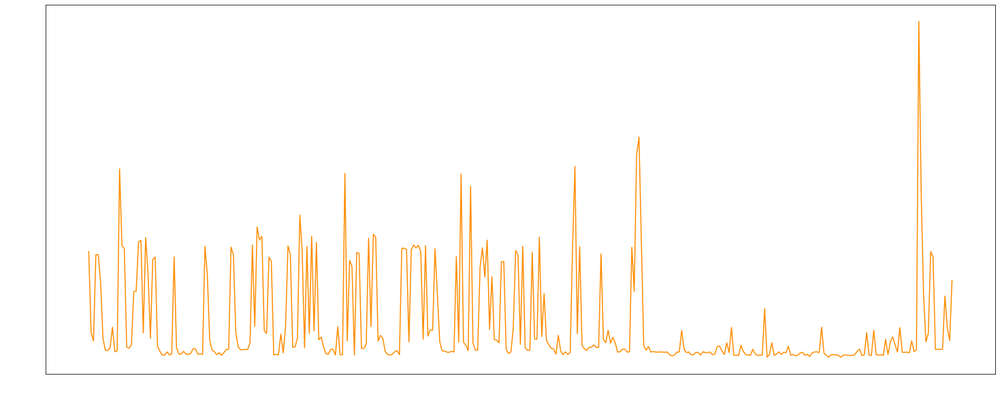

In [111]:
plt.figure(figsize=(25, 10))

plt.tick_params(axis='x', colors='white', size=10)
plt.tick_params(axis='x', colors='white', labelsize=12)
plt.tick_params(axis='y', colors='white', size=10)
plt.tick_params(axis='y', colors='white', labelsize=12)

plt.plot(y_test, label = 'Actual', color='darkorange')
plt.xticks([0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])

plt.savefig('./Graph/Actual.png')
plt.show()

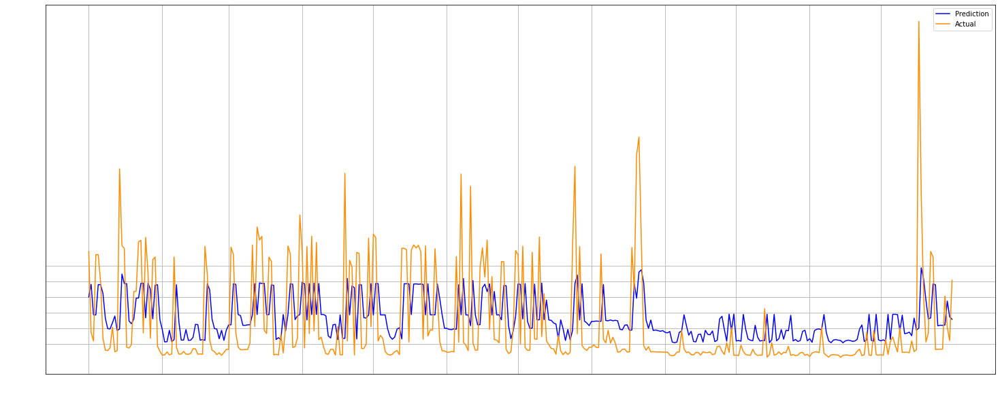

In [112]:
plt.figure(figsize=(25, 10))

plt.tick_params(axis='x', colors='white', size=10)
plt.tick_params(axis='x', colors='white', labelsize=12)
plt.tick_params(axis='y', colors='white', size=10)
plt.tick_params(axis='y', colors='white', labelsize=12)

plt.plot(pred, label = 'Prediction',color='blue')
plt.plot(y_test, label = 'Actual', color='darkorange')
plt.xticks([0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['0', '2000 W', '3500 W', '5500 W', '7000 W', '8500 W'])
plt.grid(True)
plt.legend()
plt.show()

### 그래프 유사도 비교 결과

In [113]:
import cv2
from skimage.metrics import structural_similarity as ssim

In [114]:
# 유사도 측정을 위한 이미지 가공
image1 = cv2.imread('./Graph/Prediction.png')
image2 = cv2.imread('./Graph/Actual.png')

tempDiff1 = cv2.subtract(image1, image2)

gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

In [115]:
# 차이 추출을 위한 뺄셈 과정
pred_list=pred.tolist()
actual_list=y_test.tolist()

result_numbers=[]
for minus in range(len(pred_list)):
    result = abs(float(pred_list[minus][0]) - float(actual_list[minus][0]))
    result_numbers.append(result)

In [116]:
(score, diff) = ssim(gray1, gray2, full=True)
print('그래프 유사도 ==>> %.3f %%\n' %(round(score,5)*100))
print('예측값과 실제값의 차이 절댓값 총합 ==>>',round(sum(result_numbers),3))

그래프 유사도 ==>> 79.720 %

예측값과 실제값의 차이 절댓값 총합 ==>> 158.495


### 예측값과 실제값 csv 저장

In [93]:
# 날짜 정보 생성
datetime_list=[]
for m in range(1, 13):
    month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}
    for d in range(month[m]):
        d=d+1
        m=int(m)
        d=int(d)
        
        if m<=9:
            m='0'+str(m)
        if d<=9:
            d='0'+str(d)
        elem = '2016'+'-'+str(m)+'-'+str(d)
        datetime_list.append(elem)

In [94]:
# 넘파이 어레이를 데이터 프레임으로 변환
pred_df = pd.DataFrame(pred)
actual_df = pd.DataFrame(y_test)

In [95]:
df_for_chart = pd.DataFrame(columns=['datetime', 'pred', 'actual'])
df_for_chart['datetime']=datetime_list
df_for_chart['pred']=pred_df
df_for_chart['actual']=actual_df
df_for_chart
df_for_chart.to_csv("./Electric_Prediction_result_data_for_Chart.csv", encoding='cp949')